<img src="../../images/wt4.png" align="right" width="70"/>

  #     Notebook for early bearing fault detection for WT01



## Table of contents
1. Load Raw filtered signal
2. Extract Optimal Bandwidth Based on SK
3. Read Kurtogram Plots
4. Filter Signal with Optimal Bandpass Based on SK
5. Frequency study: obtain different envelope order spectrums for different narrow-bands

In [1]:
%load_ext autoreload

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os,os.path
from scipy.stats import kurtosis, skew

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
module_paths = []
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/hybrid_analysis_process_functions/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/utils/")))
for module_path in module_paths:
    if module_path not in sys.path:
        print("appended")
        sys.path.append(module_path)
%autoreload
import functions as f
import wt_data, ff_transform, explore_fft_time_data, envelope, build_dataset, load_raw_signals, envelope, envelope_emd,plotting_methods
import resample_signals, filter_signals, plotting_methods,filters,correlation_coeff


appended
appended
appended
ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
/Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src


## 1. Load Raw Filtered signal 

In [3]:
turbine = 'wt01'
vib_signals, times, op_data_intervals, peak_array = load_raw_signals.load_raw('gearbox',turbine)
avg_rpm = np.asarray(op_data_intervals['AvgSpeed'])
avg_power = np.asarray(op_data_intervals['AvgPower'])

wt_date_path = f'/Volumes/OsvikExtra/signal_data/raw_data/gearbox/{turbine}/'
dates = pd.read_csv(f'{wt_date_path}interval_dates_{turbine}.csv')
dates = dates.drop(columns=['Unnamed: 0'])


File exist


In [5]:
# Reading filtered from disk
wt_folder_path = f'/Volumes/OsvikExtra/signal_data/raw_filtered_6000Hz/gearbox/{turbine}/'
filtered_path = f'{wt_folder_path}filtered/'

num_csvs = len([f for f in os.listdir(filtered_path) 
     if f.endswith('.csv') and os.path.isfile(os.path.join(filtered_path, f)) and f[0]=='f'])

filtered_signals = []
filtered_freqs = []
columns = []
for i in range(num_csvs):
    acc=pd.read_csv(filtered_path+'filtered_raw_6000_'+str(i)+'.csv')
    columns.append('filtered_' + str(i))
    filtered_signals.append(acc.values.T[0])
    filtered_freqs.append(acc.shape[0] / times[i][-1])
    print(f'Reading {i+1} / {num_csvs} files', end='\r')

## 2. Extract Optimal Bandwidth Based on SK

In [6]:
# Finding the optimal bandwidth by taking the mean from the SK
fc_and_bw_path = f'{wt_folder_path}center_frequencies_&_bandwidth/fc_and_bw_data.csv'
# Finding the optimal bandwidth by taking the mean from the SK
fc_and_bw_data = pd.read_csv(fc_and_bw_path)
fc_and_bw_data

,File,Frequencies,Bandwidths
0,filtered_raw_6000_0.csv,9600.036621,6400.024414
1,filtered_raw_6000_1.csv,6325.024128,50.000191
2,filtered_raw_6000_10.csv,9600.036621,6400.024414
3,filtered_raw_6000_100.csv,9600.036621,6400.024414
4,filtered_raw_6000_101.csv,9600.036621,6400.024414
5,filtered_raw_6000_102.csv,3875.014782,50.000191
6,filtered_raw_6000_103.csv,5325.020313,50.000191
7,filtered_raw_6000_104.csv,9600.036621,6400.024414
8,filtered_raw_6000_105.csv,9600.036621,6400.024414
9,filtered_raw_6000_106.csv,5675.021648,50.000191


Before filter shape: (410, 9)
After filtering: (309, 9)


,Unnamed: 0,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,File,Frequencies,Bandwidths
0,0,543.488892,499.299988,5.5,206.000000,1094.439658,0,9600.036621,6400.024414
1,1,2500.973877,3090.899902,13.0,232.899994,1511.167622,1,6325.024128,50.000191
2,2,2565.207520,2660.399902,9.9,53.900002,1472.724506,2,9600.036621,6400.024414
3,3,2861.552002,3301.899902,12.0,262.399994,1499.039959,3,9600.036621,6400.024414
4,4,424.546143,418.600006,6.1,329.399994,999.524512,4,9600.036621,6400.024414
5,5,2440.011230,3288.500000,12.8,245.600006,1512.132321,5,5225.019932,50.000191
6,6,3073.377930,3307.399902,15.1,245.600006,1492.741102,6,7325.027943,50.000191
7,7,2630.640625,2335.399902,7.3,296.399994,1458.801583,7,9600.036621,6400.024414
8,8,2657.162842,2366.399902,11.3,113.199997,1423.244689,8,4725.018025,50.000191
9,9,1978.277466,2519.500000,10.1,166.699997,1483.192035,9,3825.014591,50.000191


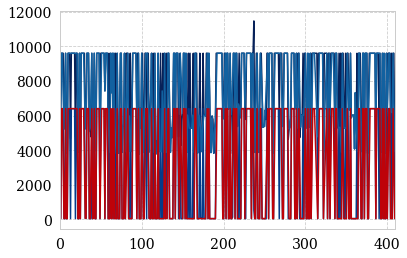

In [7]:
# Make the file column to an int
fc_and_bw_data['File']=fc_and_bw_data['File'].apply(lambda x: int((str(x).split('_'))[3].split('.csv')[0]))
# Sort the df based on this
fc_and_bw_data=fc_and_bw_data.sort_values('File',ascending=True)
fc_and_bw_data = fc_and_bw_data.reset_index(drop=True)

# How the frequencies and bandwidths vary across the intervals for wt:
fc_and_bw_data['Frequencies'].plot()
fc_and_bw_data['Bandwidths'].plot()

op_data_intervals
concated = pd.concat([op_data_intervals, fc_and_bw_data],axis=1)

print(f"Before filter shape: {concated.shape}")
filter_concated = concated.loc[(concated['AvgSpeed'] >= 1400)]
print(f"After filtering: {filter_concated.shape}")
mean_freq = filter_concated['Frequencies'].mean()
mean_bw = filter_concated['Bandwidths'].mean()
filter_concated['Frequencies'].plot()
filter_concated['Bandwidths'].plot()
concated

## 3. Read Kurtogram Plots

In [8]:
# Read kurtogram data
fc_and_bw_path = f'{wt_folder_path}center_frequencies_&_bandwidth/fc_and_bw_data.csv'
frequencies_path = f'{wt_folder_path}center_frequencies_&_bandwidth/frequencies.csv'
file_names_path = f'{wt_folder_path}center_frequencies_&_bandwidth/file_name.txt'

file_names = pd.read_csv(file_names_path, header=None)

frequencies = pd.read_csv(frequencies_path)
frequencies_numpy = np.asarray(frequencies).T
frequencies = pd.DataFrame(frequencies_numpy, columns= frequencies_numpy[0])
frequencies = frequencies.drop(frequencies.index[0]).reset_index(drop=True)

fc_and_bw = pd.read_csv(fc_and_bw_path)
fc_bw_numpy = fc_and_bw.values.T
fc_bw_pd = pd.DataFrame(fc_bw_numpy, columns=fc_bw_numpy[0])
fc_bw_pd = fc_bw_pd.drop(fc_bw_pd.index[0])
fc_bw_pd.insert(0, 'RowName', ['Center Frequency', 'BandWidth'])
fc_bw_pd=fc_bw_pd.set_index('RowName')
fc_bw_pd

,filtered_raw_6000_0.csv,filtered_raw_6000_1.csv,filtered_raw_6000_10.csv,filtered_raw_6000_100.csv,filtered_raw_6000_101.csv,filtered_raw_6000_102.csv,filtered_raw_6000_103.csv,filtered_raw_6000_104.csv,filtered_raw_6000_105.csv,filtered_raw_6000_106.csv,...,filtered_raw_6000_90.csv,filtered_raw_6000_91.csv,filtered_raw_6000_92.csv,filtered_raw_6000_93.csv,filtered_raw_6000_94.csv,filtered_raw_6000_95.csv,filtered_raw_6000_96.csv,filtered_raw_6000_97.csv,filtered_raw_6000_98.csv,filtered_raw_6000_99.csv
RowName,,,,,,,,,,,,,,,,,,,,,
Center Frequency,9600.04,6325.02,9600.04,9600.04,9600.04,3875.01,5325.02,9600.04,9600.04,5675.02,...,9600.04,9600.04,9600.04,9600.04,5825.02,9600.04,9600.04,3775.01,6425.02,5275.02
BandWidth,6400.02,50.0002,6400.02,6400.02,6400.02,50.0002,50.0002,6400.02,6400.02,50.0002,...,6400.02,6400.02,6400.02,6400.02,50.0002,6400.02,6400.02,50.0002,50.0002,50.0002


In [8]:
def flip_date(date):
    splitted_date = date.split('-')
    year  = splitted_date[0]
    month = splitted_date[1]
    day   = splitted_date[2].split(' ')[0]
    time  = splitted_date[2].split(' ')[1]
    new_date = day + '.' + month + '.' + year + ' ' + time
    return new_date

Avg Power: 2861.552001953      Avg RPM: 1499.0399593194193


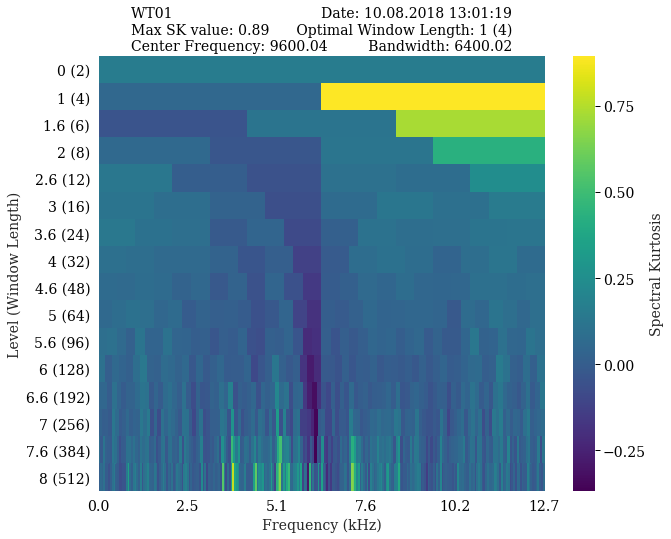

Avg Power: 3294.192626953      Avg RPM: 1531.6417398927317


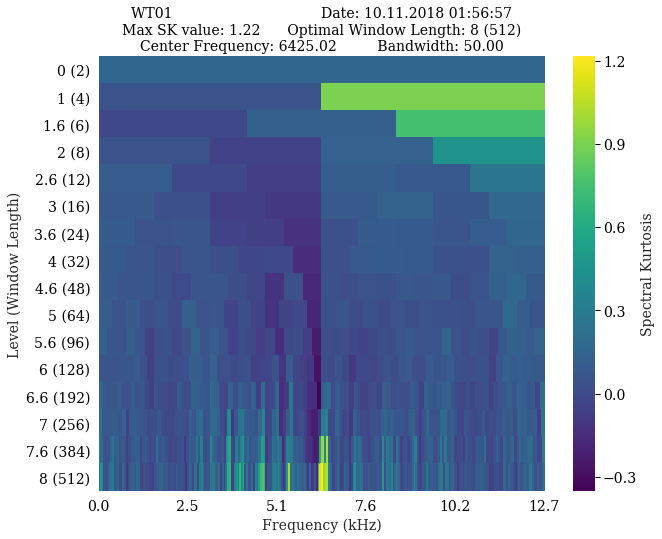

Avg Power: 2914.9072265629998      Avg RPM: 1488.606251760245


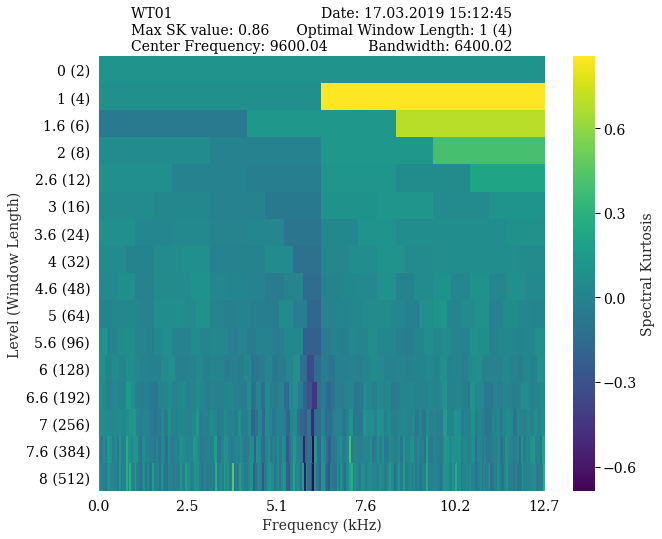

Avg Power: 3305.237060547      Avg RPM: 1505.7014568970176


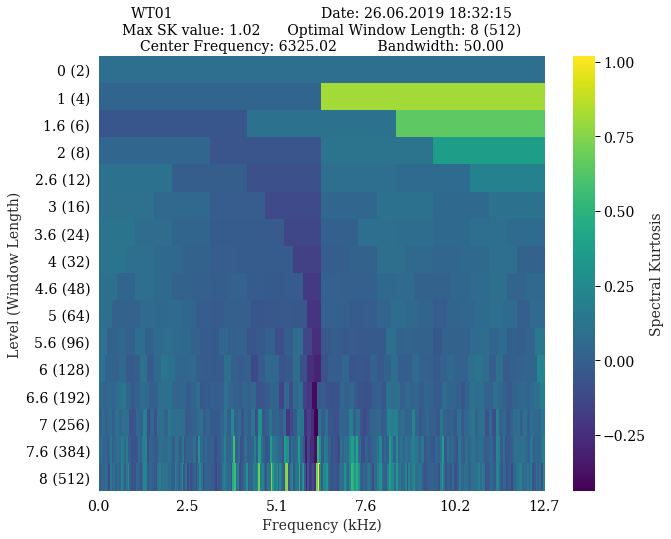

Avg Power: 2905.6330566409997      Avg RPM: 1489.729665160107


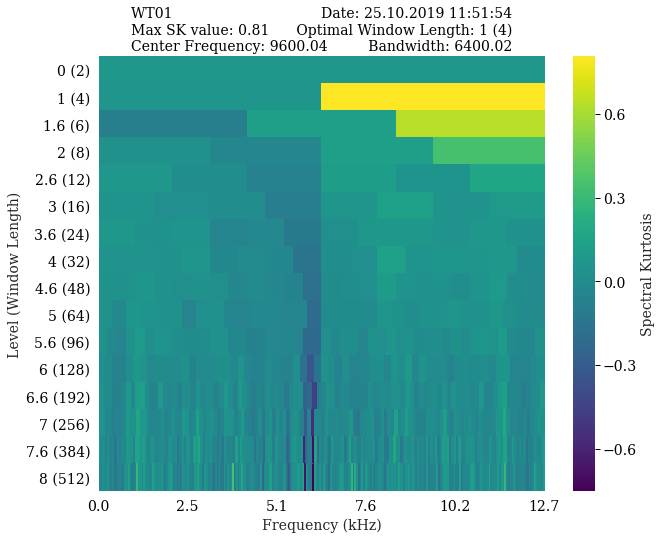

In [10]:
kurt_path = f'{wt_folder_path}kurtograms/';
#save_path = f'{wt_folder_path}kurt_plots/';
save_path = '../../plots/kurt_plots_right_interval/'
wt=turbine
num_csvs = len([f for f in os.listdir(kurt_path) 
     if f.endswith('.csv') and f[0]=='k' and os.path.isfile(os.path.join(kurt_path, f))])

interesting_intervals = [3, 98, 204, 301, 407]
#for i in range(num_csvs):
for i in interesting_intervals:
    #if i > 3:
    #    break
    if False: #(i > 20 and i < 90) or (i > 110 and i < 290) or (i > 380 and i < 400) or (i > 400):
        continue
    filename = f'kgram_filtered_raw_6000_{i}.csv'
    if avg_power[i] > 2800:
        kurt_file = f'{kurt_path}{filename}'
        kurtogram = pd.read_csv(kurt_file, header=None)
        
        frequency_filename = '_'.join(filename.split('_')[1:])
        
        max_SK = np.max(np.max(kurtogram))
        center_frequency = fc_bw_pd[frequency_filename][0]
        bandwidth = fc_bw_pd[frequency_filename][1]
        highest_window = np.argmax(kurtogram.max(axis=1))
        dato = flip_date(dates.values[i][0])
        name = f'WT01                                 Date: {dato}'
        #name += f'\nAvg Power: {avg_power[i]:.2f}     Avg RPM: {avg_power[i]:.2f}'
        file_name = f'{save_path}kurt_{turbine}_{i}'

        print(f'Avg Power: {avg_power[i]}      Avg RPM: {avg_rpm[i]}')
        _ = plotting_methods.plot_kurtogram(kurtogram, 
                                        frequencies[frequency_filename], 
                                        file_name=frequency_filename,
                                        max_sk=max_SK,
                                        cf=center_frequency,
                                        bw=bandwidth,
                                        wt=wt,
                                        window=highest_window,
                                        title=name,
                                        save_path=file_name)

        print(f'Plot {i+1} / {num_csvs} created', end='\r')


## 4. Filter Signal with Average Optimal Bandpass Based on SK

In [9]:
# Perform bandpass filtering on the raw signal!
def filter_based_on_optimal_bw(low,high,signal,time,plot=False):
    #use_signal = sig
    #signal = use_signal
    fs, _, _, _ =  envelope.get_sampling_freq(signal, time)
    
    #### Hardcoding the filters
    y = filters.butter_bandpass_filter(signal,low,high,fs)
    if plot:
        plt.plot(signal)
        plt.margins(0)
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.show()
        plt.title('Resampled signal with highpass filtering')
        plt.plot(y)
        plt.xlabel("Samples")
        plt.margins(0)
        plt.ylabel("Amplitude")
        plt.title(f'Interval {i} from {turbine} filtered with average optimal bandpass from SK \n Component: Gearbox')
    return y

# Just loop through
optimal_bandpass_signals = []
signal_size = len(filtered_signals)
for i in range(len(filtered_signals)):
    use_signal = filtered_signals[i][0:(len(filtered_signals[i])//2)]
    time = times[i][0:(len(filtered_signals[i])//2)]
    low = mean_freq - mean_bw/4
    high = mean_freq + mean_bw/4
    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    optimal_bandpass_signals.append(y)
    #plotting_methods.plot_fft(time, use_signal, interval_num=i)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')
#del filtered_signals

## 5. Frequency study (fault characteristics), fault development

### Exploring Envelope Order Spectrums of Different Frequency Ranges
Using 80% of nominal power: only comparing intervals with average power > 2400

### 5.1 Filter Signal with Individual Optimal Bandpass Based on SK

In [10]:
def normalise_fft(fft):
    N = fft.shape[0]
    y = np.abs(fft)[:N // 2] * 1 / N  # Normalized
    return y

In [11]:
fs = 25600

In [12]:
# Just loop through
optimal_bandpass_individual = []
signal_size = len(vib_signals)
for i in range(len(vib_signals)):
    use_signal = vib_signals[i]
    time = times[i]
    cf = float(concated['Frequencies'][i])
    bw = float(concated['Bandwidths'][i])
    low = cf - bw/2
    high = cf + bw/2
    #if bw < 100:
    #    low = cf - bw*3
    #    high = cf + bw*3
    if high > 0.5*fs:
        high = 0.5*fs -100
    
    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    optimal_bandpass_individual.append(y)
    #plotting_methods.plot_fft(time, use_signal, interval_num=i)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')

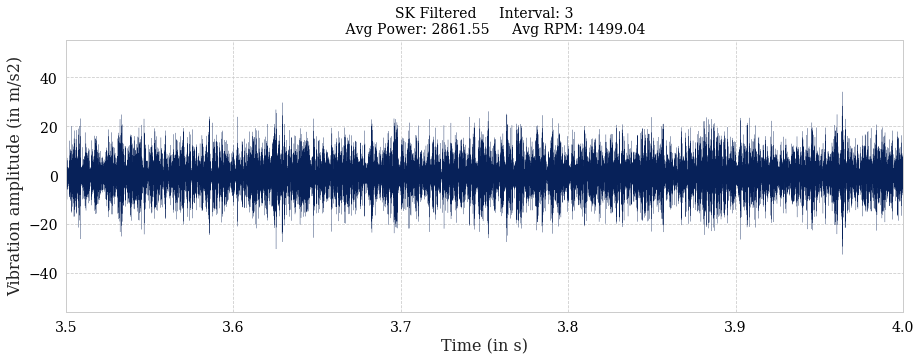

3
Kurtosis of 3 0.167
Center Frequency: 9600.037
Bandwidth from SK: 6400.024
Used Bandwidth: 51200.195
Used Bandwidth in orders: 1536.990


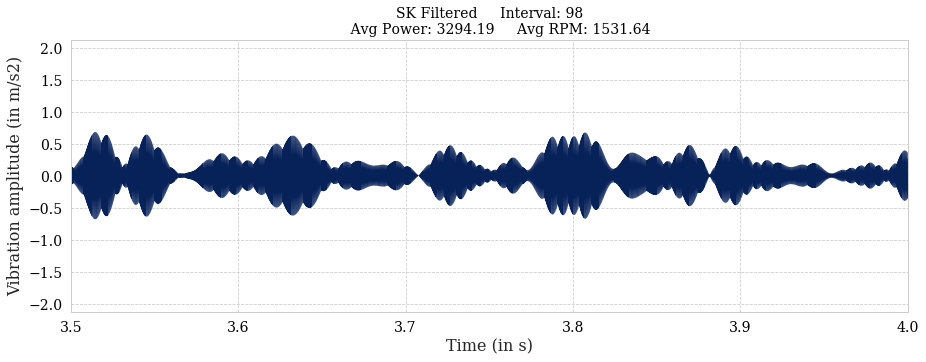

98
Kurtosis of 98 2.761
Center Frequency: 6425.025
Bandwidth from SK: 50.000
Used Bandwidth: 400.002
Used Bandwidth in orders: 11.752


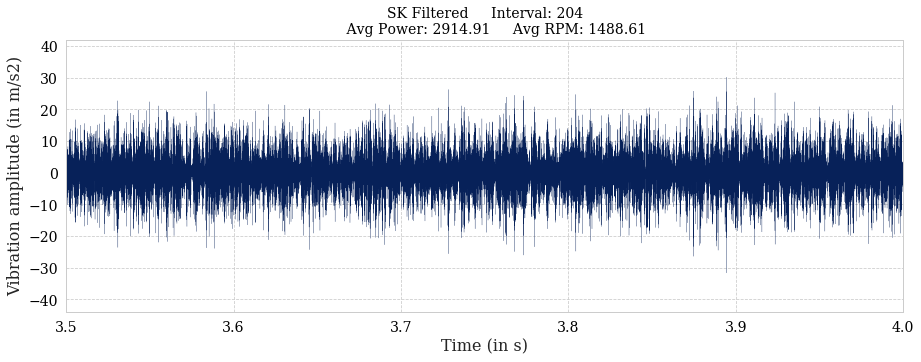

204
Kurtosis of 204 0.109
Center Frequency: 9600.037
Bandwidth from SK: 6400.024
Used Bandwidth: 51200.195
Used Bandwidth in orders: 1547.762


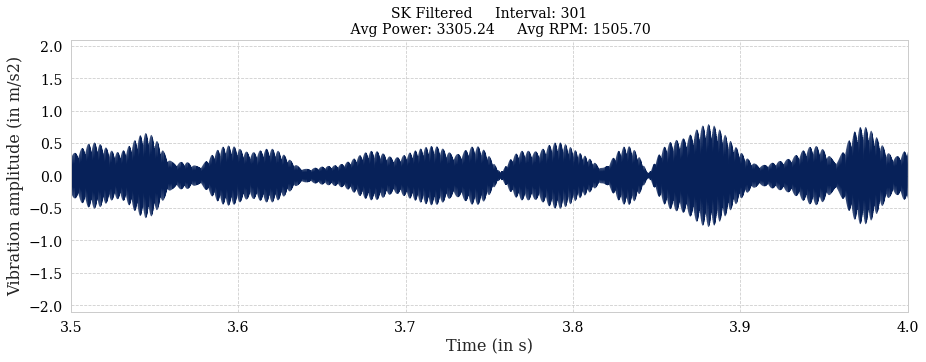

301
Kurtosis of 301 2.975
Center Frequency: 6325.024
Bandwidth from SK: 50.000
Used Bandwidth: 400.002
Used Bandwidth in orders: 11.955


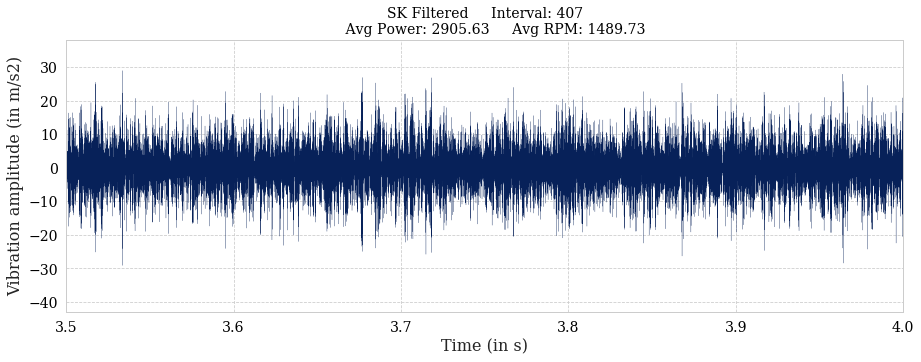

407
Kurtosis of 407 0.078
Center Frequency: 9600.037
Bandwidth from SK: 6400.024
Used Bandwidth: 51200.195
Used Bandwidth in orders: 1546.595


In [13]:
interesting_intervals = [3, 98, 204, 301, 407]

all_fft_res  = []
all_freq_res = []
all_fft      = []
all_freq     = []

#for i, signal in enumerate(optimal_bandpass_individual):
for i in interesting_intervals:
    bw = float(concated['Bandwidths'][i])
    if avg_power[i] < 2700:
        continue
    #if bw < 1000 and i<50:# or (i>50 and i<60) or (i > 190 and i < 200)):
    if True: #i<20 or (i>50 and i<60) or (i > 190 and i < 200):
        # Plot SK filtered signal
        plotting_methods.plot_signal(times[i][0:], optimal_bandpass_individual[i],x_max=4, x_min=3.5,name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        fft, freq = plotting_methods.plot_fft(times[i][1:], optimal_bandpass_individual[i], name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        all_fft.append(normalise_fft(fft))
        all_freq.append(freq)
        #Calcutale envelope
        print(i)
        
        highut_lp = 1000
        rectified = abs(optimal_bandpass_individual[i])**2
        bandpass_filtered_rect_lp = filters.butter_lp_filter(rectified, highut_lp, fs, order=5)
    
        #Calculate Envelope Order
        try:
            x_round, resampled_envelope, x_time = resample_signals.do_cubic_resampling(times[i][1:], bandpass_filtered_rect_lp, peak_array[i], number_of_resample_points=2000)
            fft_res, freq_res = plotting_methods.plot_fft(x_round, resampled_envelope, x_max=15,frequency_lines=[], name='SK Filtered Envelope Order', interval_num=i) #, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
            all_fft_res.append(normalise_fft(fft_res))
            all_freq_res.append(freq_res)
        except:
            print('---------------------------------------\n\n')
            print(f'              INTERVAL {i}')
            print('ENVELOPE ORDER COULD NOT BE CALCULATED!\n\n')
            print('---------------------------------------')
        print(f'Kurtosis of {i} {kurtosis(optimal_bandpass_individual[i]):.3f}')
        print(f'Center Frequency: {concated["Frequencies"][i]:.3f}')
        print(f'Bandwidth from SK: {concated["Bandwidths"][i]:.3f}')
        print(f'Used Bandwidth: {concated["Bandwidths"][i]*8:.3f}')
        print(f'Used Bandwidth in orders: {concated["Bandwidths"][i]*6*60/avg_rpm[i]:.3f}')

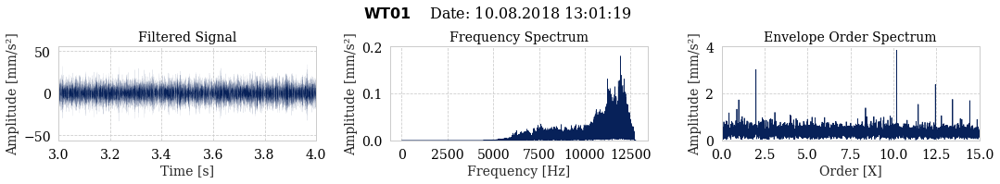

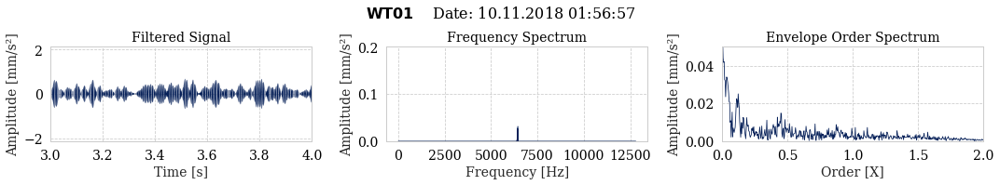

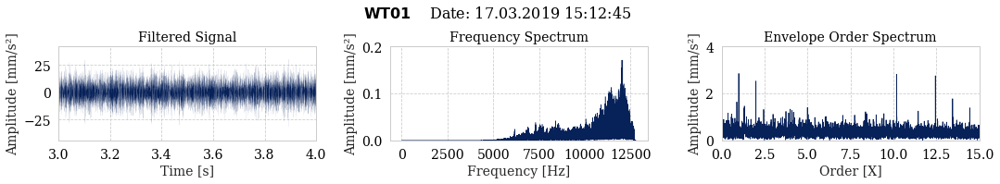

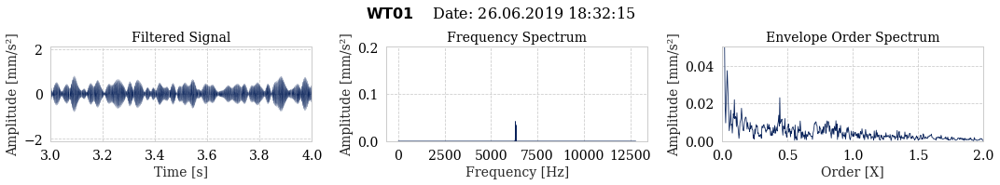

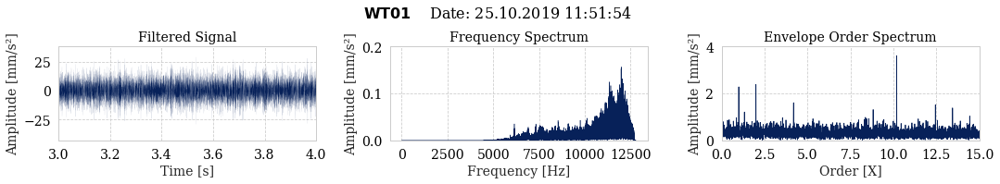

In [14]:
rows = 1
cols = 3
save_path = '../../plots/envelope_order_sk/'

for i, interval in enumerate(interesting_intervals):
    fig, ax = plt.subplots(rows, cols,figsize=(15,2.5))
    dato = flip_date(dates.values[interval][0])
    my_suptitle = fig.suptitle(r"$\bf{WT01}$" + f'    Date: {dato}',fontsize=16, y=1.09)

    ax[0].plot(times[interval][0:], optimal_bandpass_individual[interval], linewidth=0.05)
    ax[0].set_title(f"Filtered Signal")
    ax[0].set_ylabel("Amplitude [mm/s\u00b2]")
    ax[0].set_xlabel("Time [s]")
    ax[0].set_xlim(3, 4)

    ax[1].plot(all_freq[i], all_fft[i], linewidth=0.5)
    ax[1].set_title(f"Frequency Spectrum")
    ax[1].set_ylabel("Amplitude [mm/s\u00b2]")
    ax[1].set_xlabel("Frequency [Hz]")
    ax[1].set_ylim(0, 0.2)
    
    ax[2].plot(all_freq_res[i], all_fft_res[i], linewidth=0.8)
    ax[2].set_title(f"Envelope Order Spectrum")
    ax[2].set_ylabel("Amplitude [mm/s\u00b2]")
    ax[2].set_xlabel("Order [X]")
    ax[2].set_xlim(left=0)
    ax[2].set_ylim(bottom=0)
    
    if i == 1 or i == 3:
        ax[2].set_xlim(right=2)
        ax[2].set_ylim(top=0.05)
    else:
        ax[2].set_xlim(right=15)
        ax[2].set_ylim(top=4)
        
    plt.tight_layout()
    plt.margins(0)
    plt.savefig(f'{save_path}wt01_{interval}.png', dpi=300, bbox_extra_artists=[my_suptitle], bbox_inches='tight')
    plt.show()

### 5.2 Highpass Filter with Lowcut 2500Hz

In [39]:
# Just loop through
bandpassed_2K = []
signal_size = len(vib_signals)
for i in range(len(vib_signals)):
    use_signal = vib_signals[i]
    time = times[i]
    
    low = 2500
    high = 12700

    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    bandpassed_2K.append(y)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')

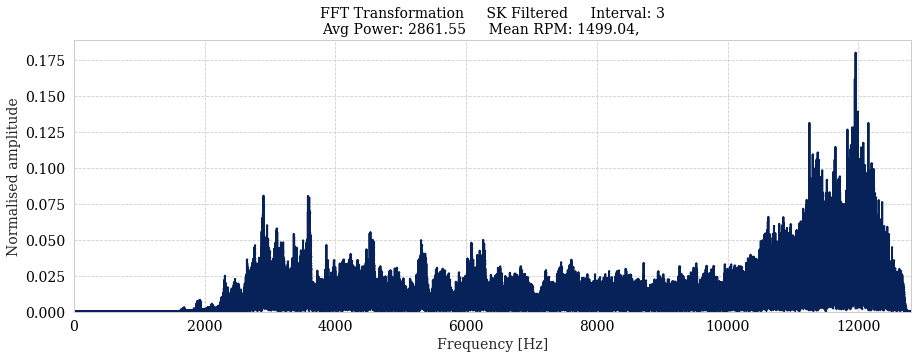

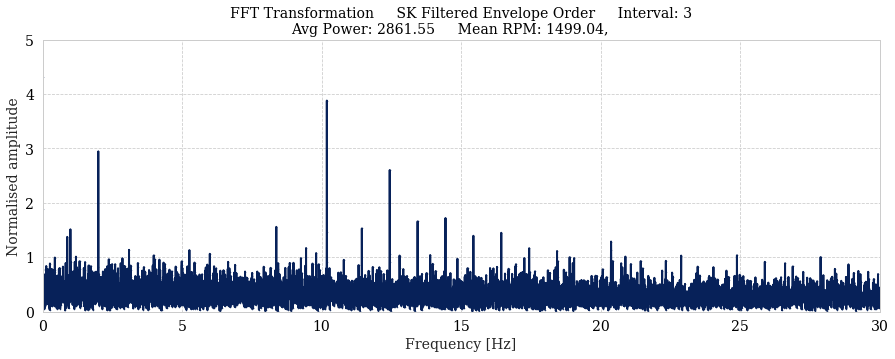

Kurtosis of 3 0.107
Center Frequency: 2500.000
Used Bandwidth in orders: 16.010


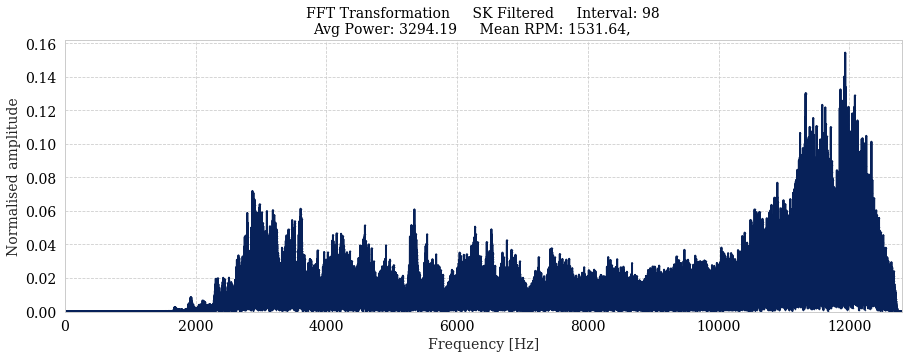

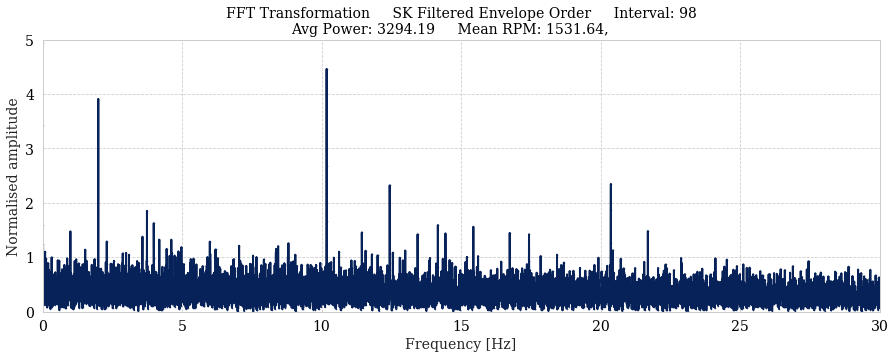

Kurtosis of 98 0.120
Center Frequency: 2500.000
Used Bandwidth in orders: 15.669


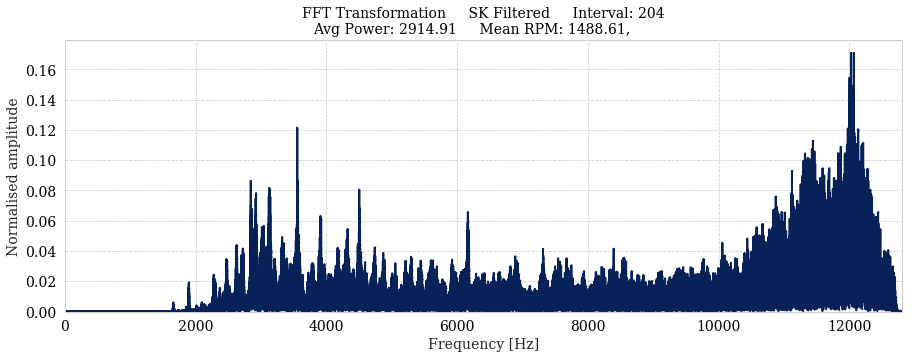

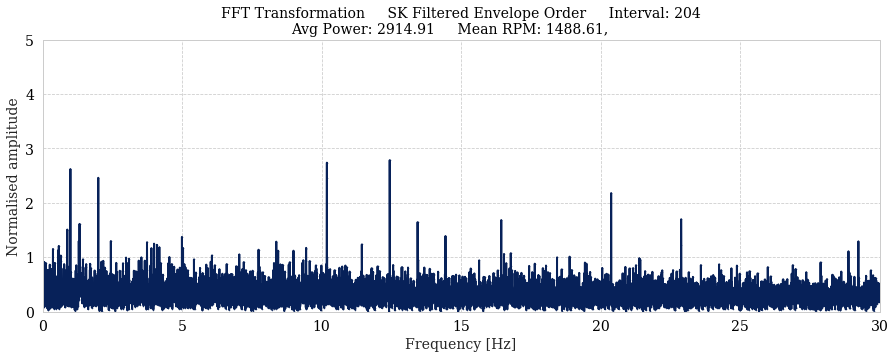

Kurtosis of 204 0.070
Center Frequency: 2500.000
Used Bandwidth in orders: 16.122


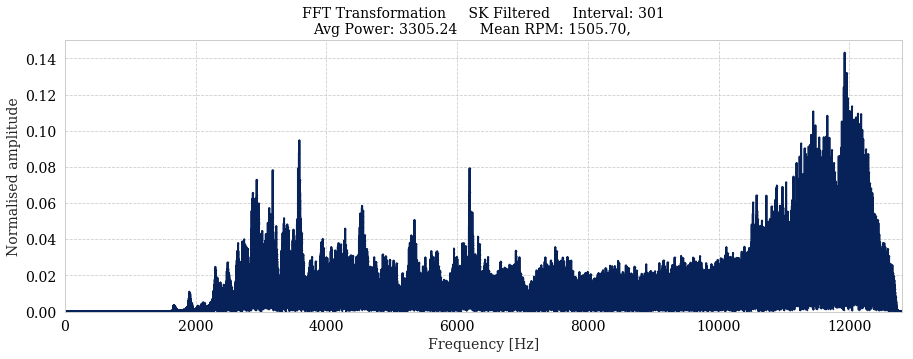

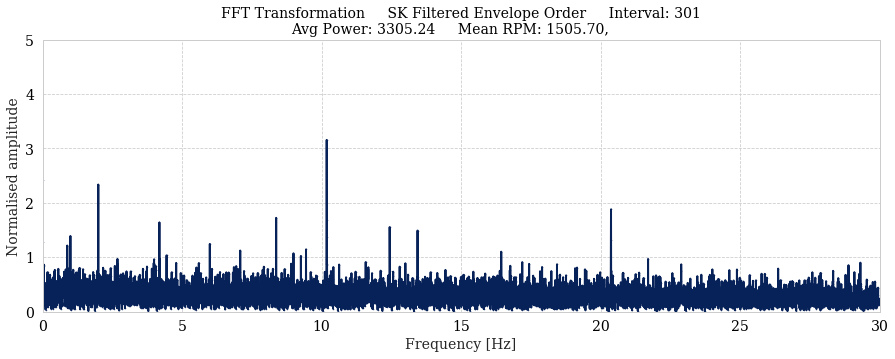

Kurtosis of 301 0.058
Center Frequency: 2500.000
Used Bandwidth in orders: 15.939


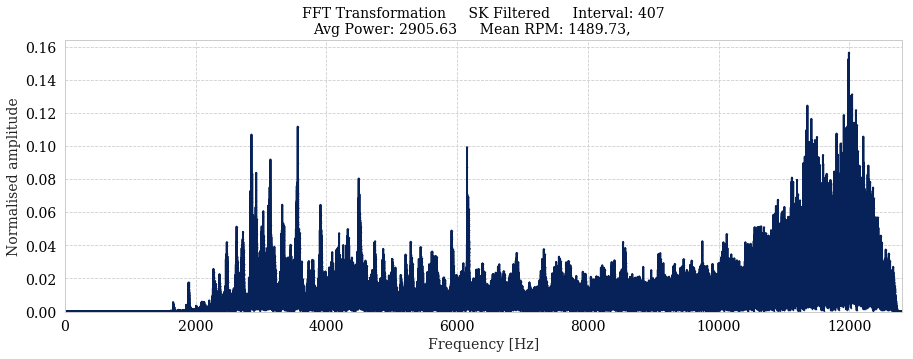

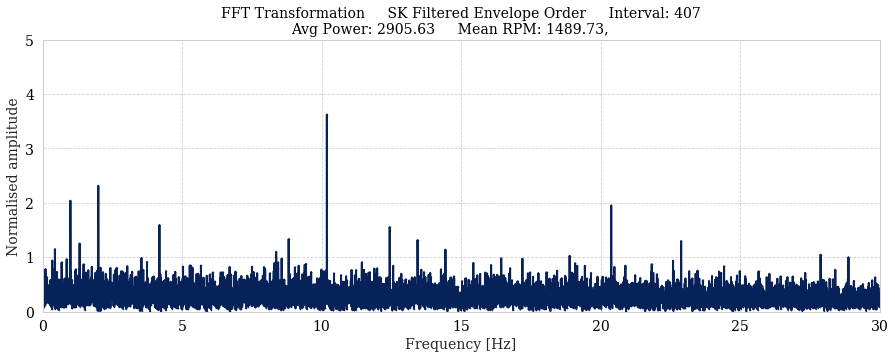

Kurtosis of 407 0.057
Center Frequency: 2500.000
Used Bandwidth in orders: 16.110


In [42]:
interesting_intervals = [3, 98, 204, 301, 407]
bandpassed_signal = bandpassed_2K
cf =2500
ffts = []
fft_times = []

#for i, signal in enumerate(bandpassed_signal):
for i in interesting_intervals:
    if avg_power[i] < 2400:
        continue
    bw = float(concated['Bandwidths'][i])
    if i == 50:
        print('------------------------------------------------\n\n')
        print('               FIRST 50 FINISHED')
        print('\n\n------------------------------------------------')
    if True: #i< 50 or i>370: #bw < 1000 and i<50:# or (i>50 and i<60) or (i > 190 and i < 200)):
        # Plot SK filtered signal
        #plotting_methods.plot_signal(times[i][1:], bandpassed_signal[i],name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        plotting_methods.plot_fft(times[i][1:], bandpassed_signal[i], name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calcutale envelope
        highut_lp = 1000
        rectified = abs(bandpassed_signal[i])**2
        bandpass_filtered_rect_lp = filters.butter_lp_filter(rectified, highut_lp, fs, order=5)
        
        #Plot envelope signal
        one_order = avg_rpm[i]/60
        freq=[one_order]
        #plotting_methods.plot_fft(times[i][1:], bandpass_filtered_rect_lp, x_max=100,frequency_lines=freq,name='SK Filtered Envelope', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calculate Envelope Order
        try:
            x_round, resampled_envelope, x_time = resample_signals.do_cubic_resampling(times[i][1:], bandpass_filtered_rect_lp, peak_array[i], number_of_resample_points=2000)
            fft, fft_time = plotting_methods.plot_fft(x_round, resampled_envelope, x_max=30, y_max=5,frequency_lines=[], name='SK Filtered Envelope Order', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
            ffts.append(normalise_fft(fft))
            fft_times.append(fft_time)
        except: #If resampling fails for some reason
            print('---------------------------------------\n\n')
            print(f'              INTERVAL {i}')
            print('ENVELOPE ORDER COULD NOT BE CALCULATED!\n\n')
            print('---------------------------------------')
        
        # Print key values
        print(f'Kurtosis of {i} {kurtosis(bandpassed_signal[i]):.3f}')
        print(f'Center Frequency: {cf:.3f}')
        print(f'Used Bandwidth in orders: {400*60/avg_rpm[i]:.3f}')


In [25]:
path = wt_folder_path + 'high_pass_2500_.npz'
np.savez(path, fft=ffts, freq=fft_times, intervals=interesting_intervals, dates=dates)


### 5.3 Filter on Center Frequency 6400 Hz and Bandwidth 400 Hz

In [59]:
# Just loop through
bandpassed_6K = []
signal_size = len(vib_signals)
for i in range(len(vib_signals)):
    use_signal = vib_signals[i]
    time = times[i]
    
    cf = 6400
    bw = 50
    low = cf - bw
    high = cf + bw

    if high > 0.5*fs:
        high = 0.5*fs -100    
    
    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    bandpassed_6K.append(y)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')

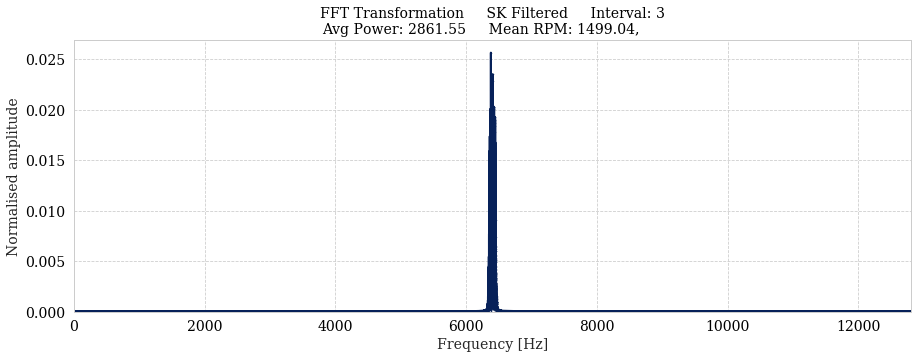

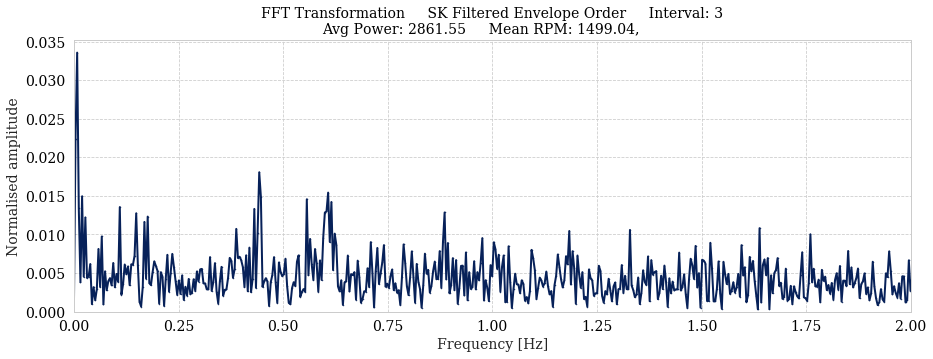

Kurtosis of 3 0.411
Center Frequency: 9000.000
Used Bandwidth in orders: 16.010


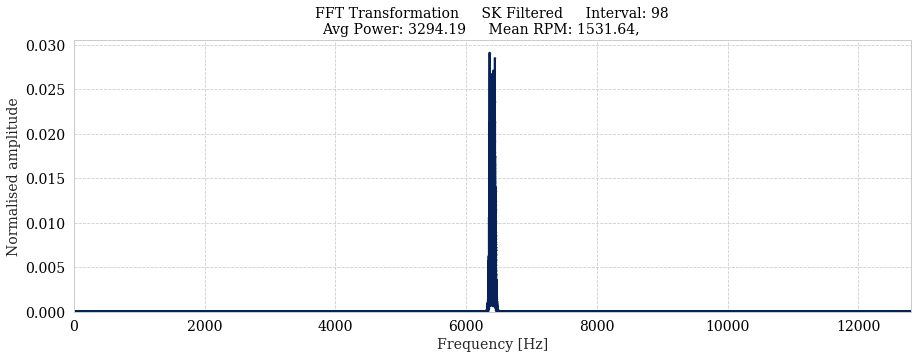

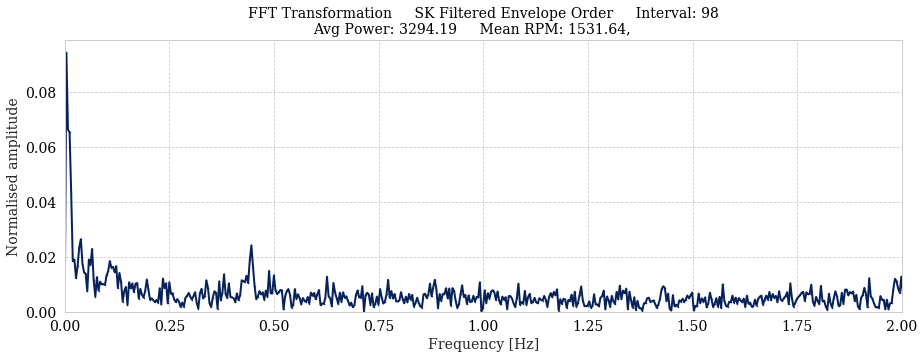

Kurtosis of 98 0.664
Center Frequency: 9000.000
Used Bandwidth in orders: 15.669


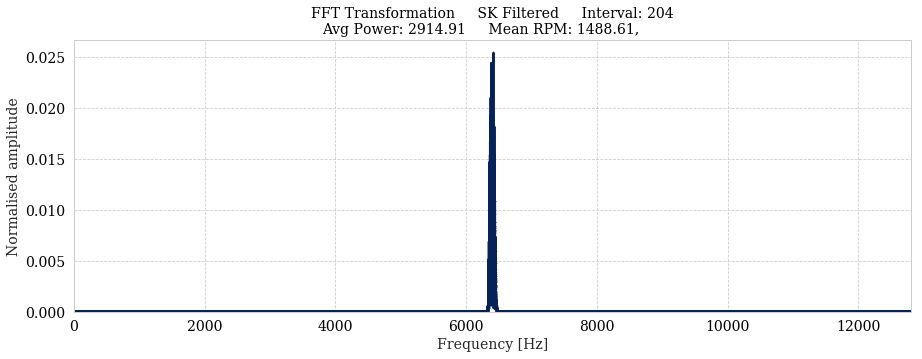

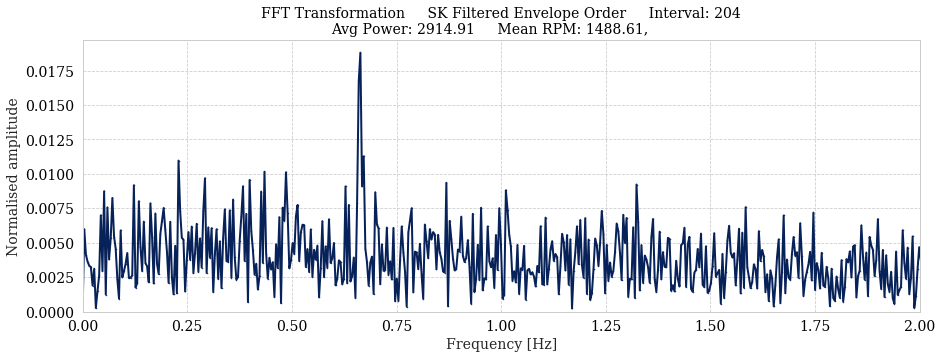

Kurtosis of 204 -0.222
Center Frequency: 9000.000
Used Bandwidth in orders: 16.122


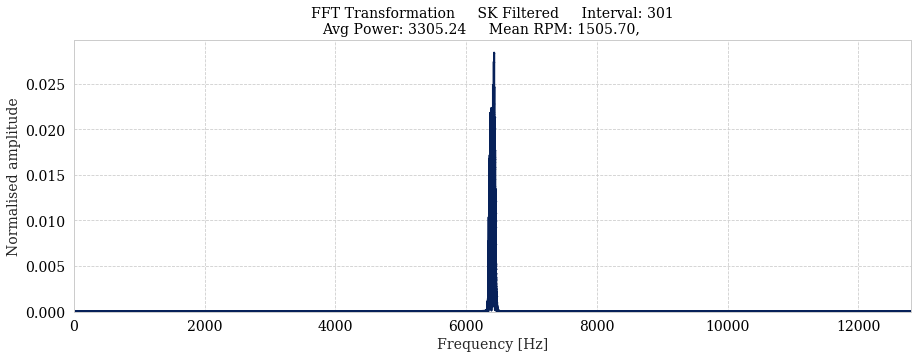

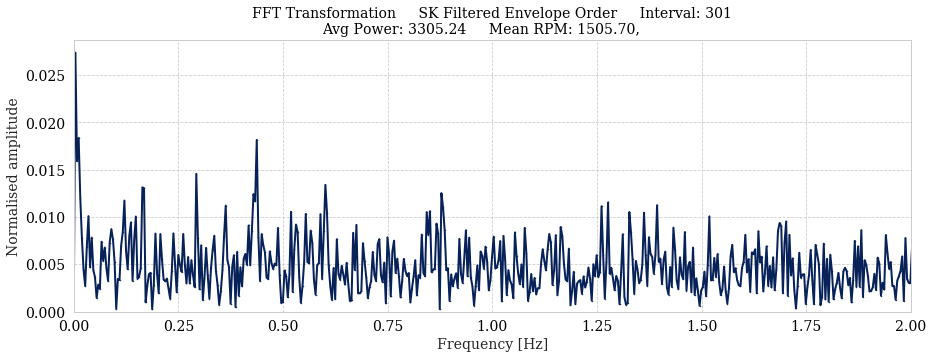

Kurtosis of 301 -0.062
Center Frequency: 9000.000
Used Bandwidth in orders: 15.939


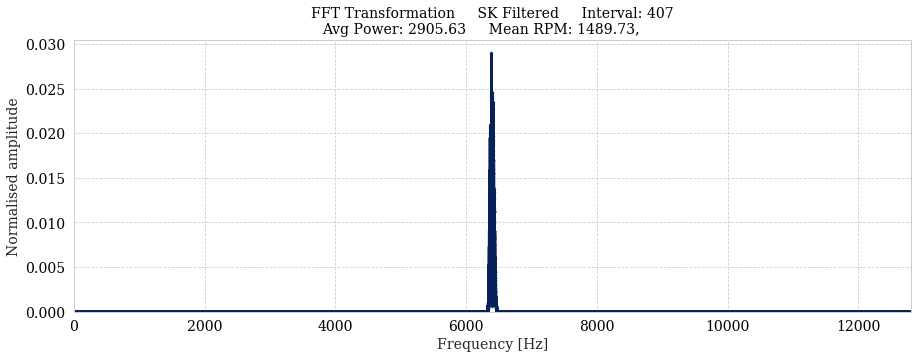

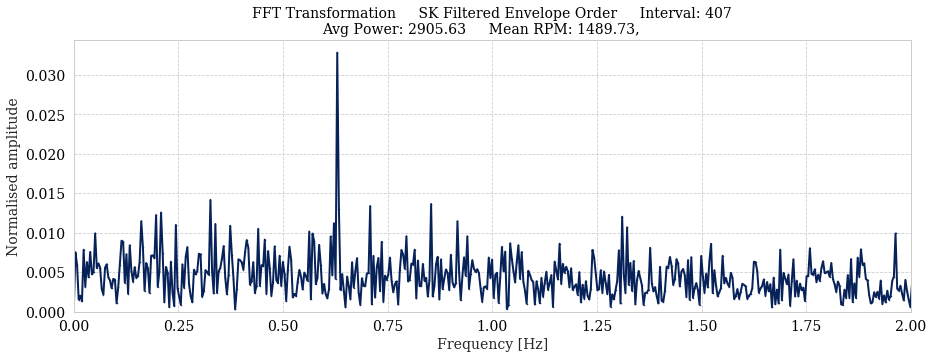

Kurtosis of 407 -0.147
Center Frequency: 9000.000
Used Bandwidth in orders: 16.110


In [60]:
interesting_intervals = [3, 98, 204, 301, 407]
bandpassed_signal = bandpassed_6K
cf =9000
ffts = []
fft_times = []

#for i, signal in enumerate(bandpassed_signal):
for i in interesting_intervals:
    if avg_power[i] < 2400:
        continue
    bw = float(concated['Bandwidths'][i])
    if i == 50:
        print('------------------------------------------------\n\n')
        print('               FIRST 50 FINISHED')
        print('\n\n------------------------------------------------')
    if True: #i< 50 or i>370: #bw < 1000 and i<50:# or (i>50 and i<60) or (i > 190 and i < 200)):
        # Plot SK filtered signal
        #plotting_methods.plot_signal(times[i][1:], bandpassed_signal[i],name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        plotting_methods.plot_fft(times[i][1:], bandpassed_signal[i], name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calcutale envelope
        highut_lp = 1000
        rectified = abs(bandpassed_signal[i])**2
        bandpass_filtered_rect_lp = filters.butter_lp_filter(rectified, highut_lp, fs, order=5)
        
        #Plot envelope signal
        one_order = avg_rpm[i]/60
        freq=[one_order]
        #plotting_methods.plot_fft(times[i][1:], bandpass_filtered_rect_lp, x_max=100,frequency_lines=freq,name='SK Filtered Envelope', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calculate Envelope Order
        try:
            x_round, resampled_envelope, x_time = resample_signals.do_cubic_resampling(times[i][1:], bandpass_filtered_rect_lp, peak_array[i], number_of_resample_points=2000)
            fft, fft_time = plotting_methods.plot_fft(x_round, resampled_envelope, x_max=2, y_max=None,frequency_lines=[], name='SK Filtered Envelope Order', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
            ffts.append(normalise_fft(fft))
            fft_times.append(fft_time)
        except: #If resampling fails for some reason
            print('---------------------------------------\n\n')
            print(f'              INTERVAL {i}')
            print('ENVELOPE ORDER COULD NOT BE CALCULATED!\n\n')
            print('---------------------------------------')
        
        # Print key values
        print(f'Kurtosis of {i} {kurtosis(bandpassed_signal[i]):.3f}')
        print(f'Center Frequency: {cf:.3f}')
        print(f'Used Bandwidth in orders: {400*60/avg_rpm[i]:.3f}')


In [61]:
path = wt_folder_path + 'cf_6425_bw_50.npz'
np.savez(path, fft=ffts, freq=fft_times, intervals=interesting_intervals, dates=dates)


### 5.4 Filter on Center Frequency 9 kHz and Bandwidth 6400 Hz

In [127]:
# Just loop through
bandpassed_9K = []
signal_size = len(vib_signals)
for i in range(len(vib_signals)):
    use_signal = vib_signals[i]
    time = times[i]
    
    cf = 9000
    bw = 6400/2
    low = cf - bw
    high = cf + bw

    if high > 0.5*fs:
        high = 0.5*fs -100    
    
    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    bandpassed_9K.append(y)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')

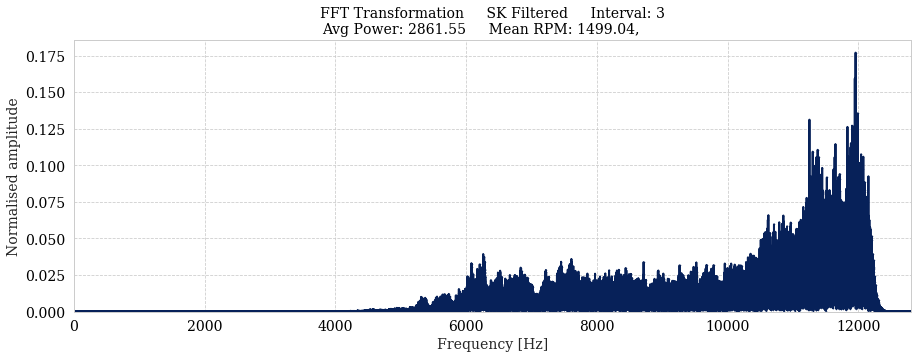

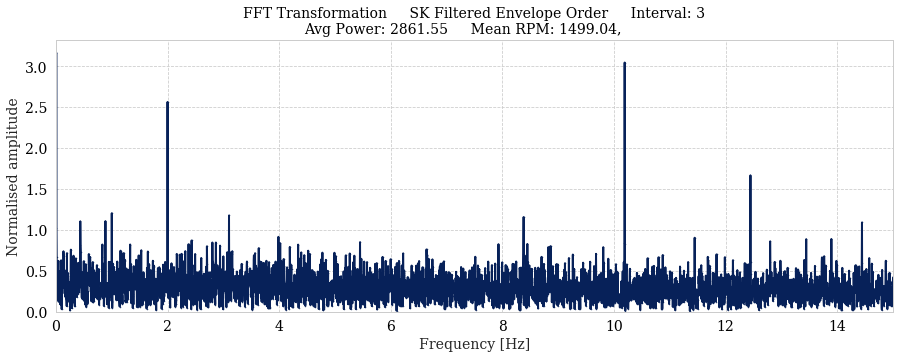

Kurtosis of 3 0.139
Center Frequency: 9000.000
Used Bandwidth in orders: 16.010


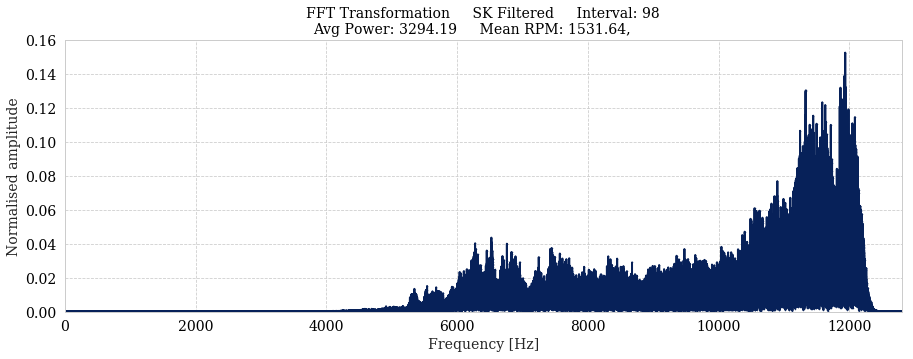

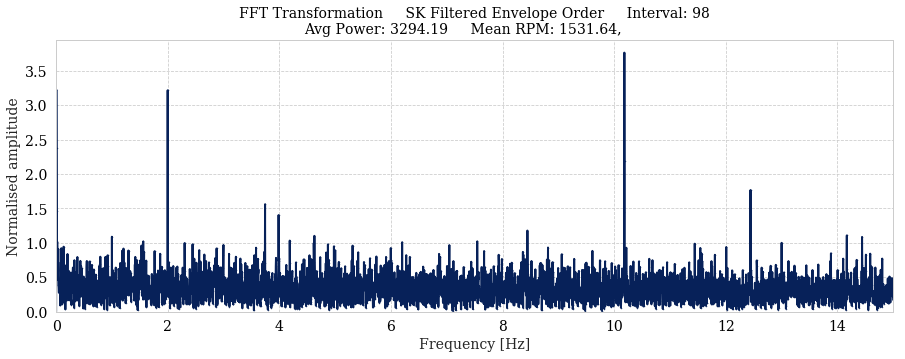

Kurtosis of 98 0.146
Center Frequency: 9000.000
Used Bandwidth in orders: 15.669


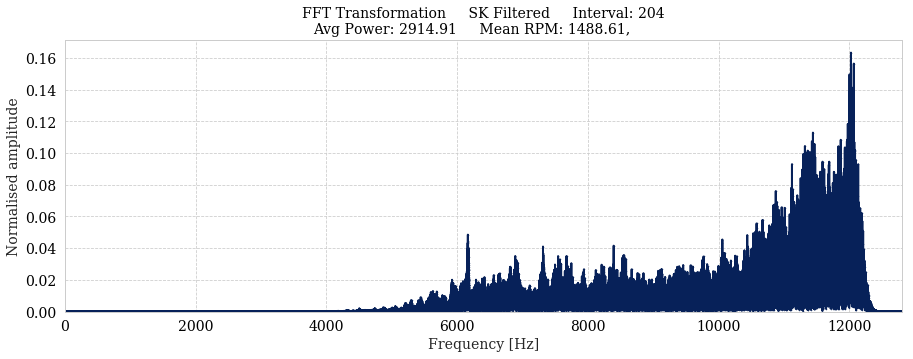

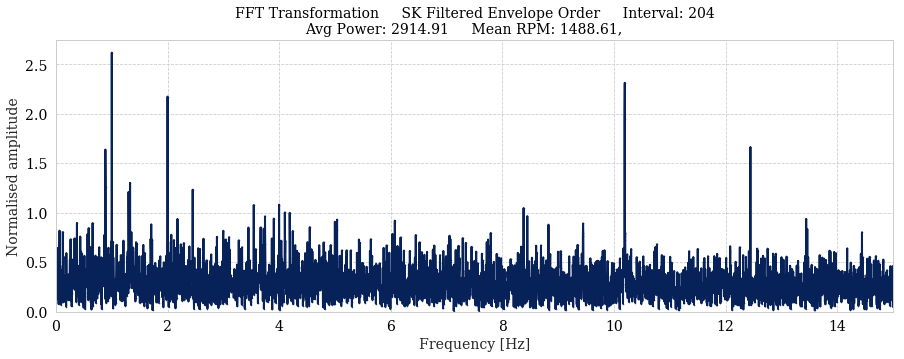

Kurtosis of 204 0.082
Center Frequency: 9000.000
Used Bandwidth in orders: 16.122


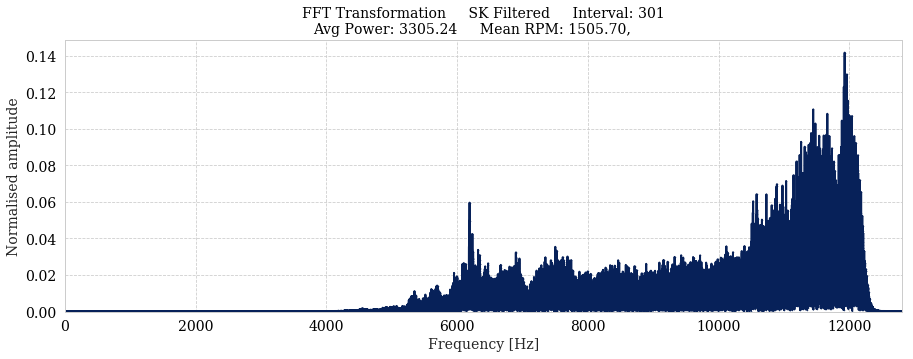

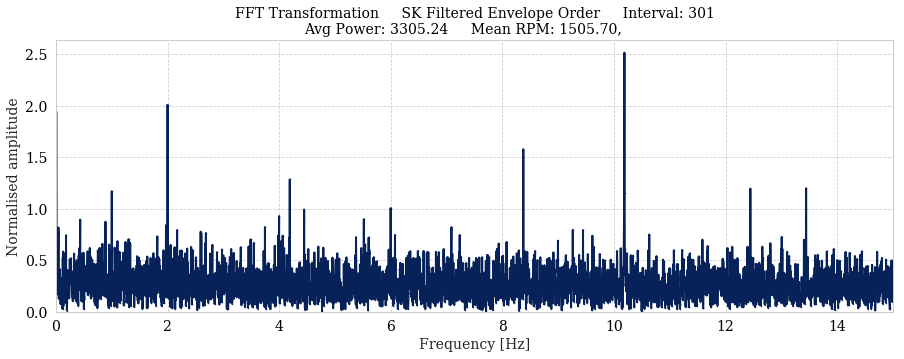

Kurtosis of 301 0.081
Center Frequency: 9000.000
Used Bandwidth in orders: 15.939


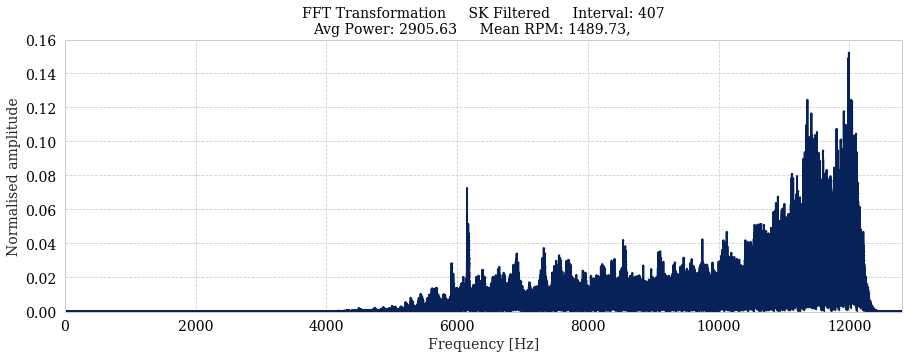

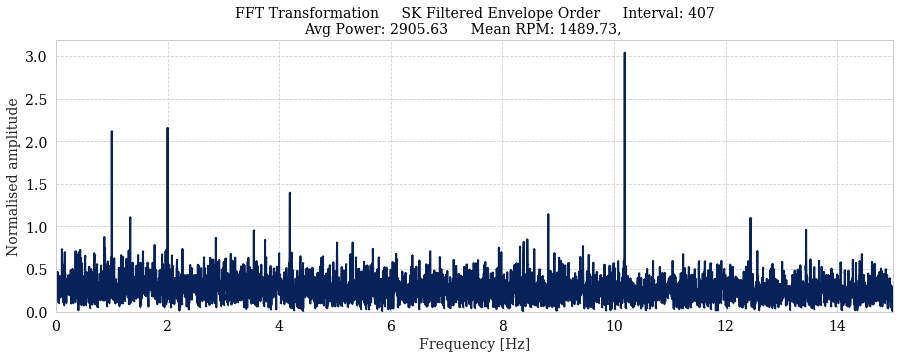

Kurtosis of 407 0.077
Center Frequency: 9000.000
Used Bandwidth in orders: 16.110


In [128]:
interesting_intervals = [3, 98, 204, 301, 407]
bandpassed_signal = bandpassed_9K
cf =9000
ffts = []
fft_times = []

#for i, signal in enumerate(bandpassed_signal):
for i in interesting_intervals:
    if avg_power[i] < 2400:
        continue
    bw = float(concated['Bandwidths'][i])
    if i == 50:
        print('------------------------------------------------\n\n')
        print('               FIRST 50 FINISHED')
        print('\n\n------------------------------------------------')
    if True: #i< 50 or i>370: #bw < 1000 and i<50:# or (i>50 and i<60) or (i > 190 and i < 200)):
        # Plot SK filtered signal
        #plotting_methods.plot_signal(times[i][1:], bandpassed_signal[i],name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        plotting_methods.plot_fft(times[i][1:], bandpassed_signal[i], name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calcutale envelope
        highut_lp = 1000
        rectified = abs(bandpassed_signal[i])**2
        bandpass_filtered_rect_lp = filters.butter_lp_filter(rectified, highut_lp, fs, order=5)
        
        #Plot envelope signal
        one_order = avg_rpm[i]/60
        freq=[one_order]
        #plotting_methods.plot_fft(times[i][1:], bandpass_filtered_rect_lp, x_max=100,frequency_lines=freq,name='SK Filtered Envelope', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calculate Envelope Order
        try:
            x_round, resampled_envelope, x_time = resample_signals.do_cubic_resampling(times[i][1:], bandpass_filtered_rect_lp, peak_array[i], number_of_resample_points=2000)
            fft, fft_time = plotting_methods.plot_fft(x_round, resampled_envelope, x_max=15, y_max=None,frequency_lines=[], name='SK Filtered Envelope Order', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
            ffts.append(normalise_fft(fft))
            fft_times.append(fft_time)
        except: #If resampling fails for some reason
            print('---------------------------------------\n\n')
            print(f'              INTERVAL {i}')
            print('ENVELOPE ORDER COULD NOT BE CALCULATED!\n\n')
            print('---------------------------------------')
        
        # Print key values
        print(f'Kurtosis of {i} {kurtosis(bandpassed_signal[i]):.3f}')
        print(f'Center Frequency: {cf:.3f}')
        print(f'Used Bandwidth in orders: {400*60/avg_rpm[i]:.3f}')


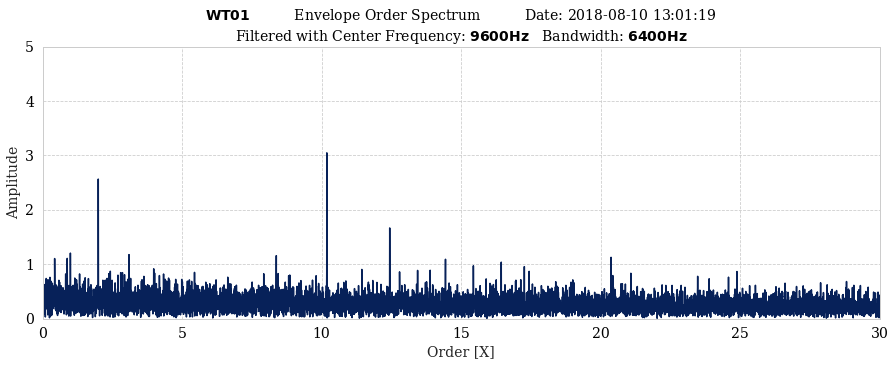

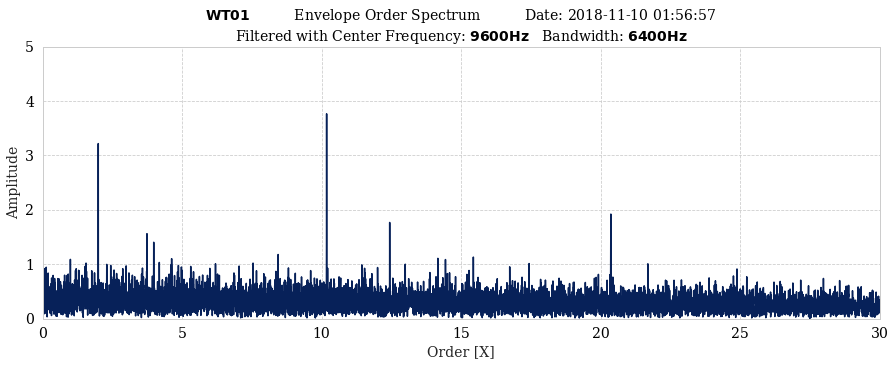

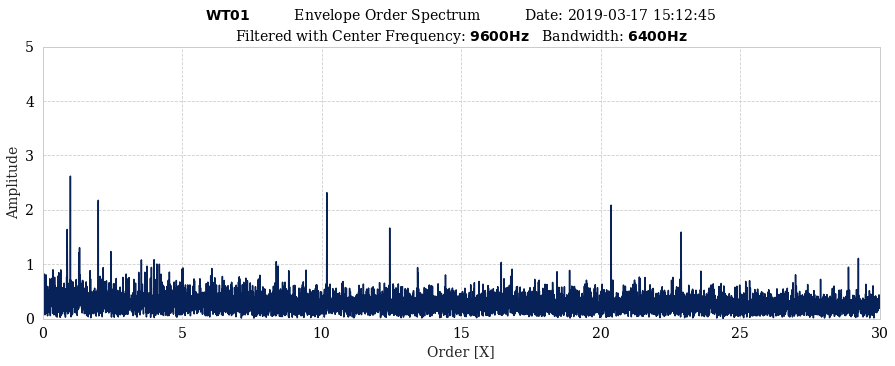

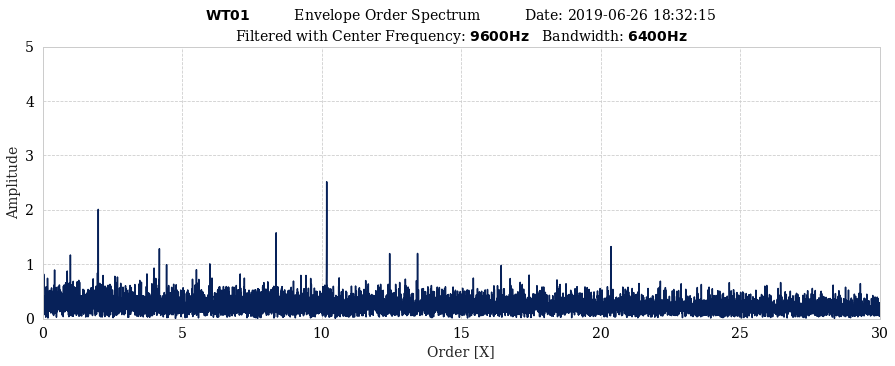

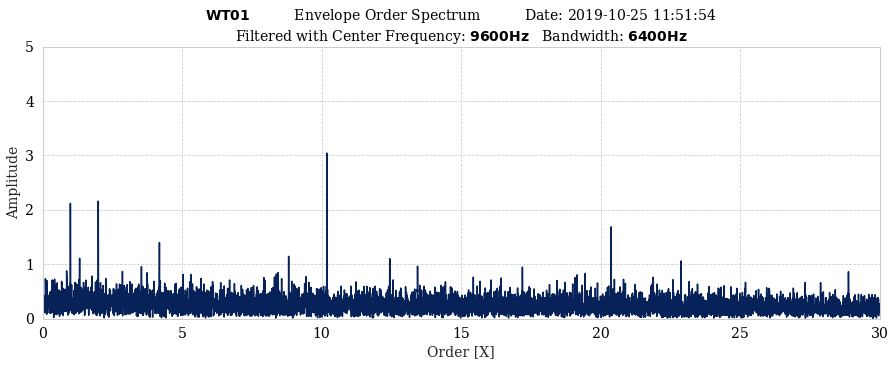

In [135]:
save_path = '../../plots/envelope_order_higher_freq/'
for i,interval in enumerate(interesting_intervals):
    plt.figure(figsize=(15,5))
    plt.plot(fft_times[i], ffts[i])
    plt.xlim(0, 30)
    plt.ylim(0,5)
    heading = r"$\bf{WT01}$" + f'          Envelope Order Spectrum          Date: {dates.values[interesting_intervals[i]][0]}'
    heading += f'\nFiltered with Center Frequency: ' + r"$\bf{9600Hz}$" + '   Bandwidth: ' + r"$\bf{6400Hz}$"
    plt.title(heading)
    plt.ylabel('Amplitude')
    plt.xlabel('Order [X]')
    #plt.axvline(12, c='r', linewidth=0.7)
    #plt.axvline(24, c='r', linewidth=0.7)
    #plt.axvline(11, c='c', linewidth=0.7)
    #plt.axvline(22, c='c', linewidth=0.7)
    plt.margins(0)
    plt.savefig(f'{save_path}wt01_high_freq_{interval}.png', dpi=300)
    plt.show()

In [145]:
path = wt_folder_path + 'higfreq.npz'
np.savez(path, fft=ffts, freq=fft_times, intervals=interesting_intervals, dates=dates)

In [147]:
load = np.load(path,allow_pickle=True)
load

### 5.5 Filter on Center Frequency 12 kHz and Bandwidth 400 Hz


In [28]:
# Just loop through
bandpassed_12K = []
signal_size = len(filtered_signals)
for i in range(len(filtered_signals)):
    use_signal = filtered_signals[i]
    time = times[i]
    
    cf = 12000
    bw = 200
    low = cf - bw
    high = cf + bw

    if high > 0.5*fs:
        high = 0.5*fs -100    
    
    y = filter_based_on_optimal_bw(low,high,use_signal, time)
    bandpassed_12K.append(y)
    print(f'Filtering {i+1} / {signal_size} signals', end='\r')

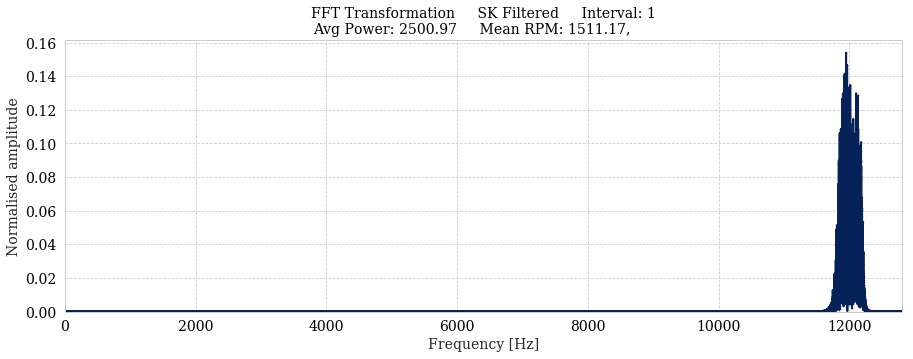

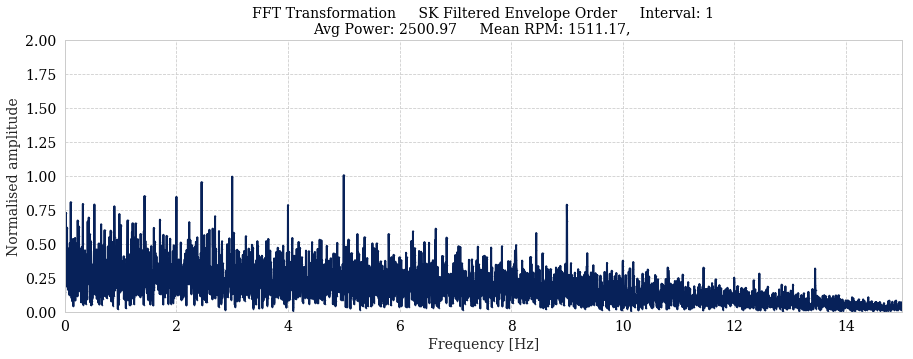

Kurtosis of 1 0.017
Center Frequency: 12000.000
Used Bandwidth in orders: 15.882


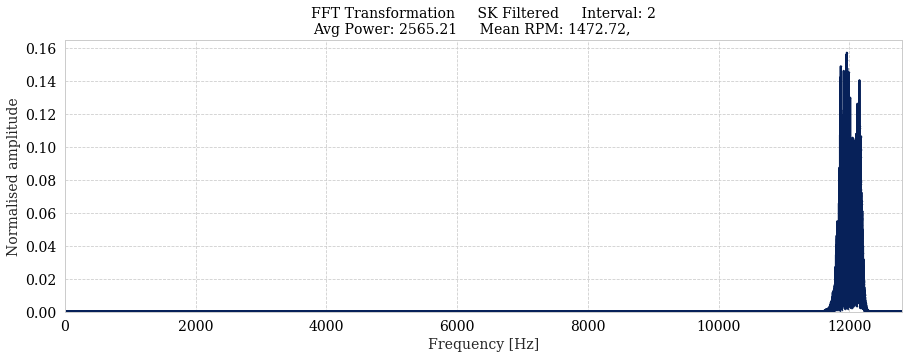

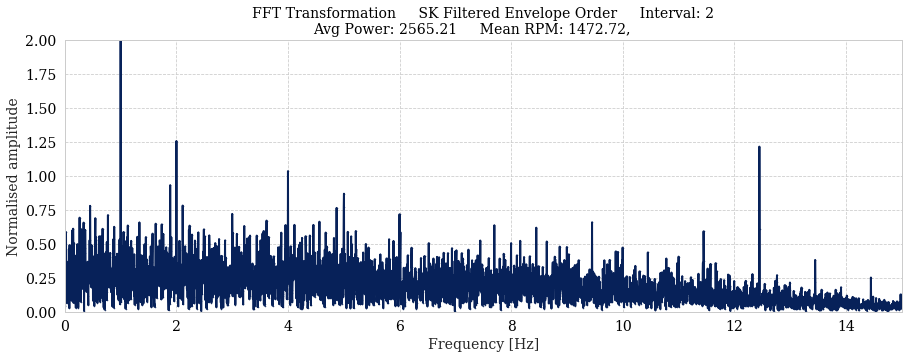

Kurtosis of 2 0.077
Center Frequency: 12000.000
Used Bandwidth in orders: 16.296


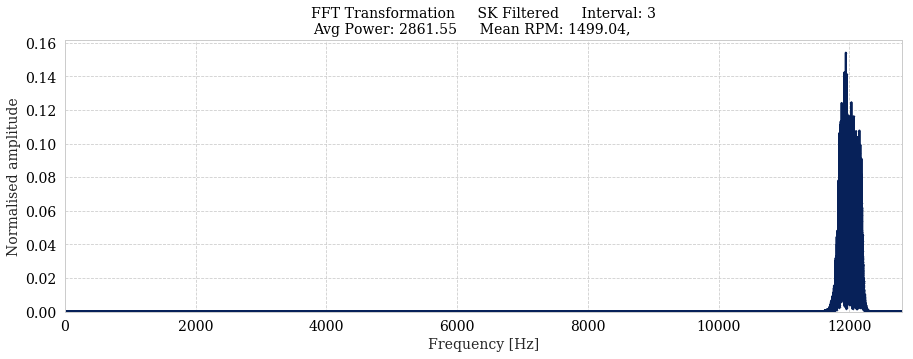

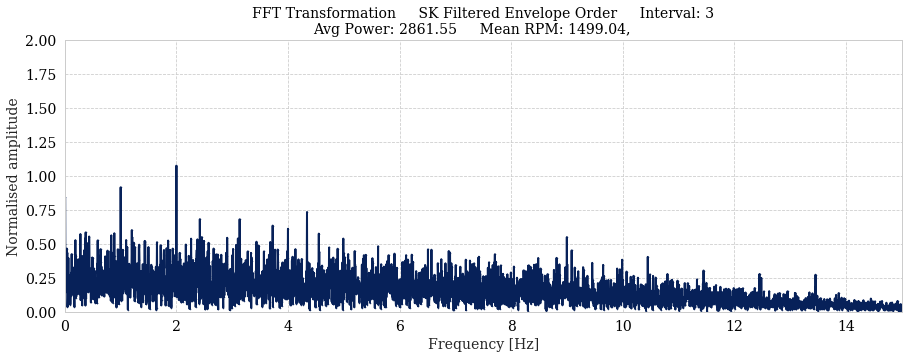

Kurtosis of 3 -0.019
Center Frequency: 12000.000
Used Bandwidth in orders: 16.010


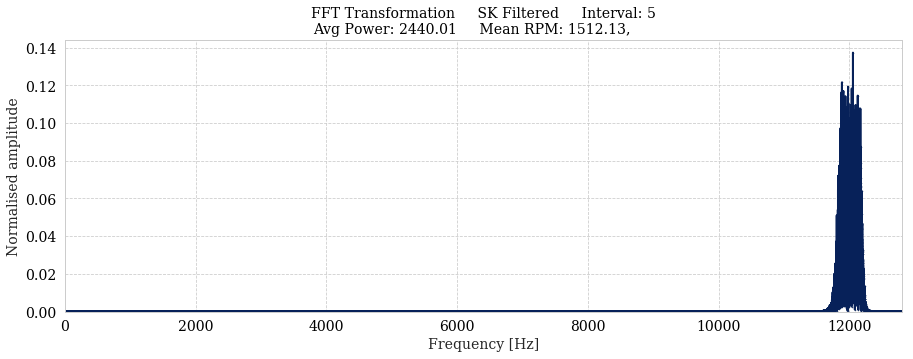

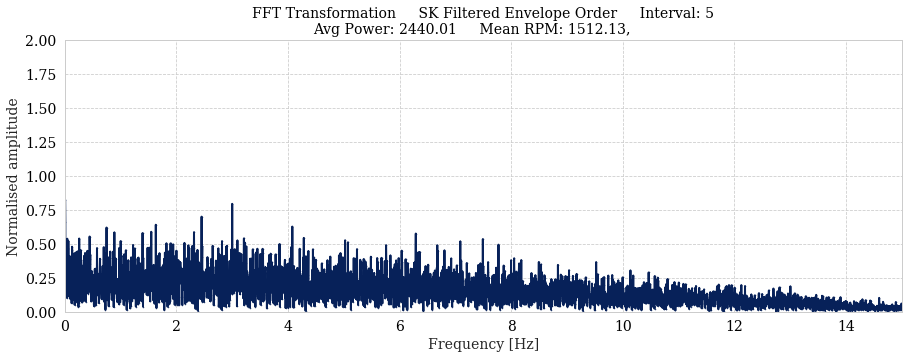

Kurtosis of 5 0.015
Center Frequency: 12000.000
Used Bandwidth in orders: 15.872


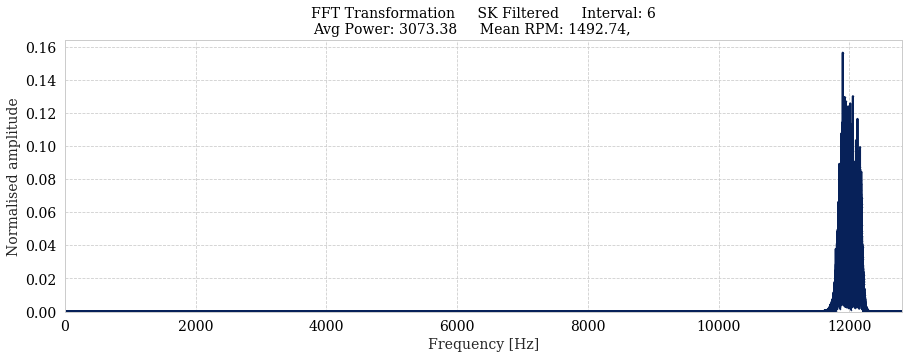

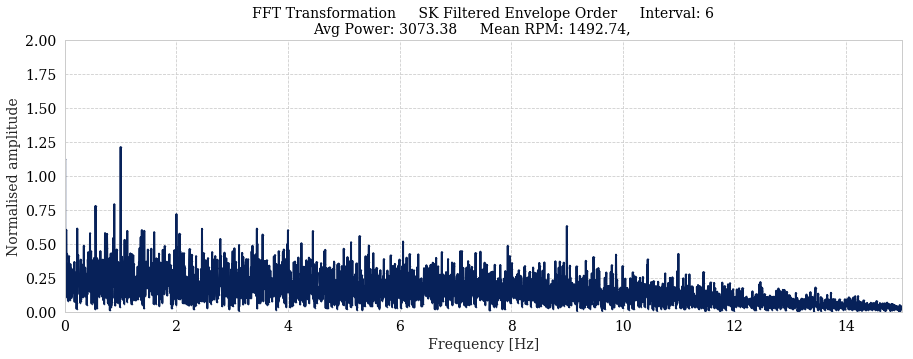

Kurtosis of 6 0.038
Center Frequency: 12000.000
Used Bandwidth in orders: 16.078


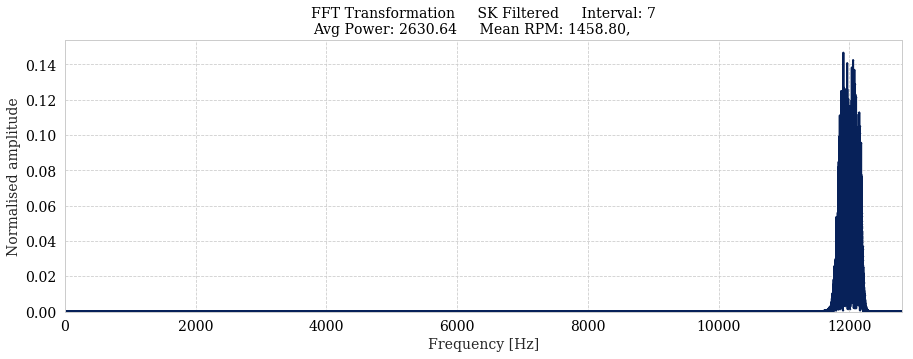

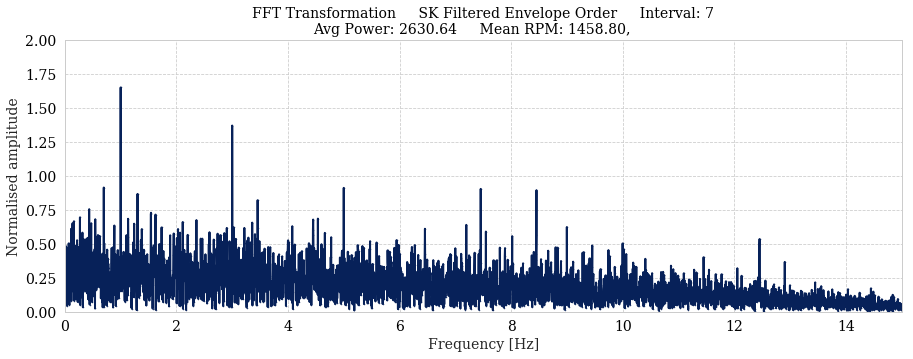

Kurtosis of 7 0.165
Center Frequency: 12000.000
Used Bandwidth in orders: 16.452


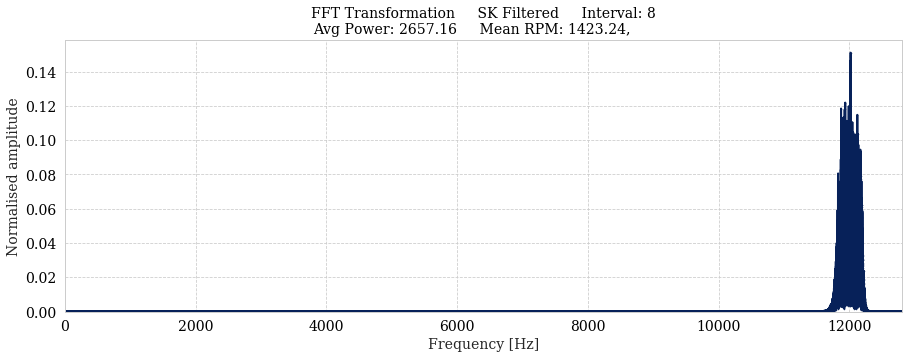

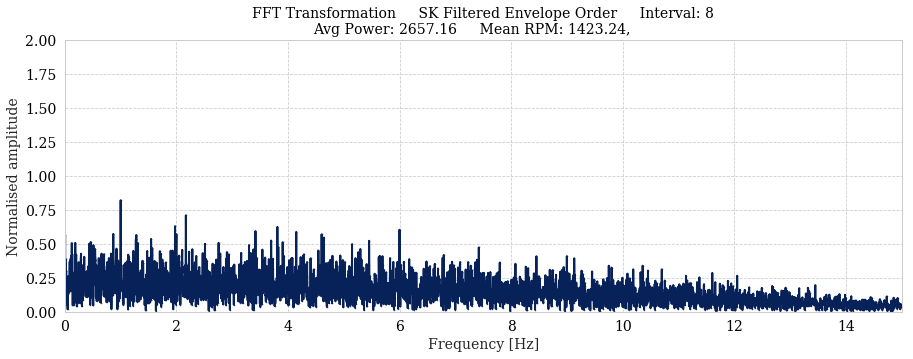

Kurtosis of 8 0.140
Center Frequency: 12000.000
Used Bandwidth in orders: 16.863


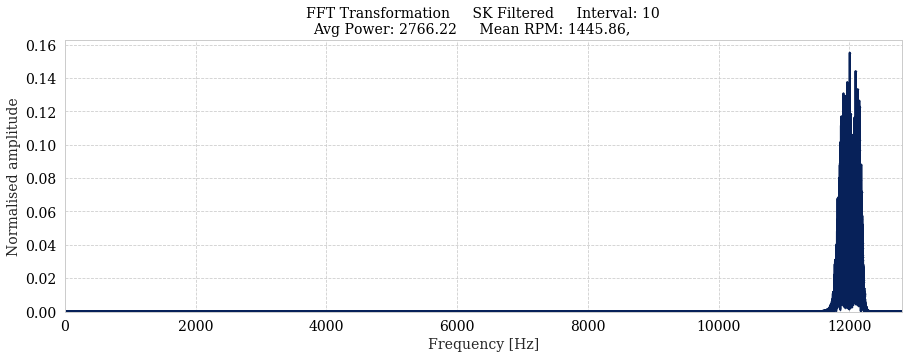

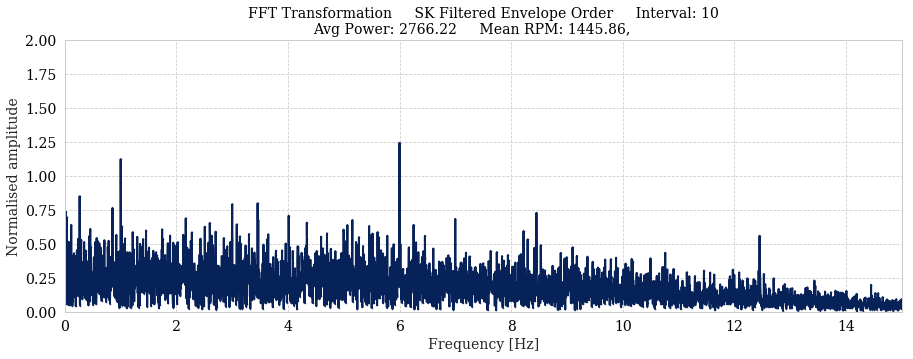

Kurtosis of 10 0.122
Center Frequency: 12000.000
Used Bandwidth in orders: 16.599


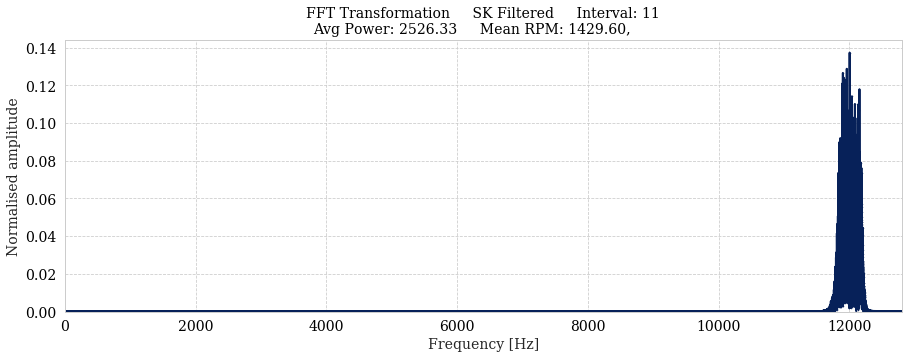

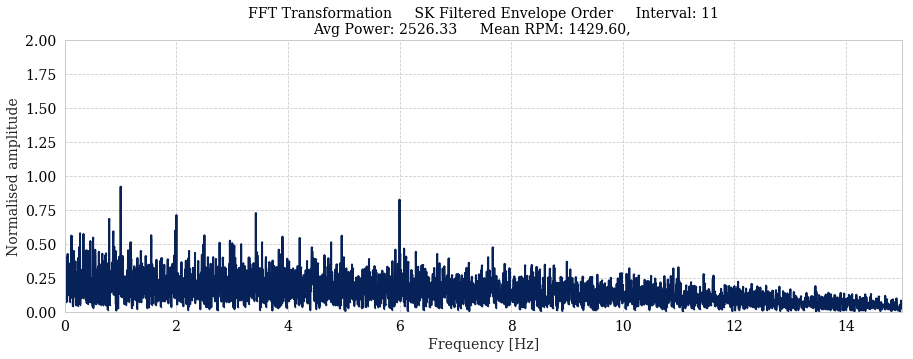

Kurtosis of 11 0.072
Center Frequency: 12000.000
Used Bandwidth in orders: 16.788


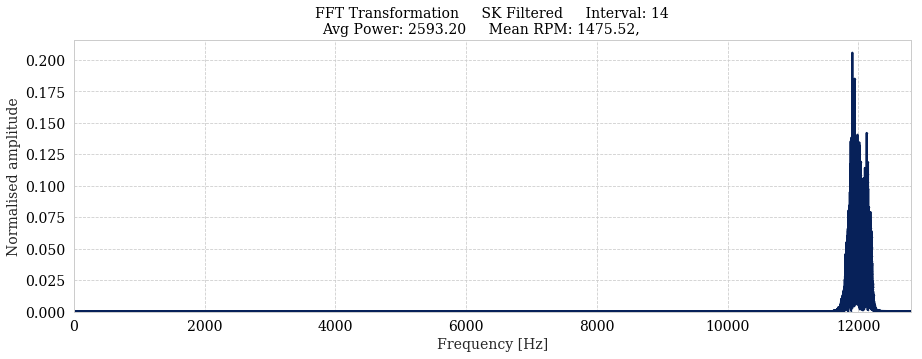

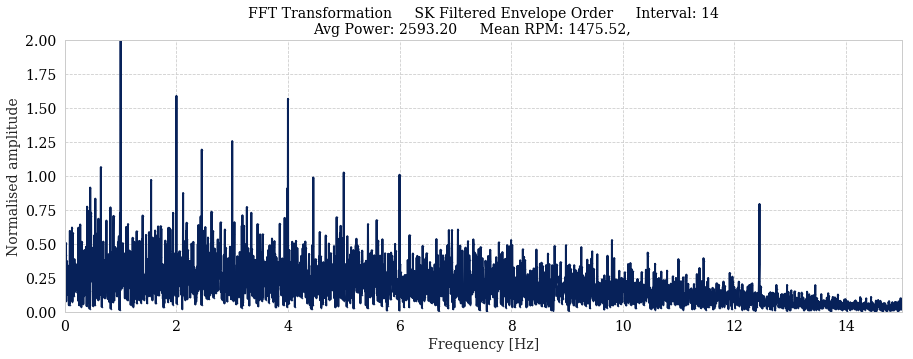

Kurtosis of 14 0.029
Center Frequency: 12000.000
Used Bandwidth in orders: 16.265


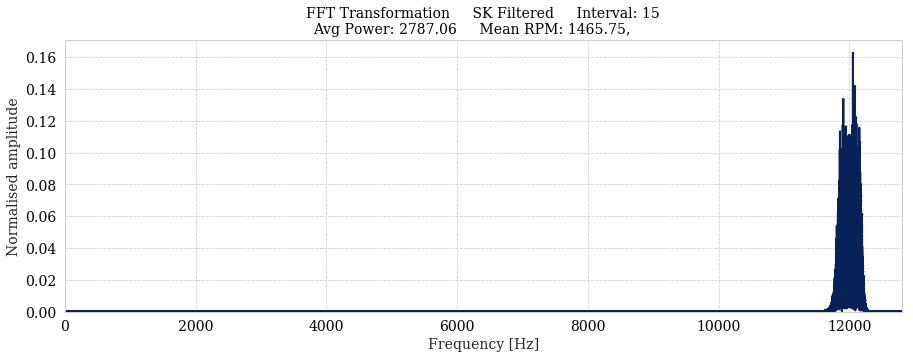

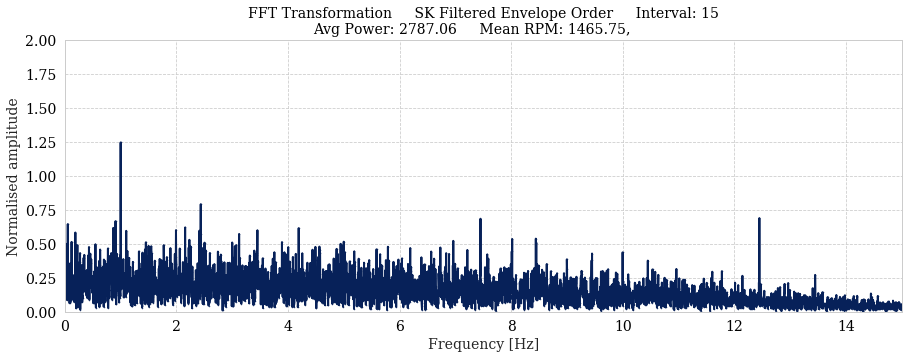

Kurtosis of 15 -0.048
Center Frequency: 12000.000
Used Bandwidth in orders: 16.374


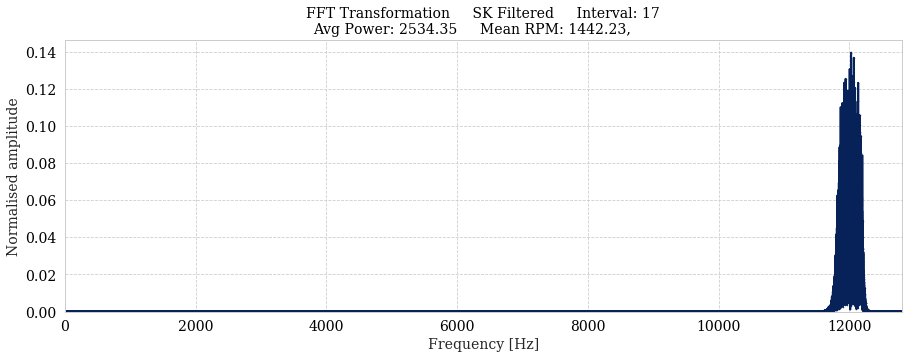

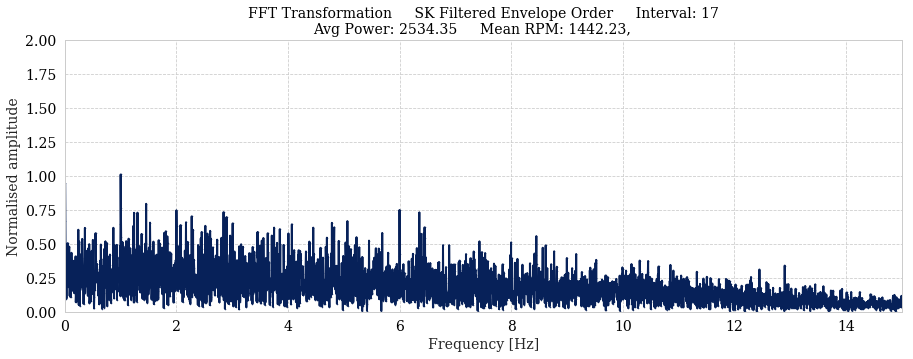

Kurtosis of 17 0.181
Center Frequency: 12000.000
Used Bandwidth in orders: 16.641


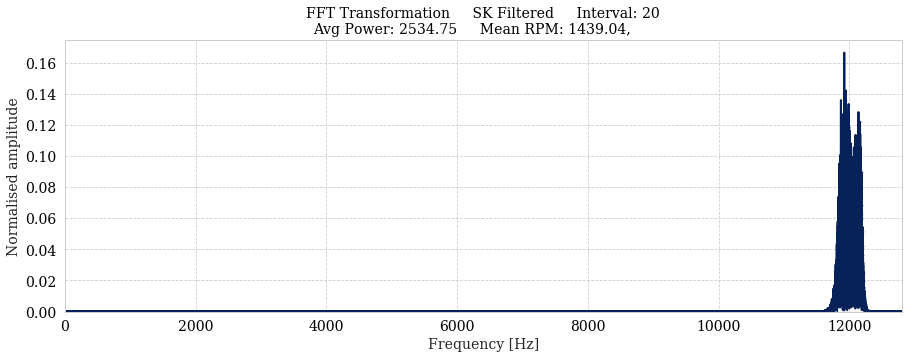

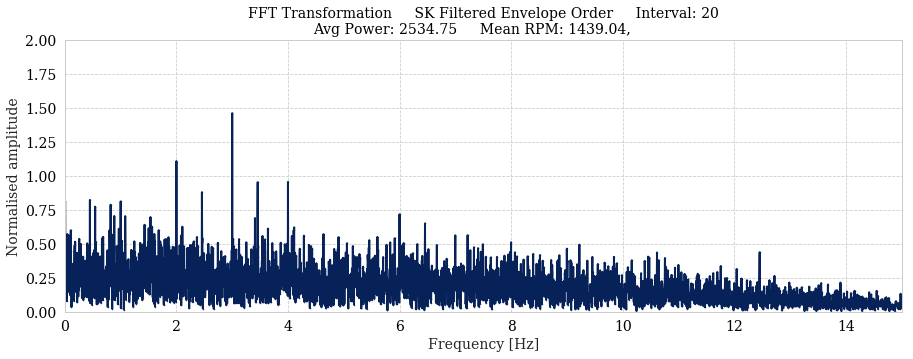

Kurtosis of 20 0.092
Center Frequency: 12000.000
Used Bandwidth in orders: 16.678


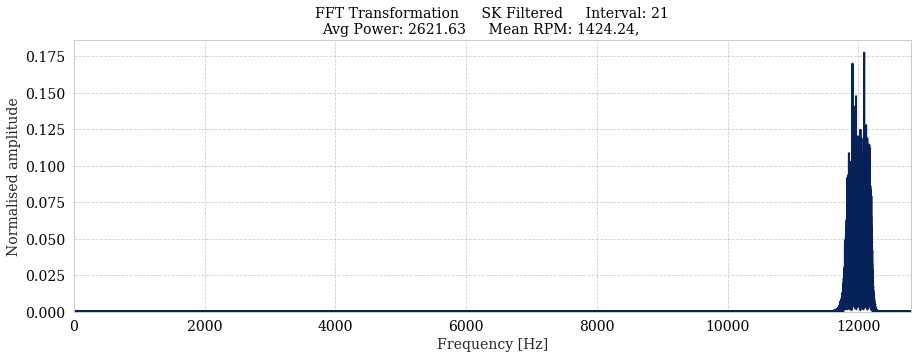

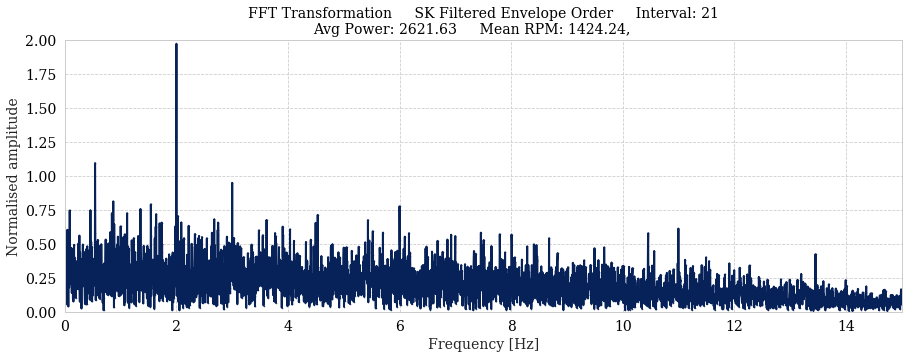

Kurtosis of 21 0.111
Center Frequency: 12000.000
Used Bandwidth in orders: 16.851


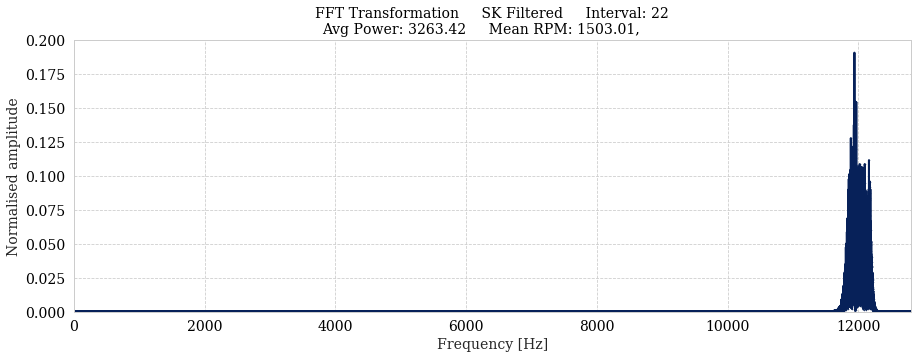

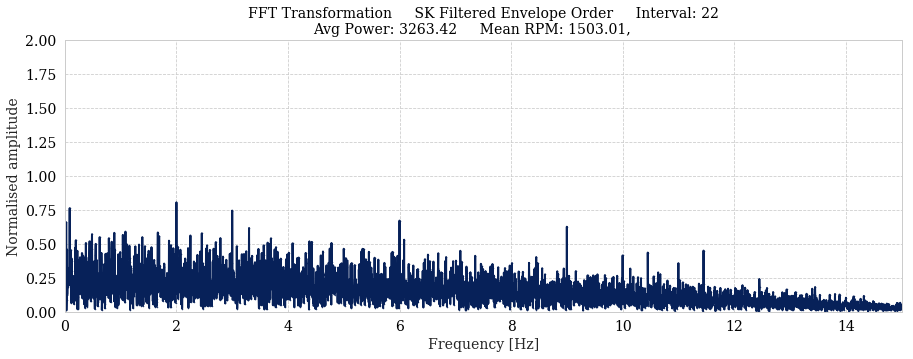

Kurtosis of 22 0.055
Center Frequency: 12000.000
Used Bandwidth in orders: 15.968


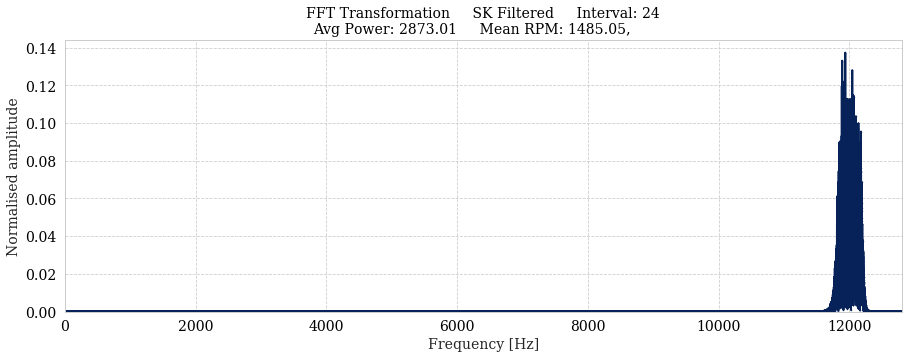

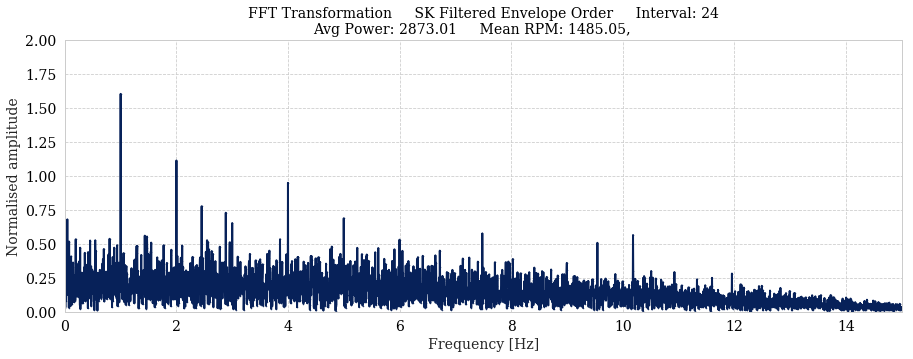

Kurtosis of 24 -0.014
Center Frequency: 12000.000
Used Bandwidth in orders: 16.161


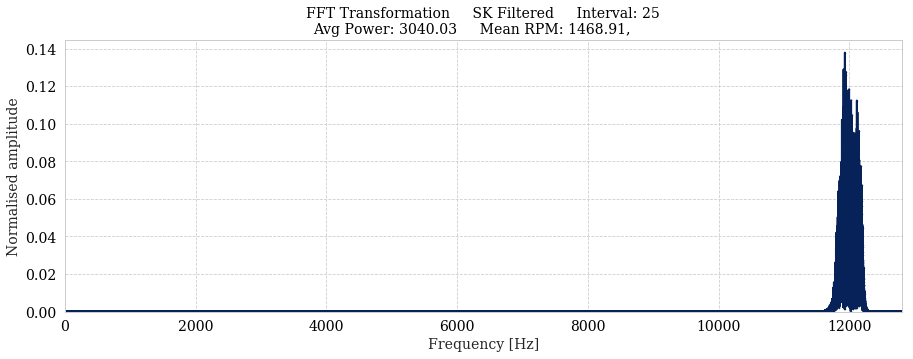

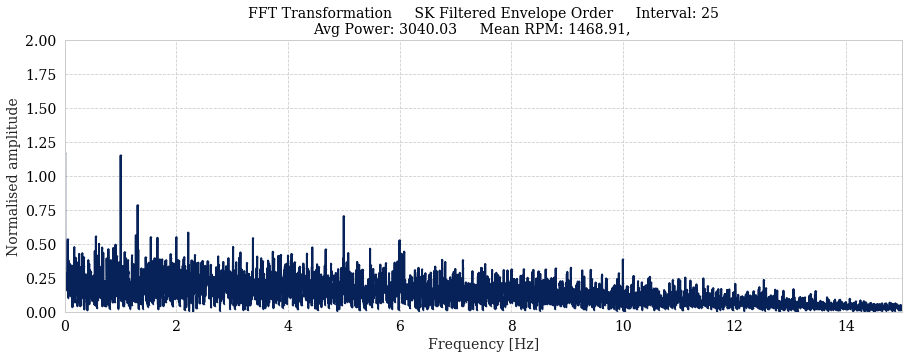

Kurtosis of 25 0.130
Center Frequency: 12000.000
Used Bandwidth in orders: 16.339


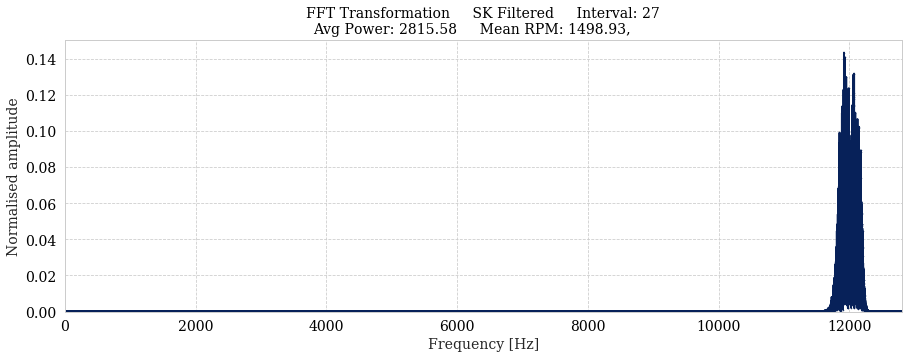

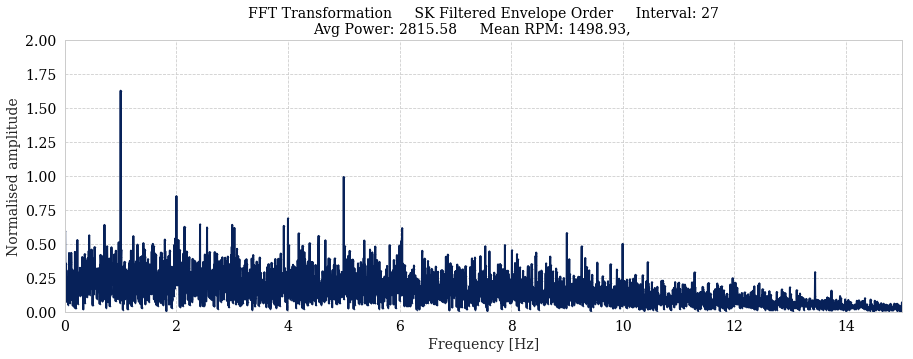

Kurtosis of 27 0.072
Center Frequency: 12000.000
Used Bandwidth in orders: 16.011


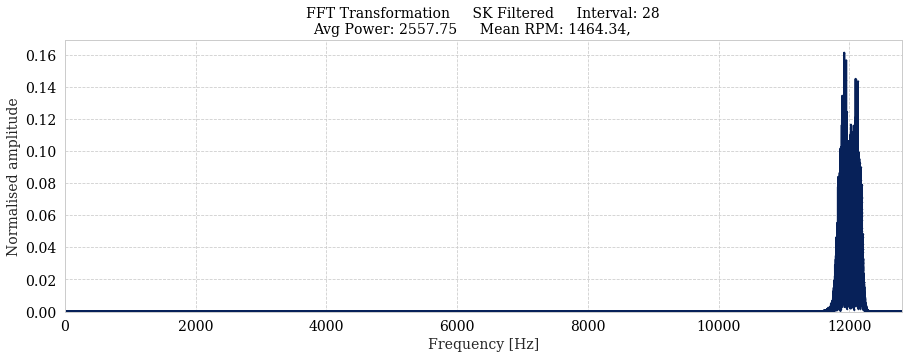

---------------------------------------


              INTERVAL 28
ENVELOPE ORDER COULD NOT BE CALCULATED!


---------------------------------------
Kurtosis of 28 0.187
Center Frequency: 12000.000
Used Bandwidth in orders: 16.390


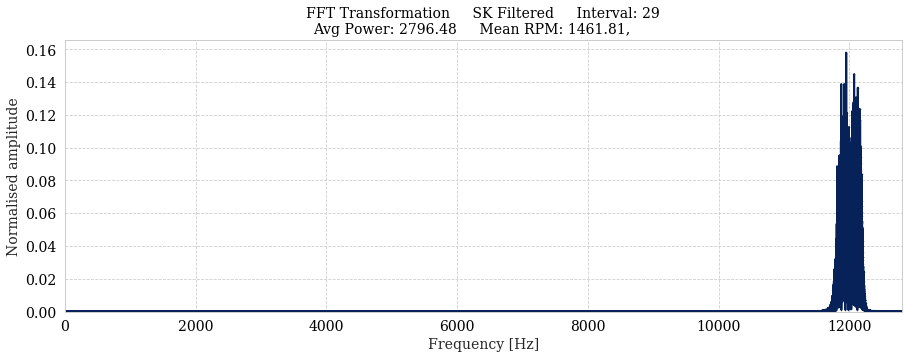

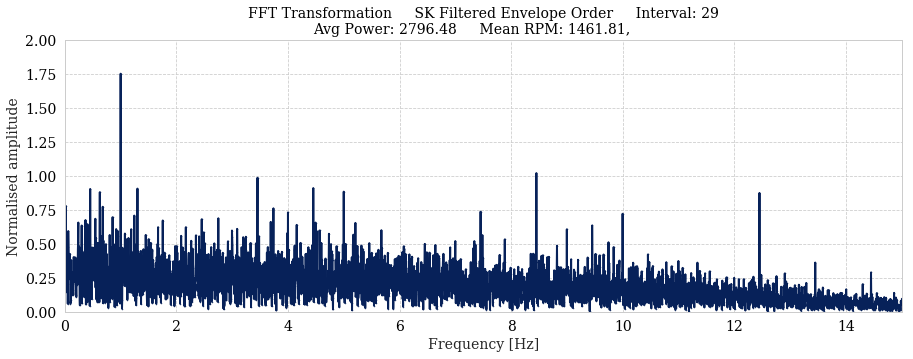

Kurtosis of 29 0.186
Center Frequency: 12000.000
Used Bandwidth in orders: 16.418


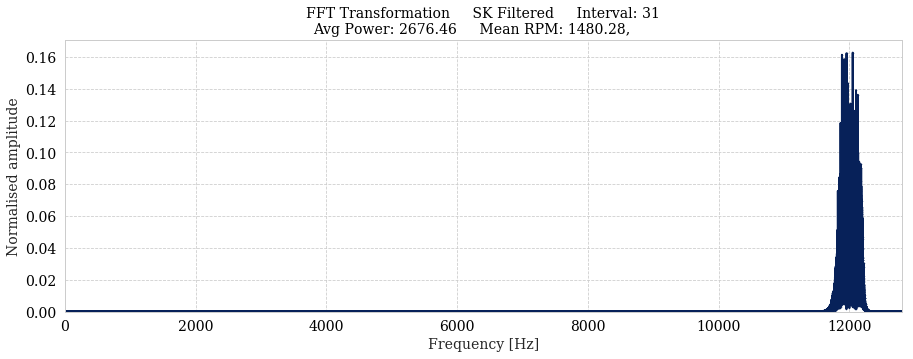

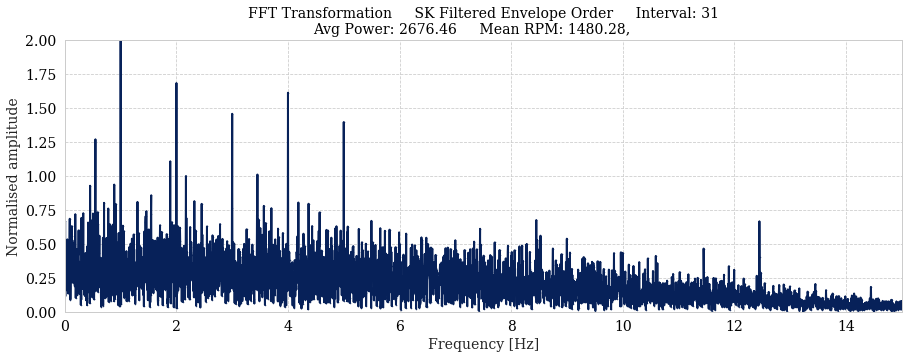

Kurtosis of 31 0.100
Center Frequency: 12000.000
Used Bandwidth in orders: 16.213


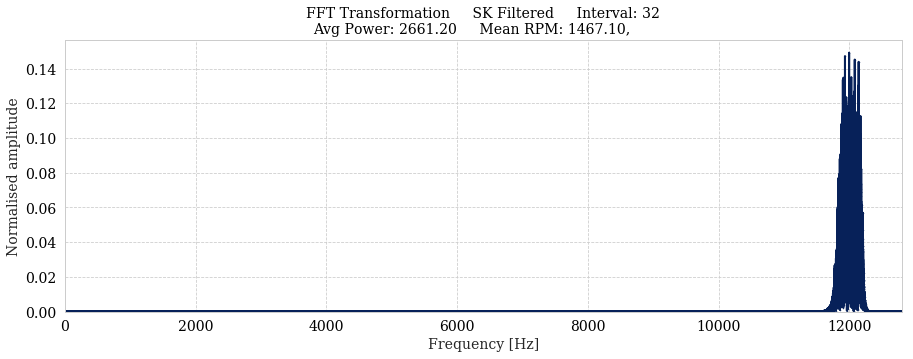

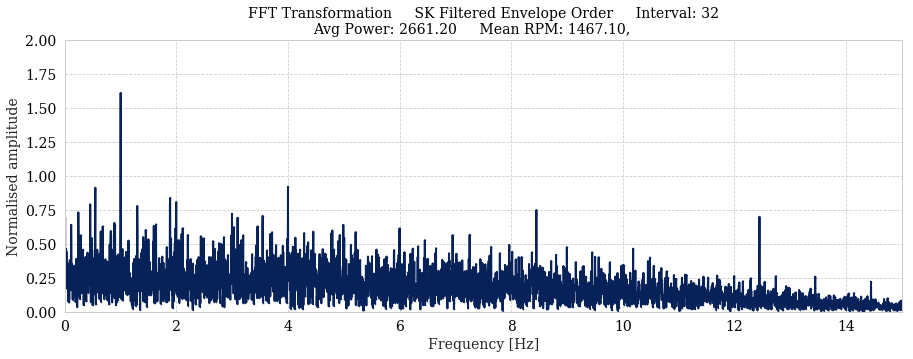

Kurtosis of 32 0.050
Center Frequency: 12000.000
Used Bandwidth in orders: 16.359


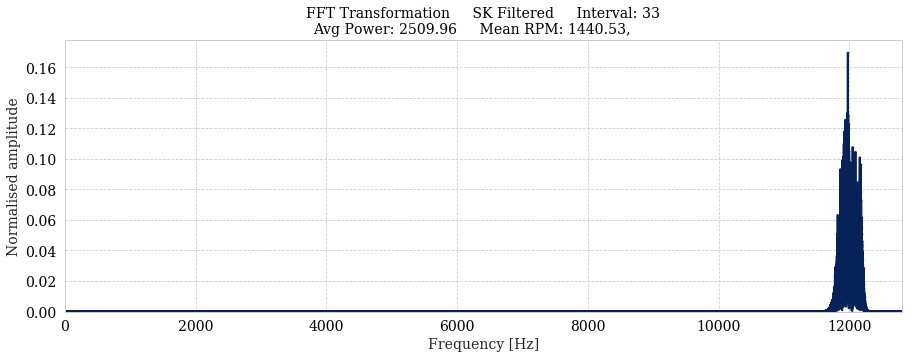

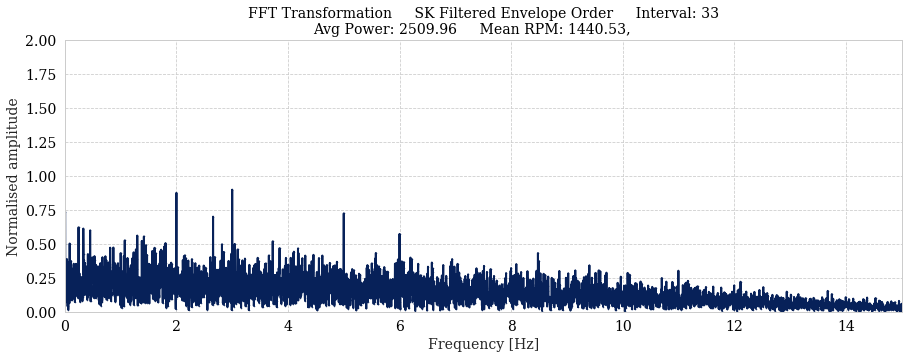

Kurtosis of 33 0.174
Center Frequency: 12000.000
Used Bandwidth in orders: 16.661


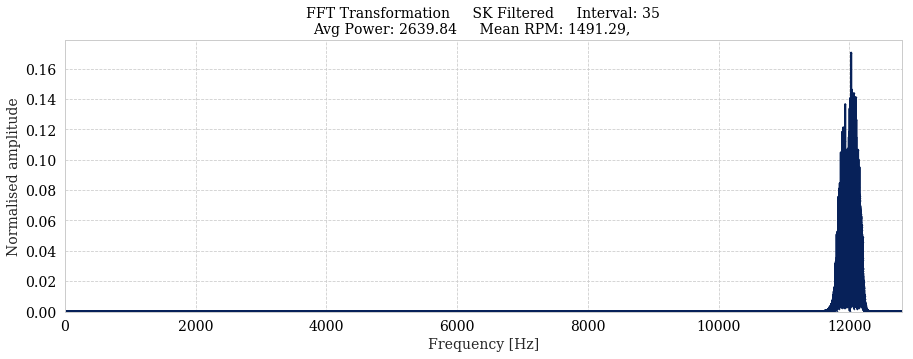

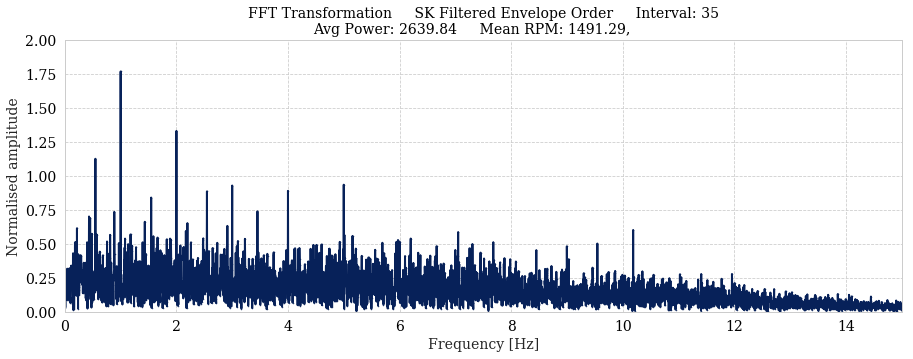

Kurtosis of 35 -0.005
Center Frequency: 12000.000
Used Bandwidth in orders: 16.093


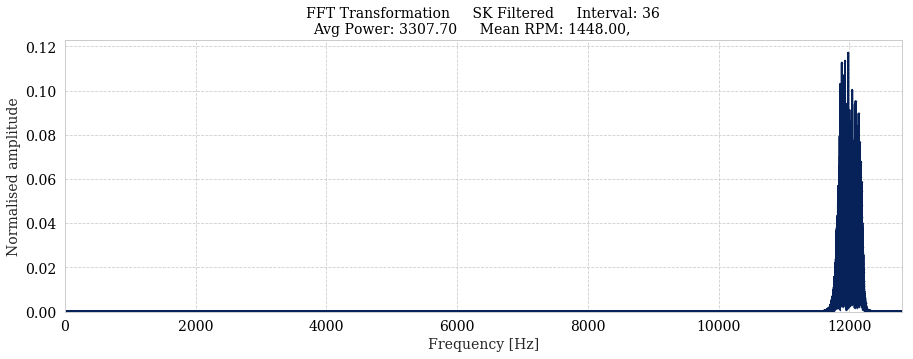

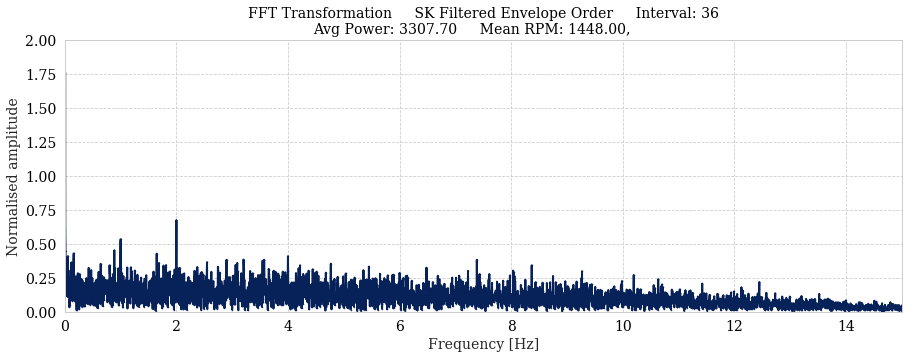

Kurtosis of 36 0.226
Center Frequency: 12000.000
Used Bandwidth in orders: 16.575


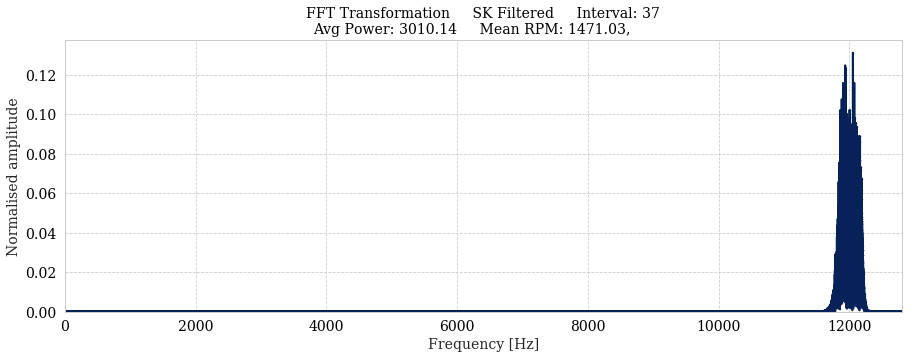

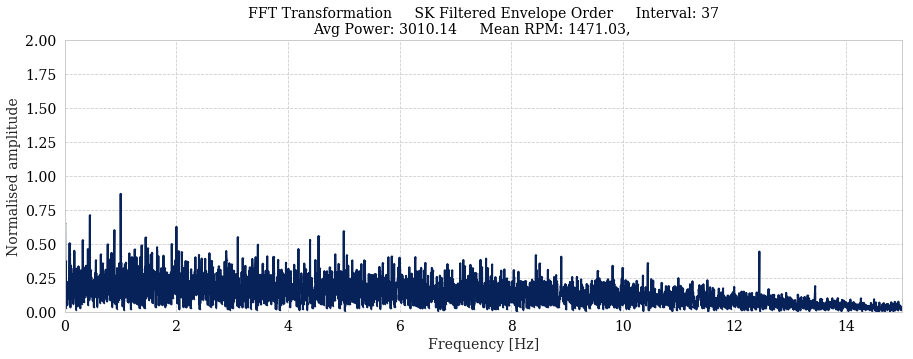

Kurtosis of 37 0.056
Center Frequency: 12000.000
Used Bandwidth in orders: 16.315


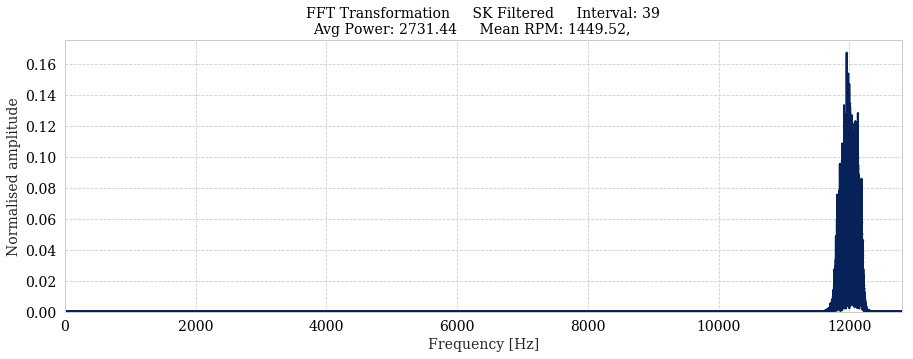

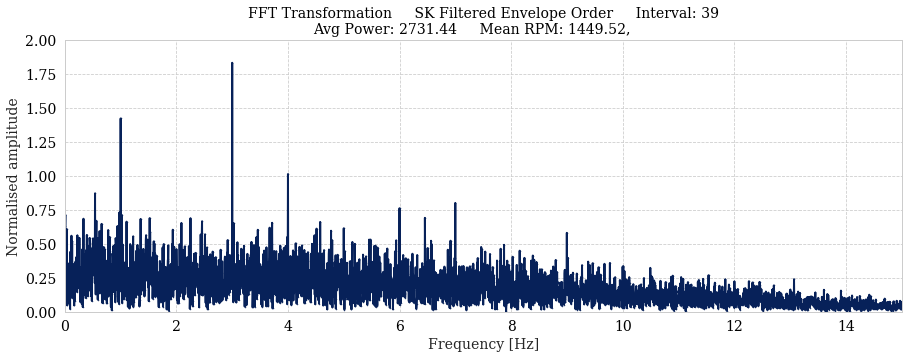

Kurtosis of 39 0.088
Center Frequency: 12000.000
Used Bandwidth in orders: 16.557


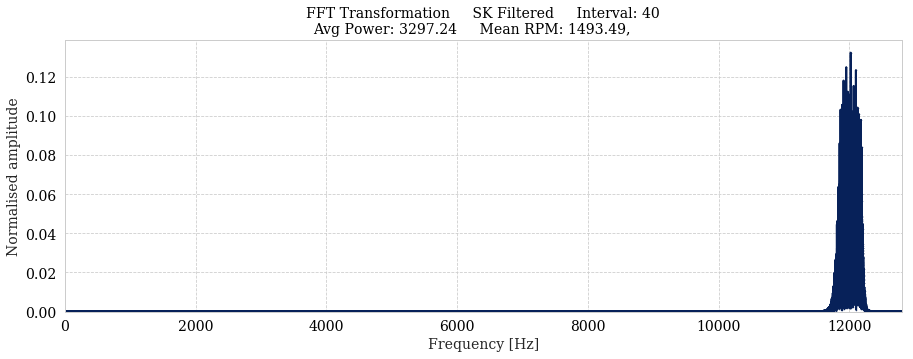

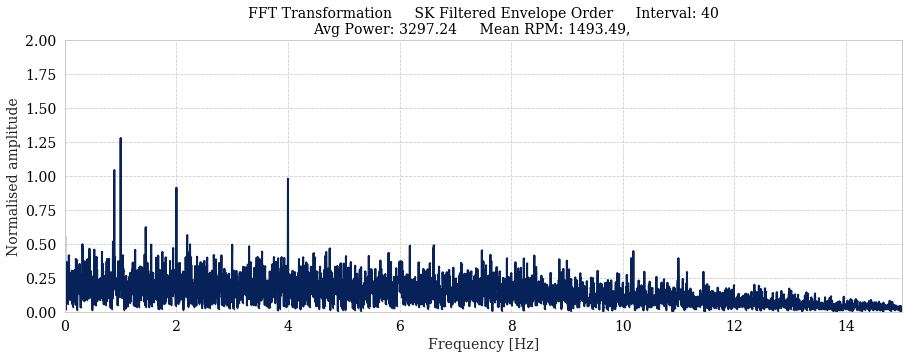

Kurtosis of 40 -0.019
Center Frequency: 12000.000
Used Bandwidth in orders: 16.070


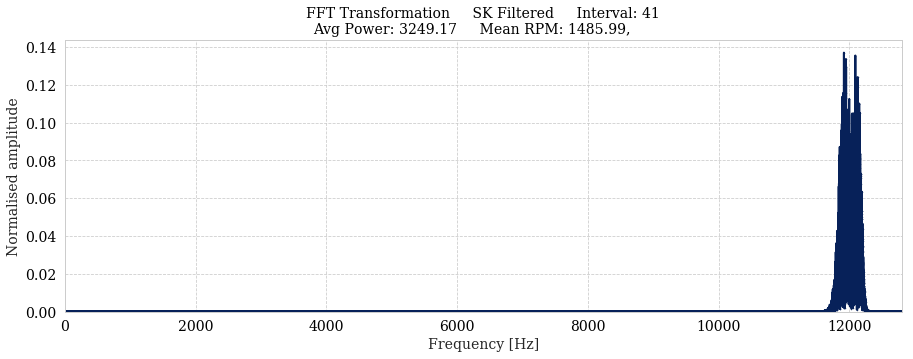

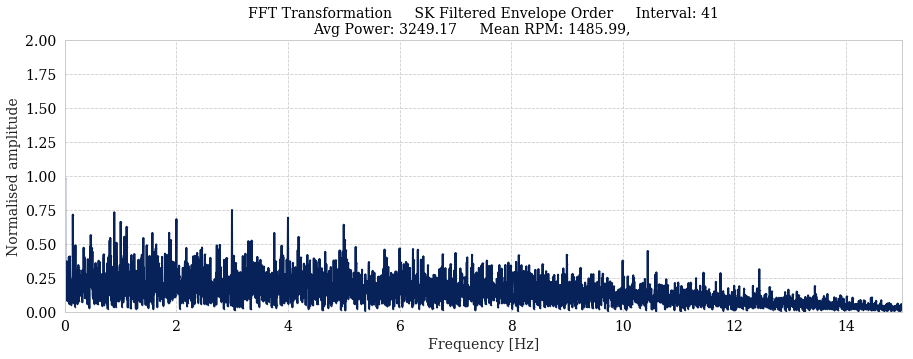

Kurtosis of 41 0.036
Center Frequency: 12000.000
Used Bandwidth in orders: 16.151


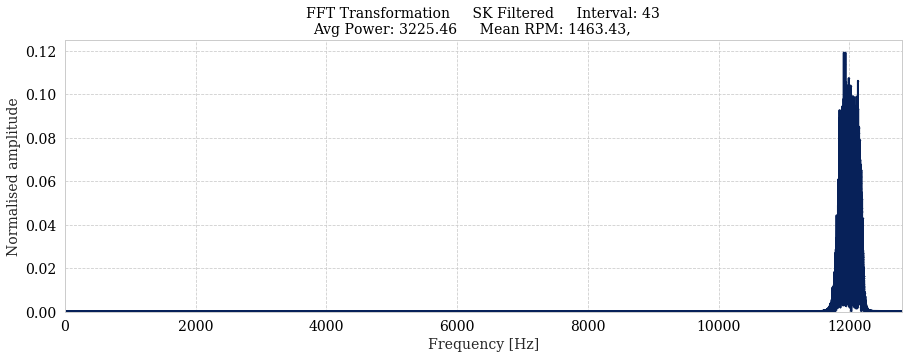

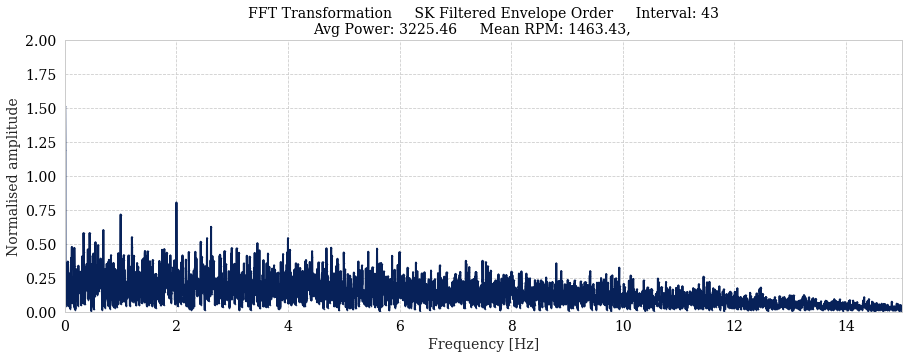

Kurtosis of 43 0.259
Center Frequency: 12000.000
Used Bandwidth in orders: 16.400


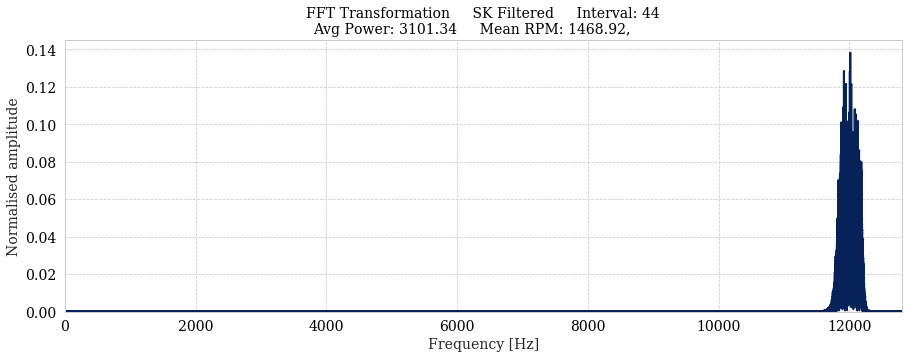

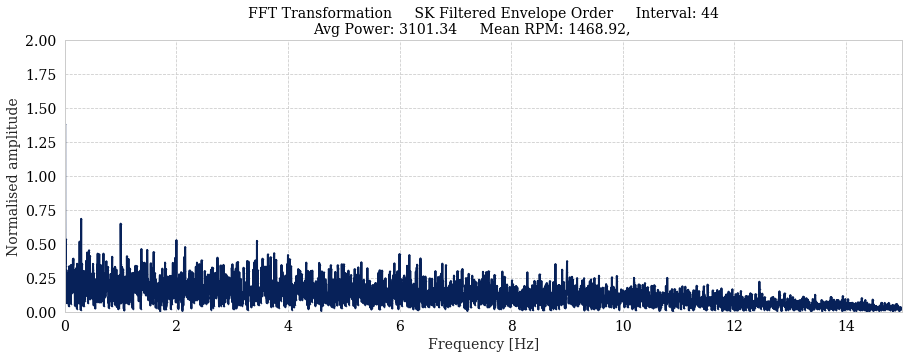

Kurtosis of 44 0.148
Center Frequency: 12000.000
Used Bandwidth in orders: 16.338


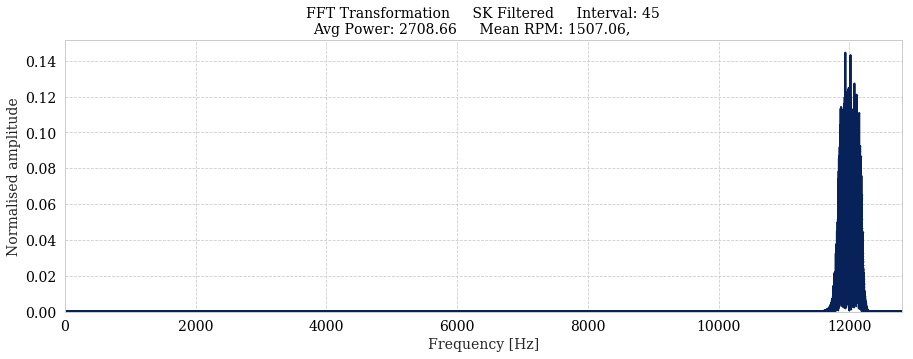

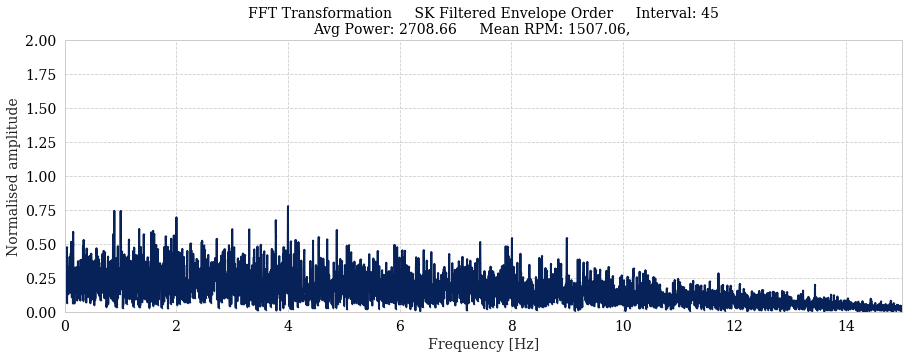

Kurtosis of 45 0.036
Center Frequency: 12000.000
Used Bandwidth in orders: 15.925


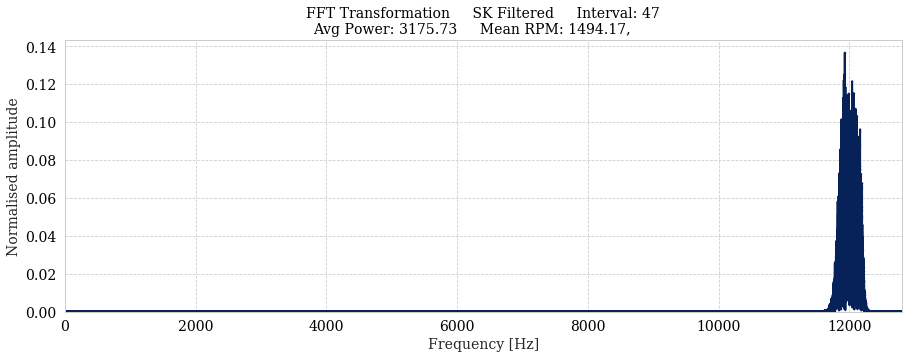

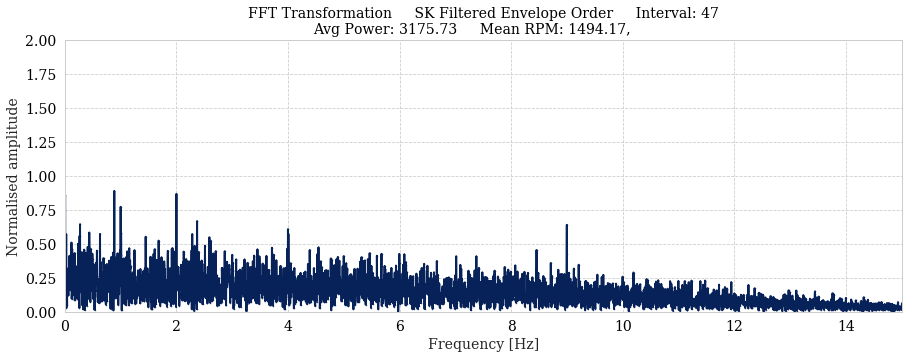

Kurtosis of 47 0.060
Center Frequency: 12000.000
Used Bandwidth in orders: 16.062


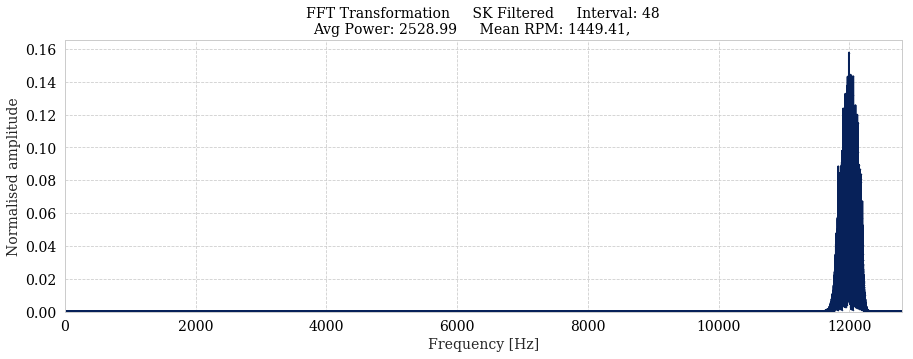

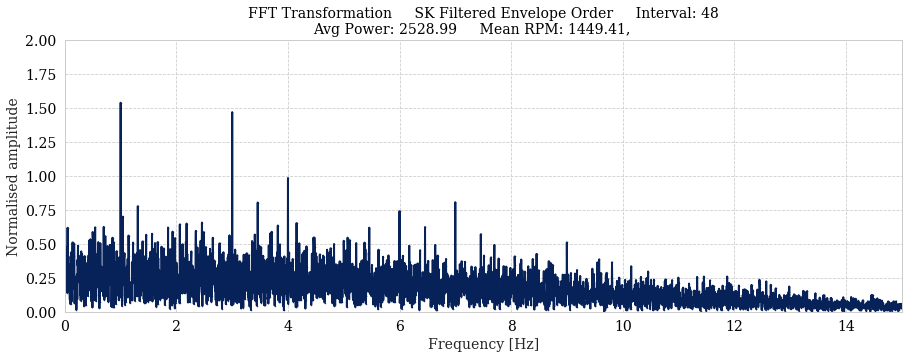

Kurtosis of 48 0.056
Center Frequency: 12000.000
Used Bandwidth in orders: 16.558


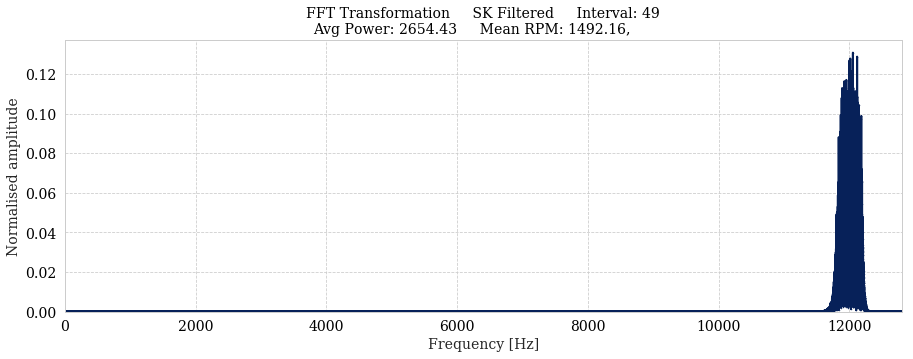

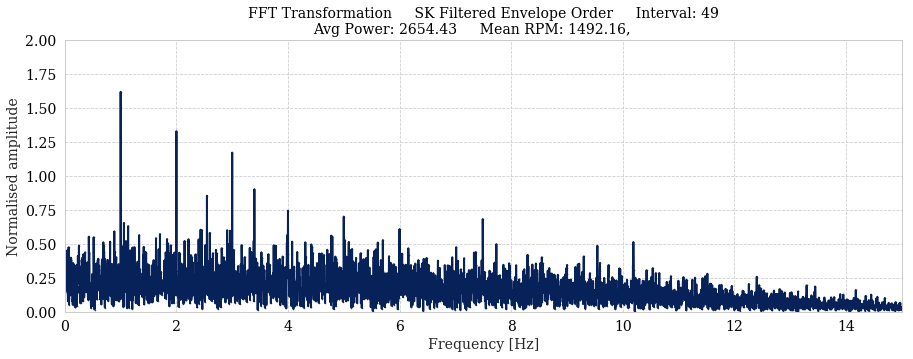

Kurtosis of 49 0.002
Center Frequency: 12000.000
Used Bandwidth in orders: 16.084


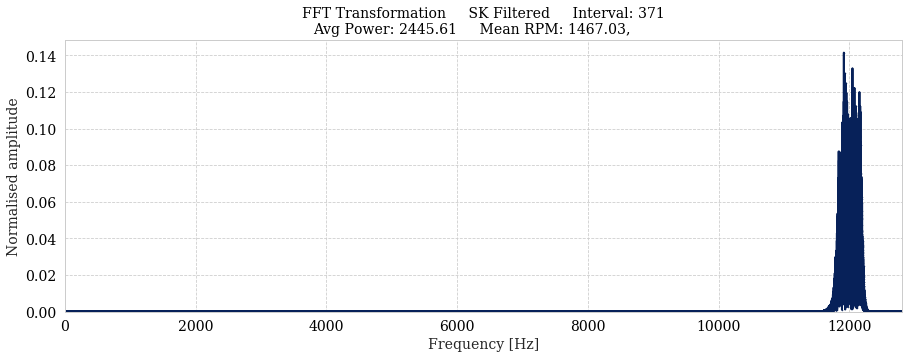

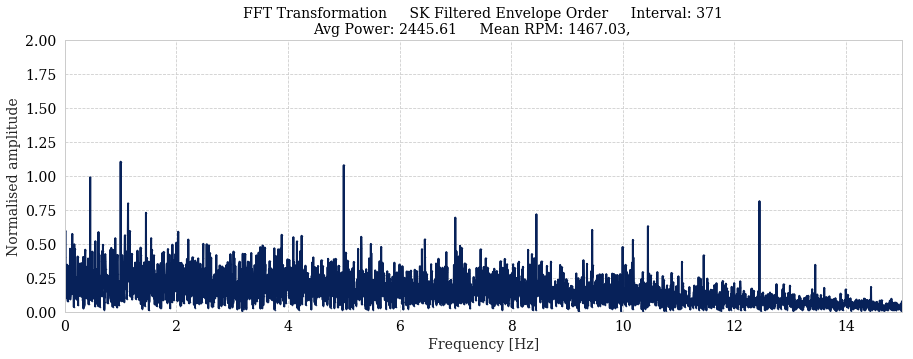

Kurtosis of 371 0.080
Center Frequency: 12000.000
Used Bandwidth in orders: 16.360


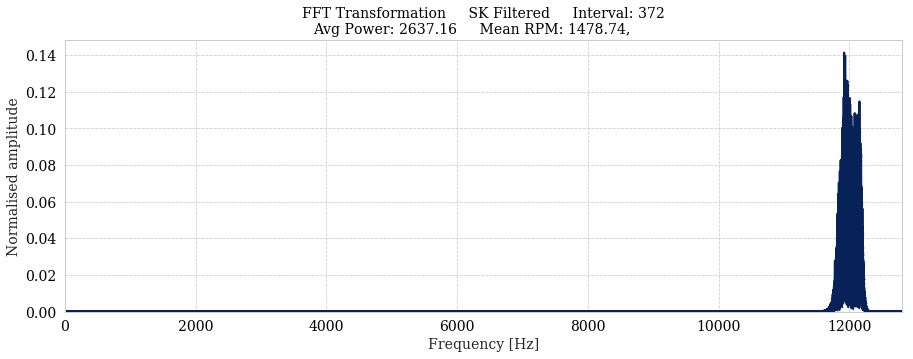

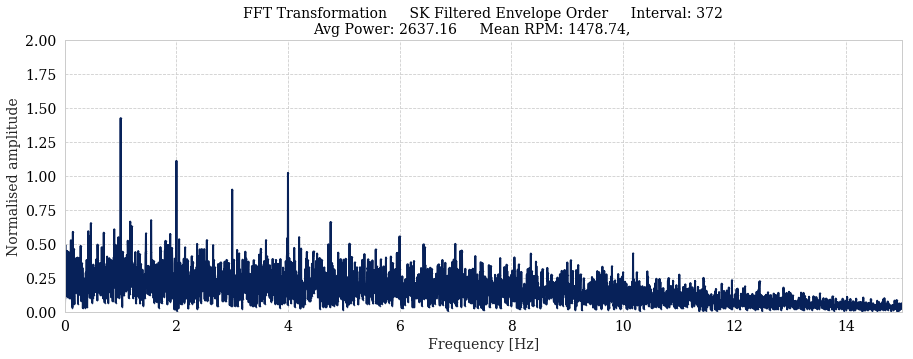

Kurtosis of 372 0.047
Center Frequency: 12000.000
Used Bandwidth in orders: 16.230


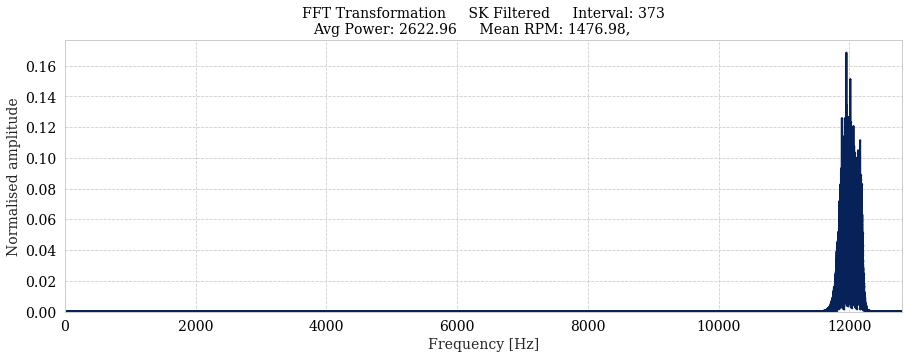

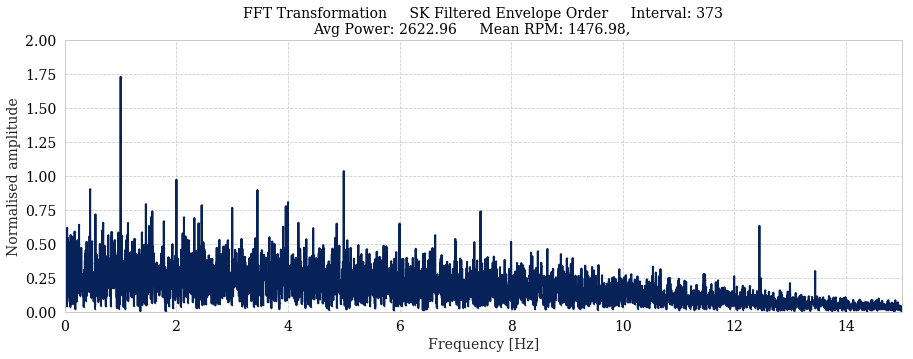

Kurtosis of 373 0.075
Center Frequency: 12000.000
Used Bandwidth in orders: 16.249


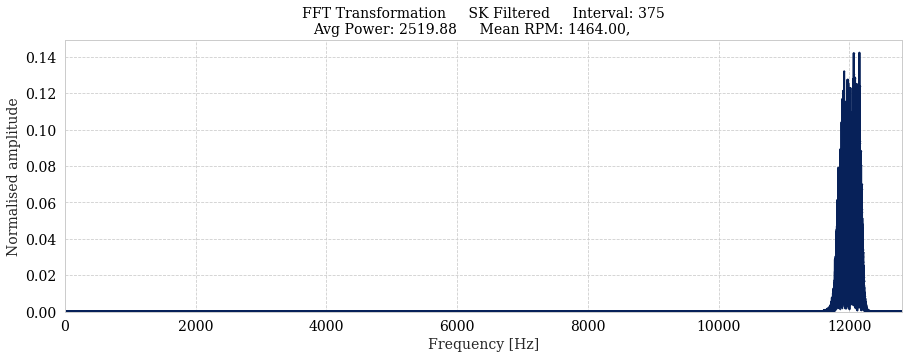

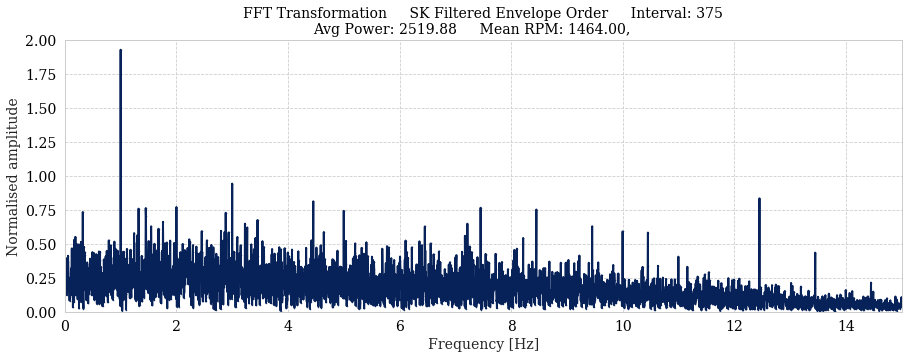

Kurtosis of 375 0.077
Center Frequency: 12000.000
Used Bandwidth in orders: 16.393


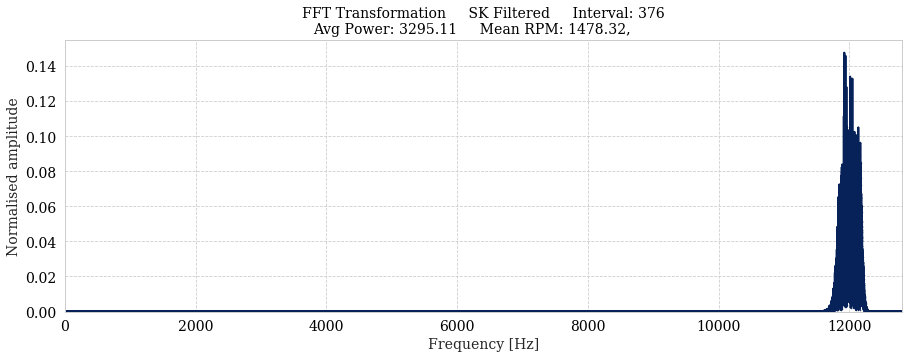

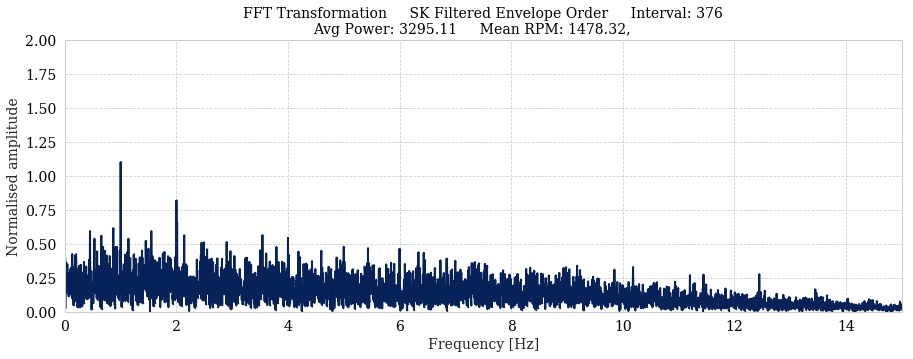

Kurtosis of 376 0.119
Center Frequency: 12000.000
Used Bandwidth in orders: 16.235


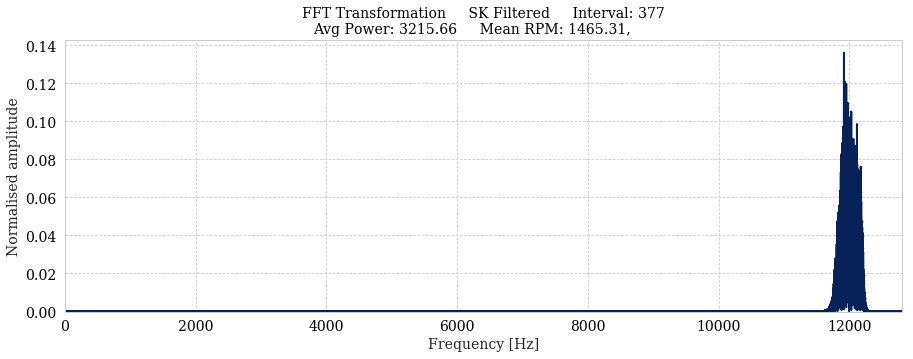

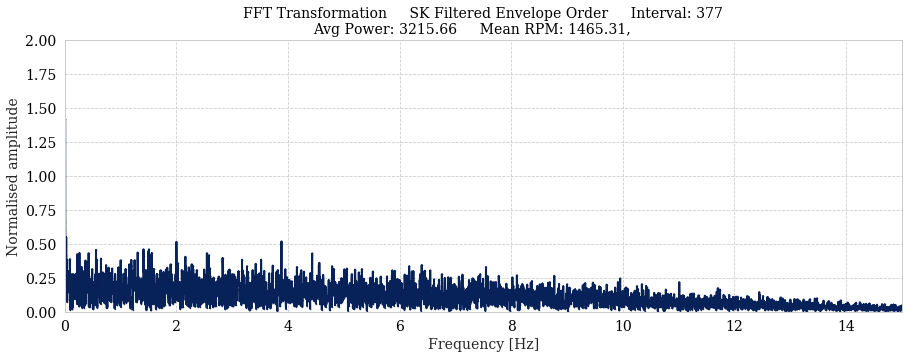

Kurtosis of 377 0.178
Center Frequency: 12000.000
Used Bandwidth in orders: 16.379


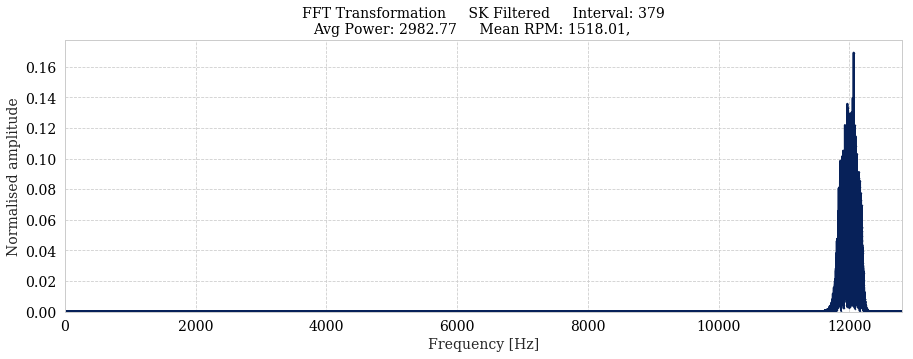

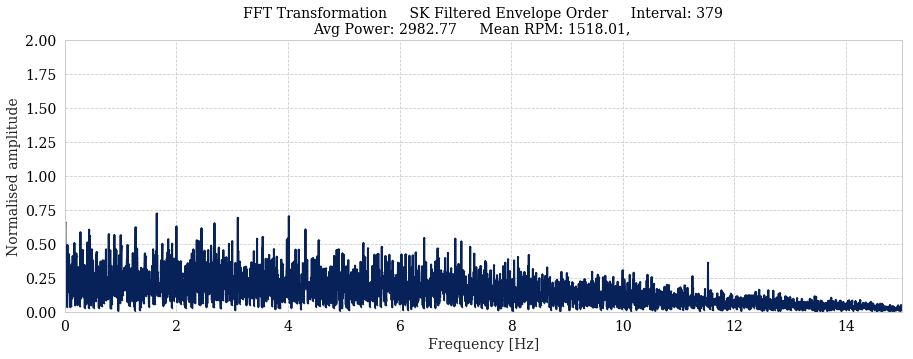

Kurtosis of 379 0.021
Center Frequency: 12000.000
Used Bandwidth in orders: 15.810


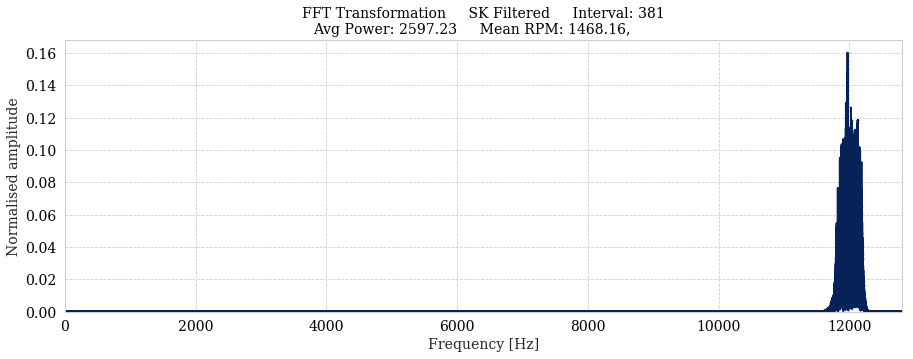

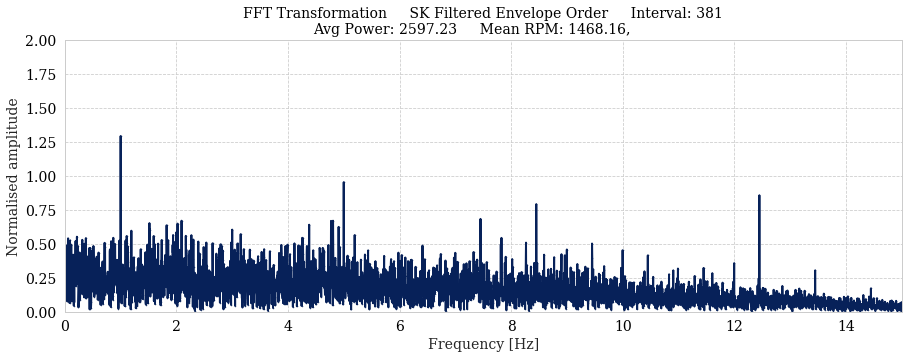

Kurtosis of 381 0.106
Center Frequency: 12000.000
Used Bandwidth in orders: 16.347


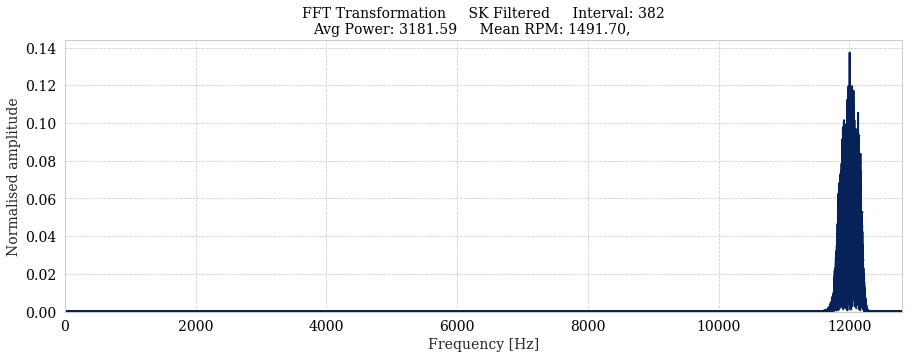

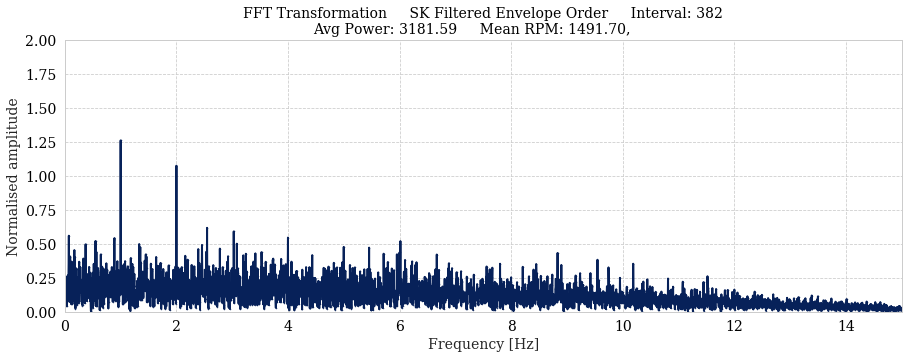

Kurtosis of 382 -0.008
Center Frequency: 12000.000
Used Bandwidth in orders: 16.089


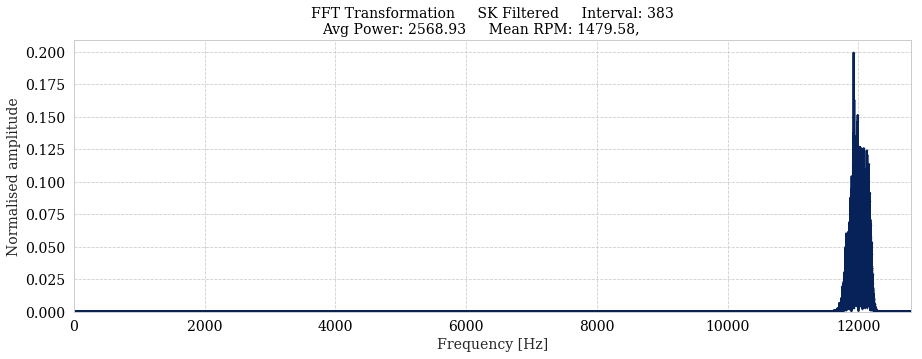

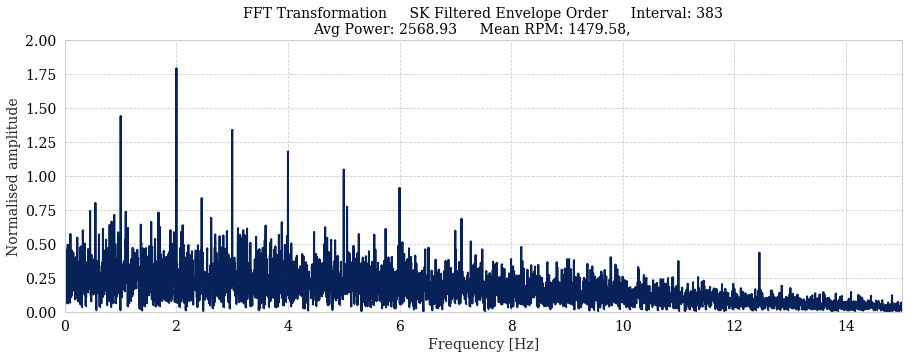

Kurtosis of 383 0.038
Center Frequency: 12000.000
Used Bandwidth in orders: 16.221


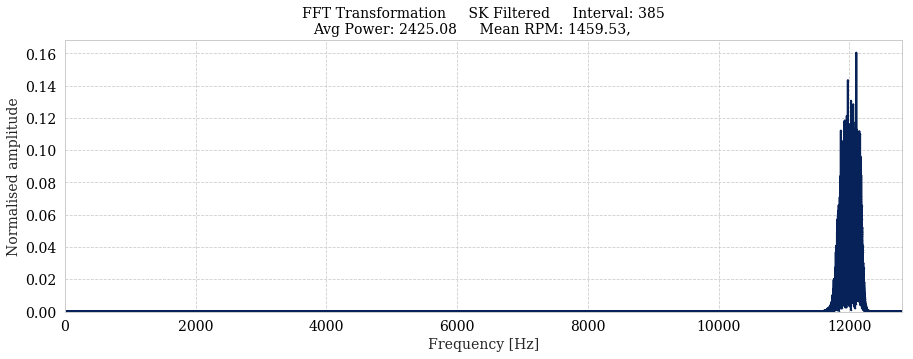

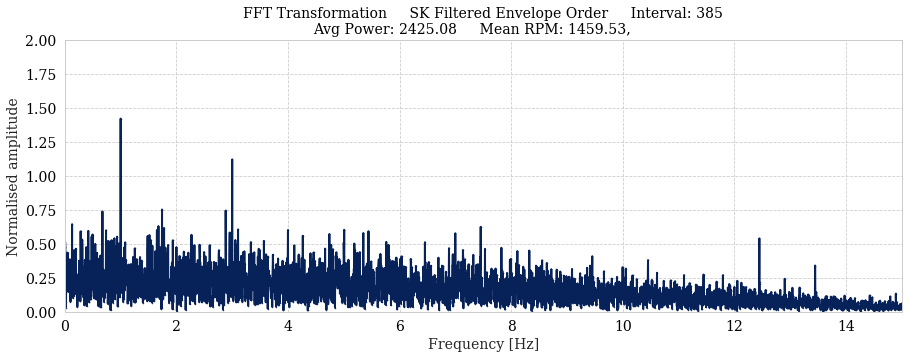

Kurtosis of 385 0.098
Center Frequency: 12000.000
Used Bandwidth in orders: 16.444


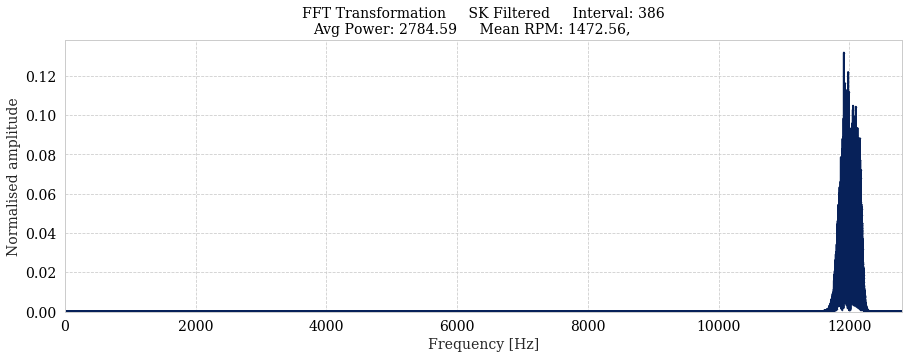

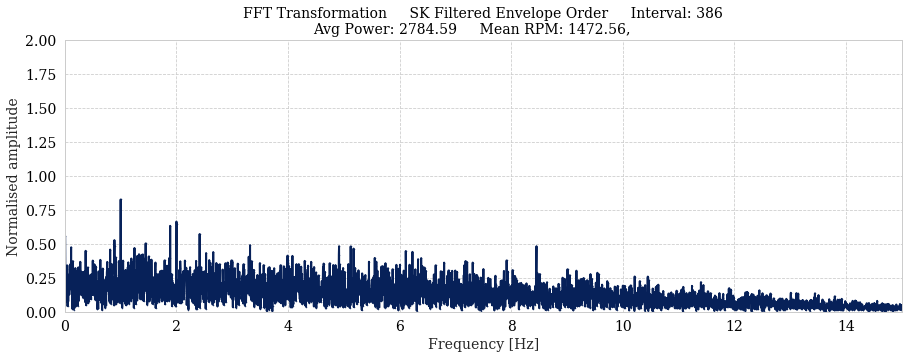

Kurtosis of 386 0.049
Center Frequency: 12000.000
Used Bandwidth in orders: 16.298


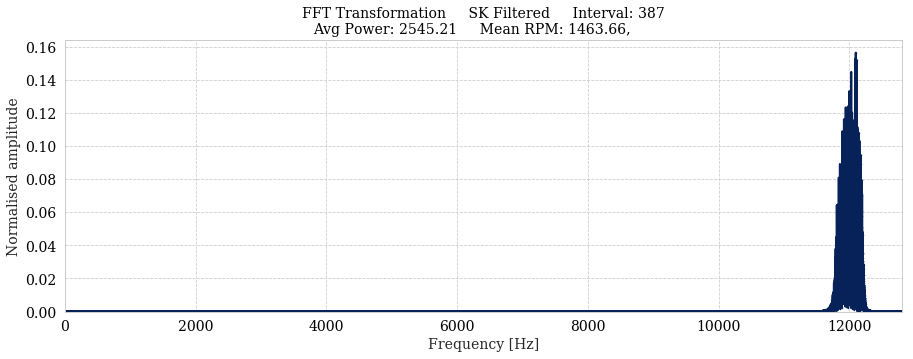

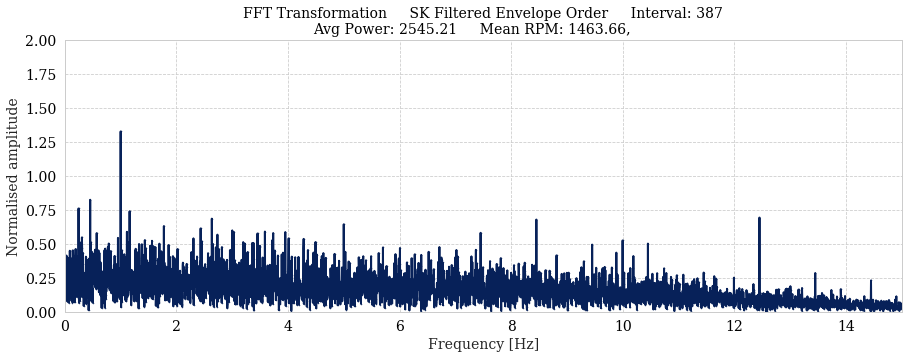

Kurtosis of 387 0.027
Center Frequency: 12000.000
Used Bandwidth in orders: 16.397


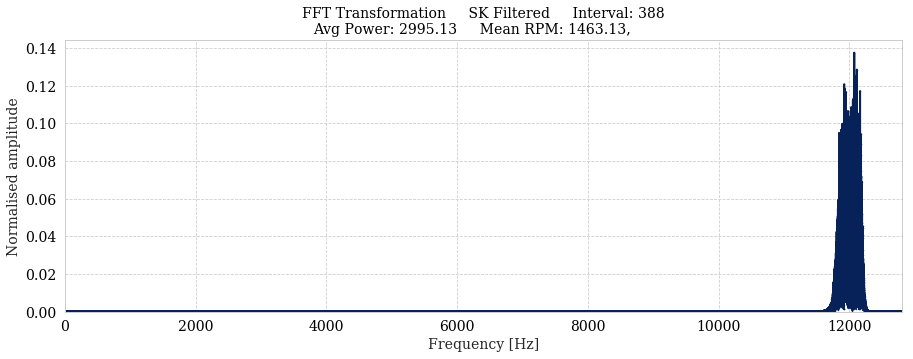

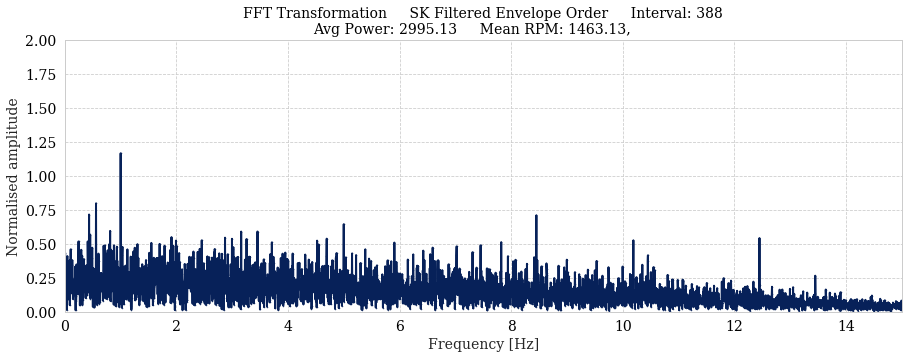

Kurtosis of 388 0.035
Center Frequency: 12000.000
Used Bandwidth in orders: 16.403


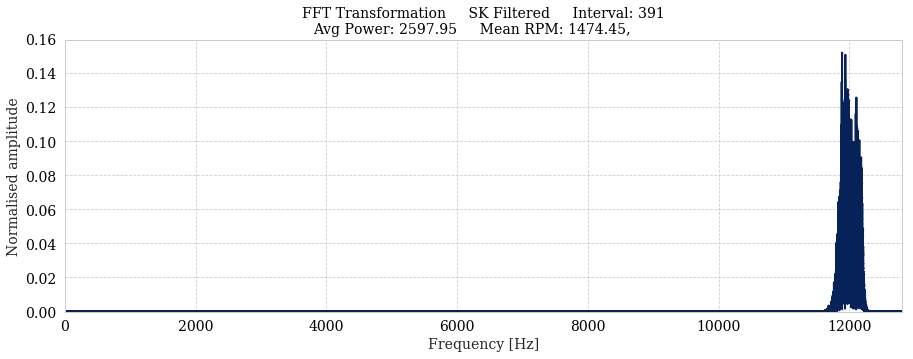

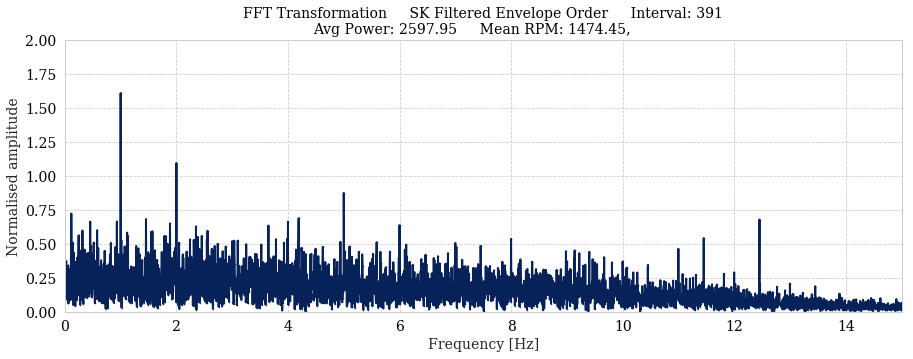

Kurtosis of 391 0.018
Center Frequency: 12000.000
Used Bandwidth in orders: 16.277


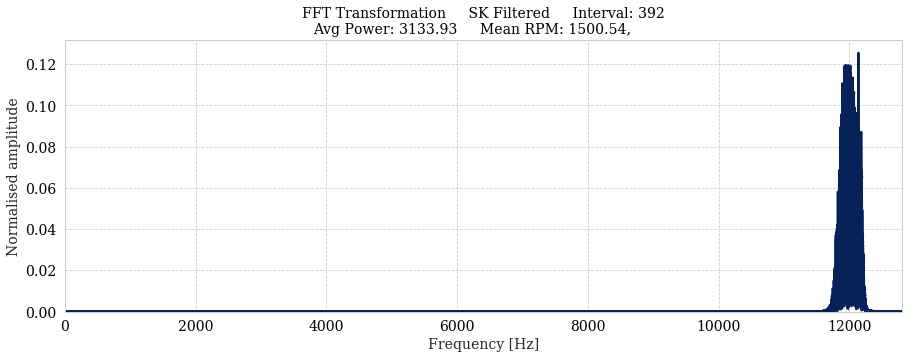

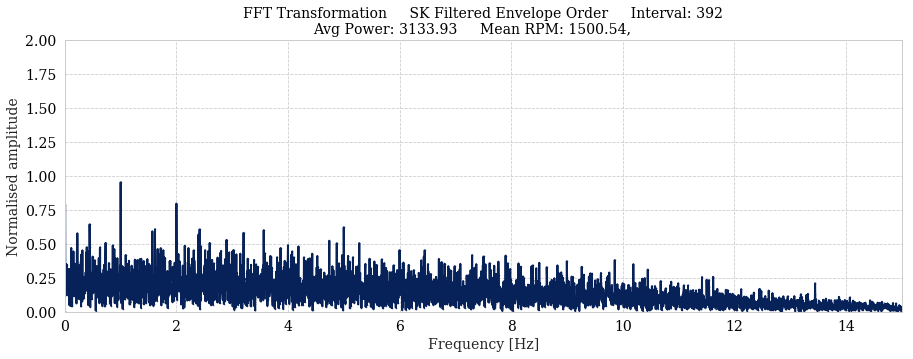

Kurtosis of 392 0.062
Center Frequency: 12000.000
Used Bandwidth in orders: 15.994


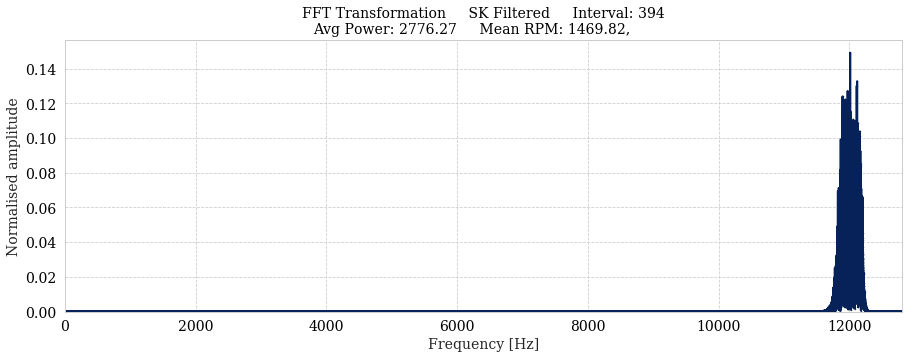

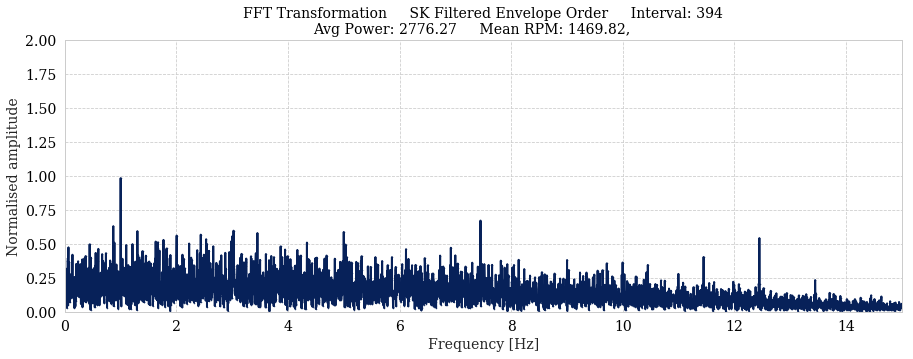

Kurtosis of 394 -0.089
Center Frequency: 12000.000
Used Bandwidth in orders: 16.329


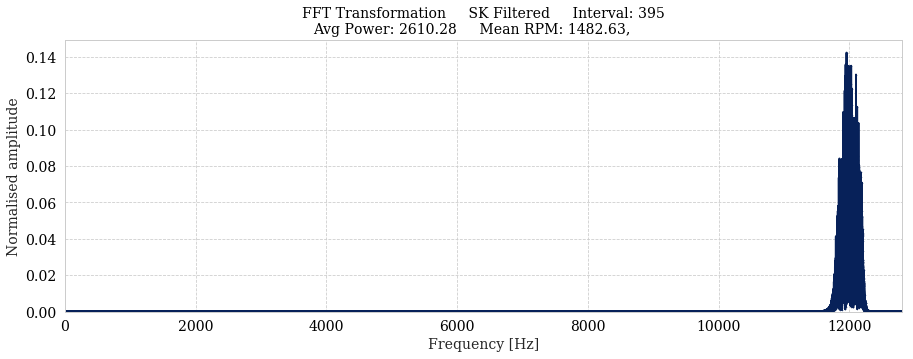

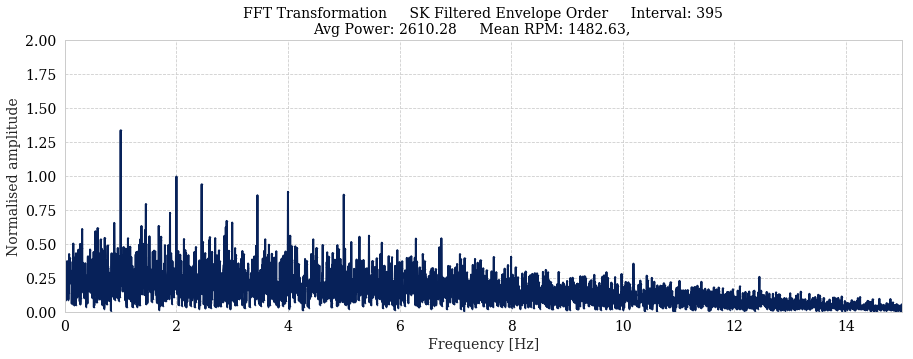

Kurtosis of 395 0.087
Center Frequency: 12000.000
Used Bandwidth in orders: 16.187


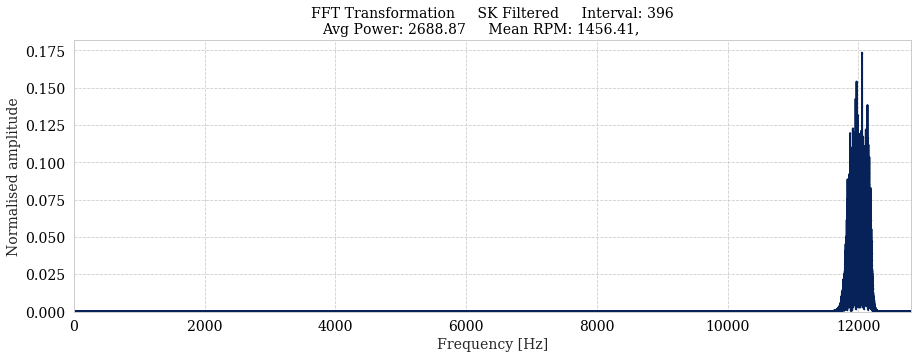

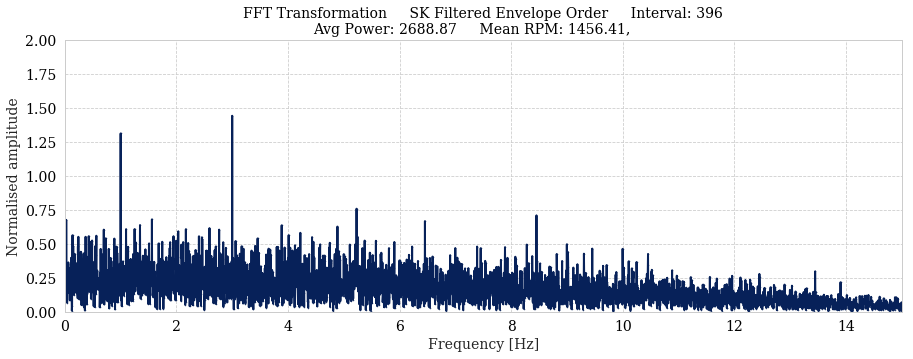

Kurtosis of 396 0.050
Center Frequency: 12000.000
Used Bandwidth in orders: 16.479


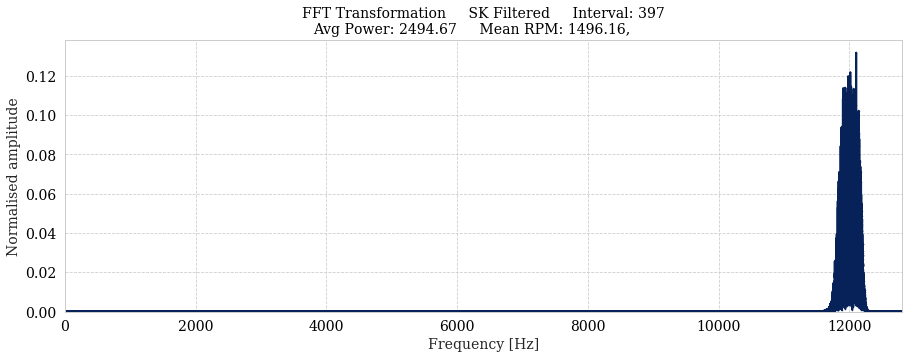

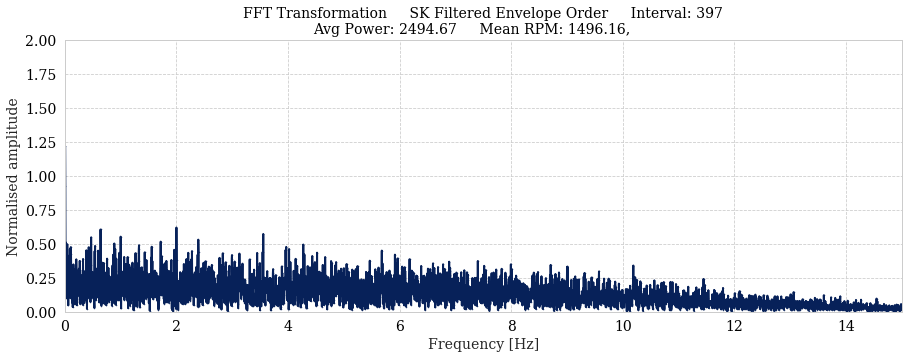

Kurtosis of 397 -0.010
Center Frequency: 12000.000
Used Bandwidth in orders: 16.041


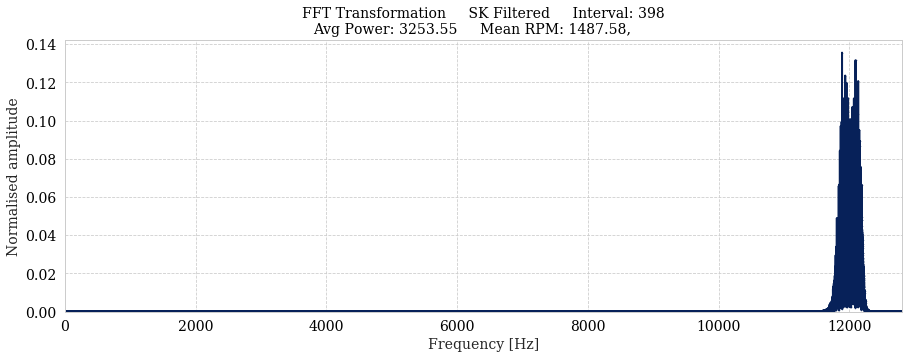

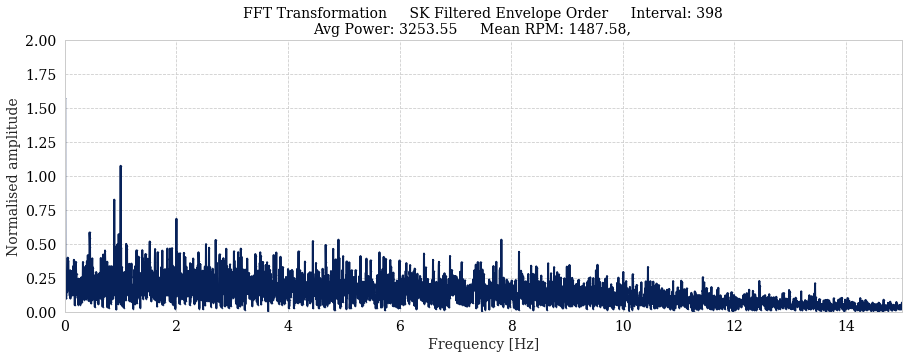

Kurtosis of 398 0.116
Center Frequency: 12000.000
Used Bandwidth in orders: 16.134


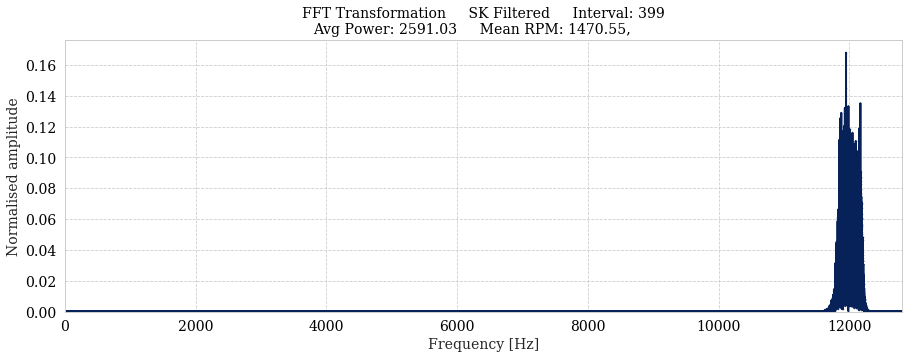

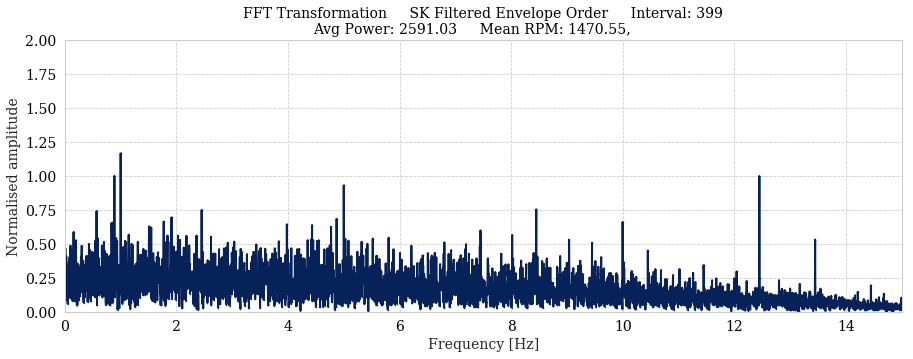

Kurtosis of 399 0.051
Center Frequency: 12000.000
Used Bandwidth in orders: 16.320


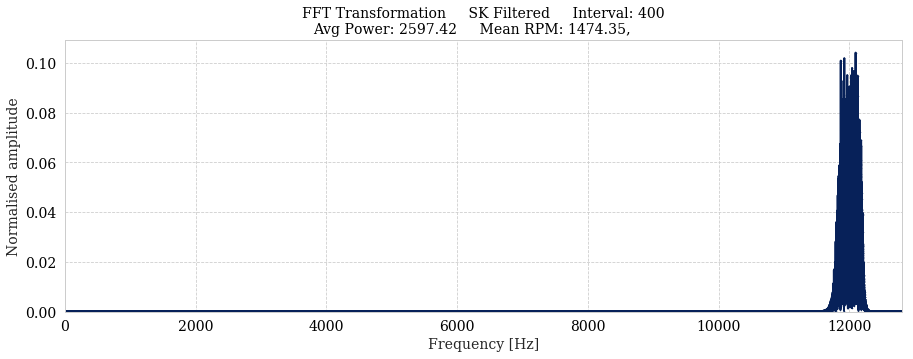

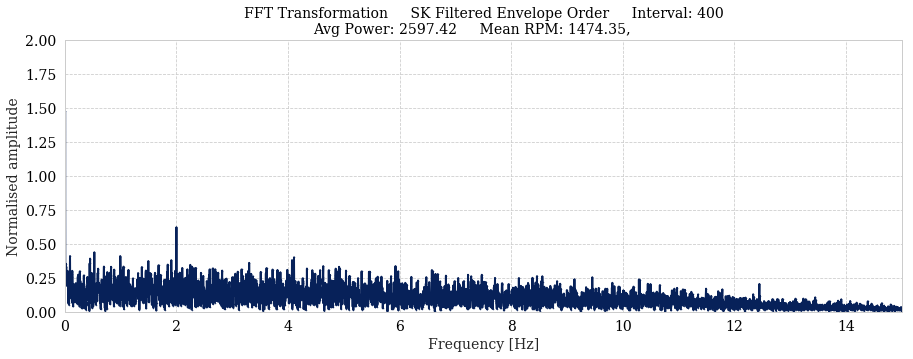

Kurtosis of 400 0.147
Center Frequency: 12000.000
Used Bandwidth in orders: 16.278


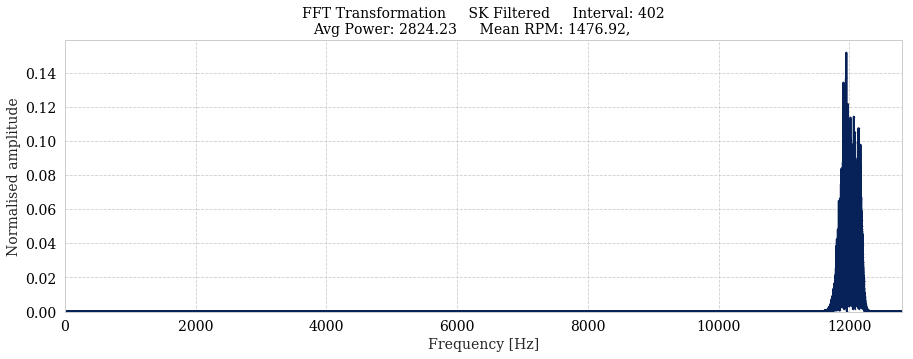

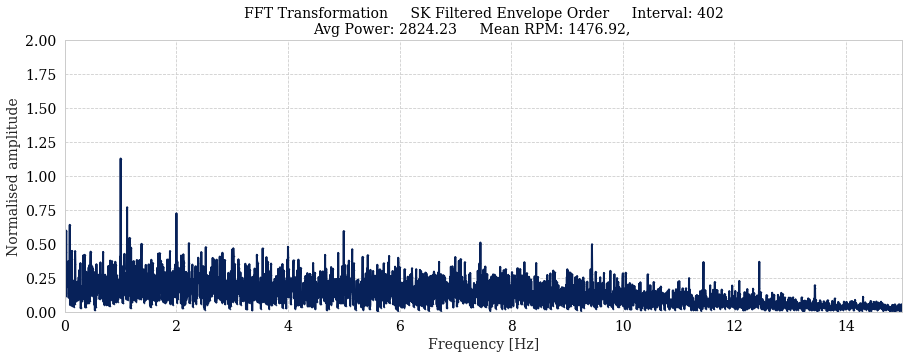

Kurtosis of 402 -0.028
Center Frequency: 12000.000
Used Bandwidth in orders: 16.250


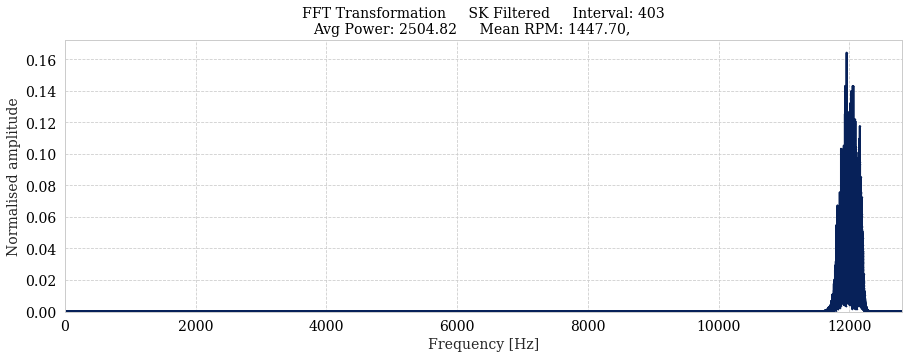

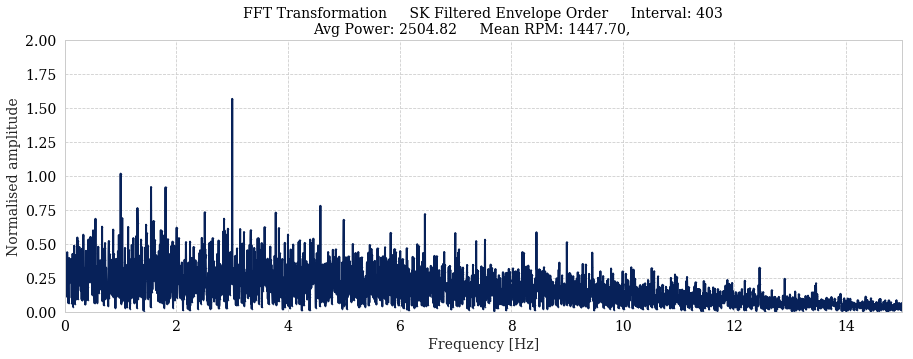

Kurtosis of 403 0.135
Center Frequency: 12000.000
Used Bandwidth in orders: 16.578


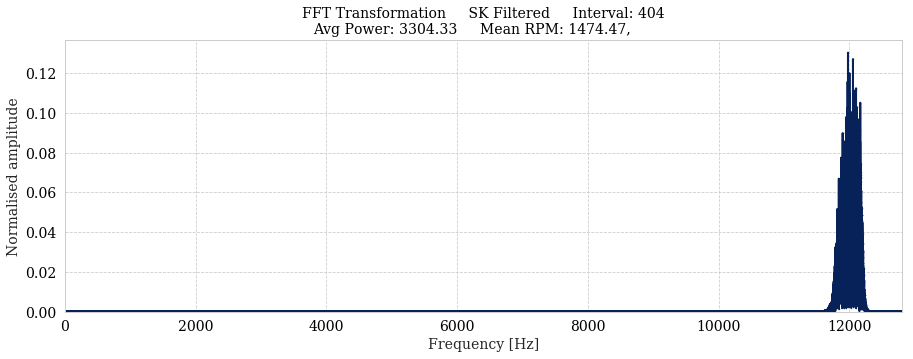

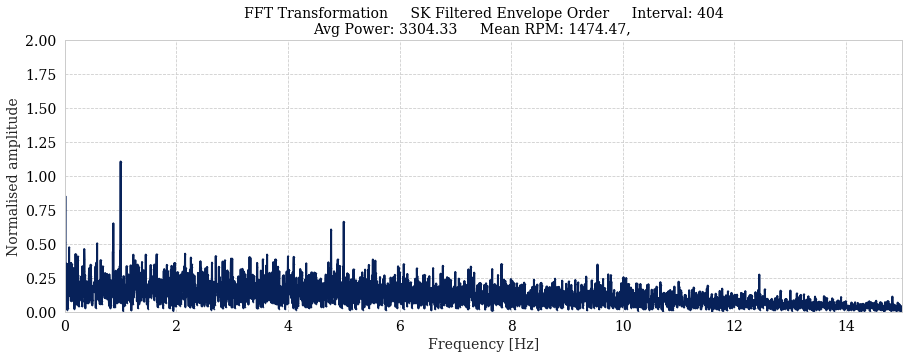

Kurtosis of 404 0.237
Center Frequency: 12000.000
Used Bandwidth in orders: 16.277


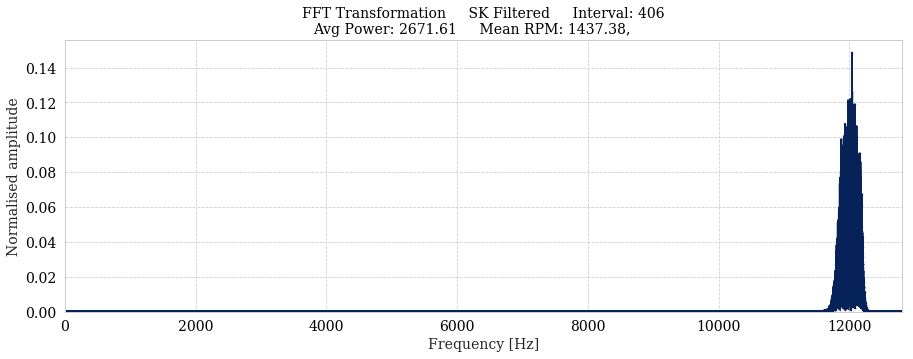

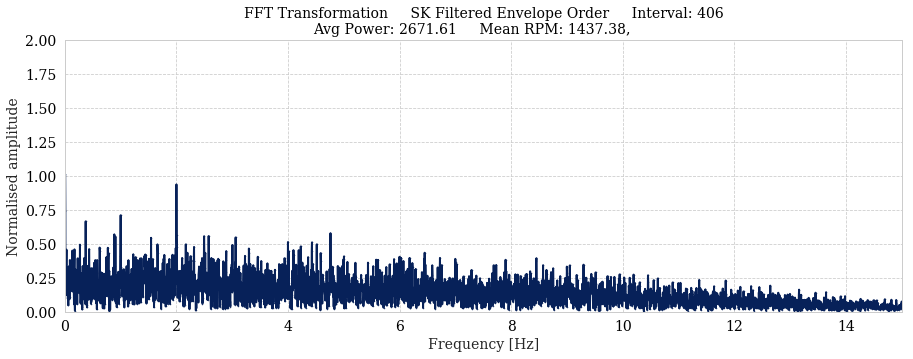

Kurtosis of 406 0.148
Center Frequency: 12000.000
Used Bandwidth in orders: 16.697


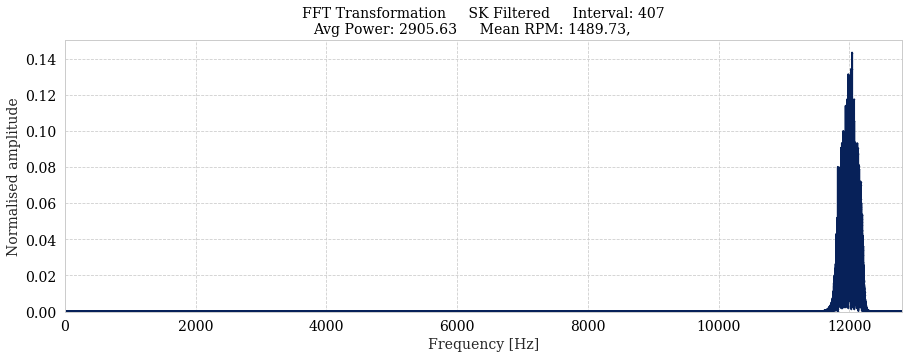

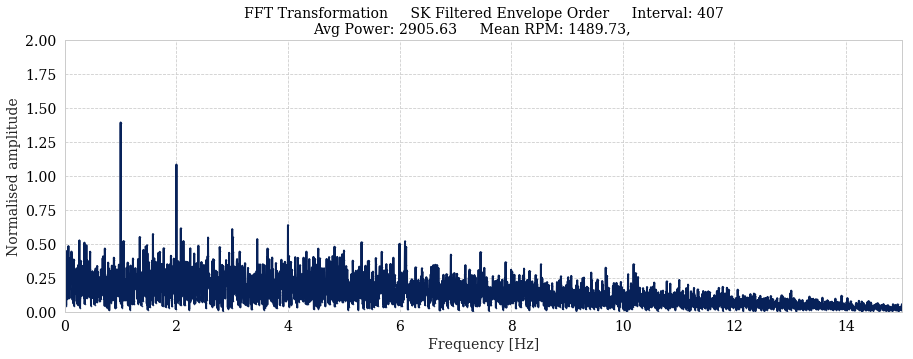

Kurtosis of 407 -0.019
Center Frequency: 12000.000
Used Bandwidth in orders: 16.110


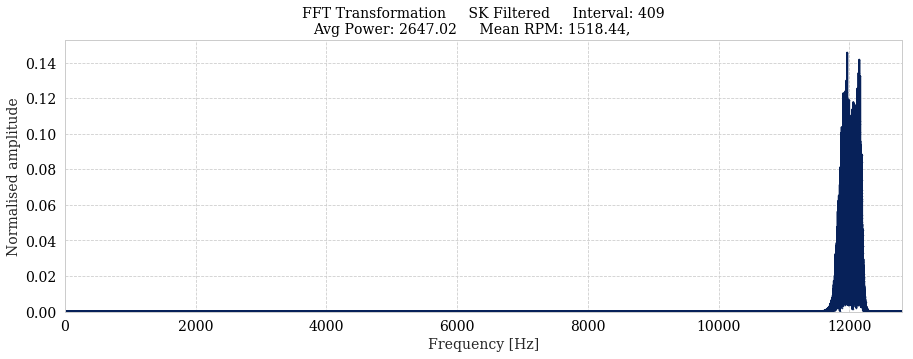

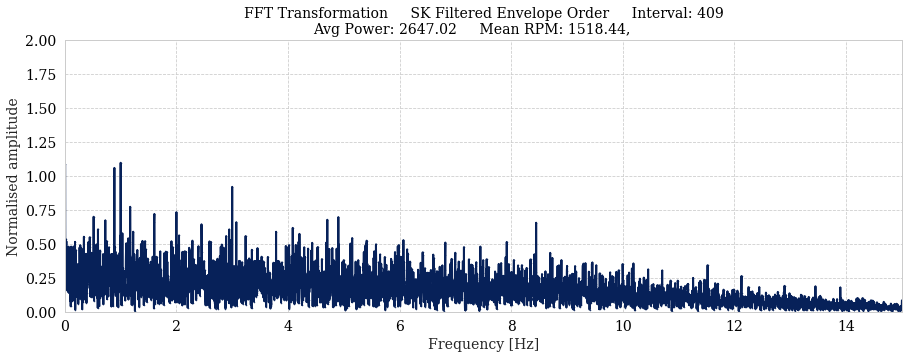

Kurtosis of 409 0.047
Center Frequency: 12000.000
Used Bandwidth in orders: 15.806


In [35]:
interesting_intervals = [31,91,95,147,191,224,231,232,266,284,312,347]
bandpassed_signal = bandpassed_12K
cf =12000

for i, signal in enumerate(bandpassed_signal):
#for i in interesting_intervals:
    if avg_power[i] < 2400:
        continue
    bw = float(concated['Bandwidths'][i])
    if i == 50:
        print('------------------------------------------------\n\n')
        print('               FIRST 50 FINISHED')
        print('\n\n------------------------------------------------')
    if i< 50 or i>370: #bw < 1000 and i<50:# or (i>50 and i<60) or (i > 190 and i < 200)):
        # Plot SK filtered signal
        #plotting_methods.plot_signal(times[i][1:], bandpassed_signal[i],name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        plotting_methods.plot_fft(times[i][1:], bandpassed_signal[i], name='SK Filtered', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calcutale envelope
        highut_lp = 1000
        rectified = abs(bandpassed_signal[i])**2
        bandpass_filtered_rect_lp = filters.butter_lp_filter(rectified, highut_lp, fs, order=5)
        
        #Plot envelope signal
        one_order = avg_rpm[i]/60
        freq=[one_order]
        #plotting_methods.plot_fft(times[i][1:], bandpass_filtered_rect_lp, x_max=100,frequency_lines=freq,name='SK Filtered Envelope', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        
        #Calculate Envelope Order
        try:
            x_round, resampled_envelope, x_time = resample_signals.do_cubic_resampling(times[i][1:], bandpass_filtered_rect_lp, peak_array[i], number_of_resample_points=2000)
            plotting_methods.plot_fft(x_round, resampled_envelope, x_max=15, y_max=2,frequency_lines=[], name='SK Filtered Envelope Order', interval_num=i, avg_power=avg_power[i], avg_rpm=avg_rpm[i])
        except: #If resampling fails for some reason
            print('---------------------------------------\n\n')
            print(f'              INTERVAL {i}')
            print('ENVELOPE ORDER COULD NOT BE CALCULATED!\n\n')
            print('---------------------------------------')
        
        # Print key values
        print(f'Kurtosis of {i} {kurtosis(bandpassed_signal[i]):.3f}')
        print(f'Center Frequency: {cf:.3f}')
        print(f'Used Bandwidth in orders: {400*60/avg_rpm[i]:.3f}')
